In [1]:
# importing libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing dataset
df=pd.read_csv('used_car_dataset.csv')

In [3]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

# Overviewing Dataset

In [4]:
df.head(20)

,Unnamed: 0,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
0,0,Maruti,S PRESSO,VXI,NaN,2020,179,Petrol,1st Owner,AHMEDABAD,434399
1,1,Maruti,Baleno DELTA,DELTA,MANUAL,2020,3920,Petrol,1st Owner,AHMEDABAD,652799
2,2,Maruti,S PRESSO,VXI,NaN,2020,3176,Petrol,1st Owner,AHMEDABAD,402199
3,3,Hyundai,Grand i10,MAGNA,MANUAL,2014,15033,Petrol,1st Owner,AHMEDABAD,372099
4,4,Maruti,Alto 800,VXI,MANUAL,2014,12535,Petrol,1st Owner,AHMEDABAD,298899
5,5,Maruti,Swift ZXI,ZXI,MANUAL,2012,15538,Petrol,1st Owner,AHMEDABAD,449099
6,6,Maruti,Baleno SIGMA,SIGMA,MANUAL,2020,5645,Petrol,1st Owner,AHMEDABAD,568999
7,7,Hyundai,Grand i10,ASTA,AUTOMATIC,2014,26779,Petrol,1st Owner,AHMEDABAD,420000
8,8,Maruti,Alto 800,LXI,MANUAL,2017,9527,Petrol,1st Owner,AHMEDABAD,304999
9,9,Maruti,Alto 800,LXI,MANUAL,2015,9217,Petrol,1st Owner,AHMEDABAD,287899


In [75]:
df.tail(20)

,Unnamed: 0,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
6921,6921,Mercedes-Benz,M-Class,ML 350 CDI,Automatic,2013,87000,Diesel,First,Chandigarh,2050000
6922,6922,Mahindra,Bolero,Power Plus ZLX [2016-2019],Manual,2016,60000,Diesel,First,Chandigarh,640000
6923,6923,Hyundai,Creta,1.6 SX,Manual,2015,93000,Diesel,First,Chandigarh,795000
6924,6924,Toyota,Innova,2.0 G1 BS-IV,Manual,2012,82000,Petrol,First,Chandigarh,650000
6925,6925,Maruti Suzuki,Vitara Brezza,ZDi Plus,Manual,2019,32000,Diesel,First,Chandigarh,1000000
6926,6926,Renault,Duster,85 PS RXZ 4X2 MT Diesel (Opt),Manual,2017,90000,Diesel,First,Chandigarh,700000
6927,6927,Maruti Suzuki,Eeco,5 STR WITH A/C+HTR CNG [2019],Manual,2019,50000,CNG + Cng,First,Chandigarh,409999
6928,6928,Maruti Suzuki,Eeco,5 STR WITH A/C+HTR [2014-2019],Manual,2011,63884,Petrol,First,Mohali,240000
6929,6929,Maruti Suzuki,Eeco,5 STR WITH A/C+HTR [2014-2019],Manual,2011,40000,Petrol + CNG,First,Chandigarh,189000
6930,6930,BMW,M2,Competition,Automatic,2019,2905,Petrol,UnRegistered Car,Pune,7700000


In [76]:
# Checking Dataset Info

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6941 entries, 0 to 6940
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Unnamed: 0         6941 non-null   int64 
 1   Brand              6941 non-null   object
 2   Model              6941 non-null   object
 3   Variant            6941 non-null   object
 4   Transmission_Type  6804 non-null   object
 5   Year_of_Make       6941 non-null   object
 6   Kms_Driven         6941 non-null   object
 7   Fuel_Type          6941 non-null   object
 8   Owner              6941 non-null   object
 9   Location           6916 non-null   object
 10  Price              6941 non-null   object
dtypes: int64(1), object(10)
memory usage: 596.6+ KB


In [77]:
# Checking datatypes
df.dtypes

Unnamed: 0            int64
Brand                object
Model                object
Variant              object
Transmission_Type    object
Year_of_Make         object
Kms_Driven           object
Fuel_Type            object
Owner                object
Location             object
Price                object
dtype: object

We observe all the columns are object type. Year_of_Make, Kms_Driver and Price has to be integer.

In [6]:
# Checking Shape
df.shape

(6941, 10)

# Checking Null Values

In [79]:
df.isnull().sum()

Unnamed: 0             0
Brand                  0
Model                  0
Variant                0
Transmission_Type    137
Year_of_Make           0
Kms_Driven             0
Fuel_Type              0
Owner                  0
Location              25
Price                  0
dtype: int64

There are some null values present

# Preprocessing Dataset

Dataset Correction

dropping irrelevant column

In [197]:
df=df.drop(['Unnamed: 0'],axis=1)

Treating Null Values

In [198]:
df=df.dropna()

In [9]:
df.isnull().sum()

Brand                0
Model                0
Variant              0
Transmission_Type    0
Year_of_Make         0
Kms_Driven           0
Fuel_Type            0
Owner                0
Location             0
Price                0
dtype: int64

We dropped the null values. Checking dataset again

In [199]:
df.shape

(6780, 10)

In [200]:
# data percent lost
print(f'After removing null values we lost {round(((6941-6780)/6941)*100,2)}% of data')

After removing null values we lost 2.32% of data


During data scraping we appended not found values with a '-'. We check if there is any such entries and remove it

In [11]:
df[df['Brand']==('-')].head(10)

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
495,-,-,-,-,-,-,-,-,-,-
517,-,-,-,-,-,-,-,-,-,-
524,-,-,-,-,-,-,-,-,-,-
534,-,-,-,-,-,-,-,-,-,-
541,-,-,-,-,-,-,-,-,-,-
574,-,-,-,-,-,-,-,-,-,-
583,-,-,-,-,-,-,-,-,-,-
634,-,-,-,-,-,-,-,-,-,-
669,-,-,-,-,-,-,-,-,-,-
700,-,-,-,-,-,-,-,-,-,-


We have several rows with Dashed entry. We wil drop these rows.

In [201]:
df.drop(df[df['Brand']=='-'].index,inplace=True)

In [13]:
df[df['Price']==('-')]

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
5976,Ferrari,488,GTB,Automatic,2017,3000,Petrol,First,Delhi,-
5979,Lamborghini,Huracan,LP 610-4,Automatic,2014,16000,Petrol,Third,Faridabad,-
5981,Bentley,Continental GT,Speed,Automatic,2012,23000,Petrol,First,Delhi,-
5996,Rolls-Royce,Phantom,EWB,Automatic,2008,15632,Petrol,First,Mumbai,-
6098,Maruti Suzuki,Omni,8 STR BS-II,Manual,2005,25000,Petrol,First,Mumbai,-
6109,Bentley,Continental GT,Coupe,Automatic,2012,30000,Petrol,Second,Mumbai,-
6112,Lamborghini,Aventador,LP 700-4,Automatic,2012,11000,Petrol,Second,Pune,-
6125,BMW,i8,1.5 Hybrid,Automatic,2016,11000,Petrol,First,Mumbai,-
6396,Ford,Ikon,1.6 EXi,Manual,2005,75582,Petrol,Second,Hyderabad,-
6602,BMW,i8,1.5 Hybrid,Automatic,2019,1300,Petrol,First,Kolkata,-


We also have some dashed entries in our Traget Variable which needs to be removed

In [202]:
df.drop(df[df['Price']=='-'].index,inplace=True)

In [203]:
df.shape

(6590, 10)

In [90]:
# data percent lost
print(f'After removing rows with dashed values we lost {round(((6941-6590)/6941)*100,2)}% of data')

After removing rows with dashed values we lost 5.06% of data


# Converting numerical columns to integer

In [204]:
df['Year_of_Make']=df.Year_of_Make.astype('int')
df['Kms_Driven']=df.Kms_Driven.astype('int')
df['Price']=df.Price.astype('int')

In [17]:
df.dtypes

Brand                object
Model                object
Variant              object
Transmission_Type    object
Year_of_Make          int32
Kms_Driven            int32
Fuel_Type            object
Owner                object
Location             object
Price                 int32
dtype: object

In [93]:
# Analytical overview

df.describe()

,Year_of_Make,Kms_Driven,Price
count,6590.000000,6590.000000,6.590000e+03
mean,2015.045372,55253.628073,9.855029e+05
std,3.064725,39790.590203,1.206969e+06
min,1993.000000,1.000000,4.400000e+04
25%,2013.000000,27457.000000,3.935000e+05
50%,2015.000000,49207.500000,5.800000e+05
75%,2017.000000,74719.000000,9.750000e+05
max,2021.000000,920000.000000,9.990000e+06


# Data Cleaning and Correction

Checking the value count of less diverse columns first and treating them

In [102]:
df.Transmission_Type.value_counts()

Manual       2693
MANUAL       2072
Automatic    1407
AUTOMATIC     348
UP14            8
UP16            7
DL9C            6
DL7C            6
HR26            4
DL10            4
HR87            4
MH01            3
DL3C            2
DL14            2
DL2C            2
MH12            2
MH03            2
TS08            2
DL6C            2
KA05            1
MH11            1
AP36            1
KA51            1
KA50            1
KA02            1
MH02            1
KA03            1
TS10            1
KA04            1
MH13            1
DL4C            1
MH14            1
KA53            1
Name: Transmission_Type, dtype: int64

we have duplicate as well as errored values. We tratthe duplicate values and drop the errored values

In [205]:
df.drop(df[df['Transmission_Type']=='UP14'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='UP16'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='DL9C'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='DL7C'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='HR26'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='DL10'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='HR87'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='MH01'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='DL3C'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='DL14'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='DL2C'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='MH12'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='MH03'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='TS08'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='DL6C'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='KA05'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='MH11'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='AP36'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='KA51'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='KA50'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='KA02'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='MH02'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='KA03'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='TS10'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='KA04'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='MH13'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='DL4C'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='MH14'].index,inplace=True)
df.drop(df[df['Transmission_Type']=='KA53'].index,inplace=True)

In [206]:
df['Transmission_Type']=df['Transmission_Type'].replace('MANUAL','Manual').replace('AUTOMATIC','Automatic')

In [207]:
df.Transmission_Type.value_counts()

Manual       4765
Automatic    1755
Name: Transmission_Type, dtype: int64

In [22]:
df.Fuel_Type.value_counts()

Diesel              3159
Petrol              3150
CNG                   91
Petrol + CNG          49
Petrol + Petrol       23
CNG + Cng             18
Petrol + Cng           9
Petrol + LPG           5
CNG + CNG              3
Hybrid                 2
LPG                    2
CNG + Petrol           2
Petrol + Lpg           1
LPG + Lpg              1
Electric               1
CNG + Petrol+Cng       1
Petrol + Diesel        1
Diesel + Diesel        1
LPG + LPG              1
Name: Fuel_Type, dtype: int64

We have duplicate entries here which we will replace

In [208]:
df.replace({'Fuel_Type':{'Petrol + Petrol':'Petrol', 'CNG + Cng':'CNG', 'Petrol + Cng':'Petrol + CNG', 'CNG + CNG':'CNG', 'CNG + Petrol':'Petrol + CNG', 'Petrol + Lpg':'Petrol + LPG', 'Diesel + Diesel':'Diesel', 'LPG + Lpg':'LPG', 'CNG + Petrol+Cng':'Petrol + CNG', 'LPG + LPG':'LPG'}},inplace=True)

In [209]:
df.Fuel_Type.value_counts()

Petrol             3173
Diesel             3160
CNG                 112
Petrol + CNG         61
Petrol + LPG          6
LPG                   4
Hybrid                2
Electric              1
Petrol + Diesel       1
Name: Fuel_Type, dtype: int64

We removed the duplicates. We observe an entry which is Petrol + Diesel which is not possible. Thus, we assume it to be an error and thus drop this entry 

In [210]:
df.drop(df[df['Fuel_Type']=='Petrol + Diesel'].index,inplace=True)

Moving on to Owner Column

In [211]:
df.Owner.value_counts()

1st Owner               2608
First Owner             1652
First                    829
2nd Owner                727
Second Owner             364
Second                   177
3rd Owner                 76
Third Owner               38
UnRegistered Car          17
Third                     15
Fourth & Above Owner       6
4th Owner                  5
Test Drive Car             3
4 or More                  2
Name: Owner, dtype: int64

Observed duplicate entries and will treat it

In [212]:
df.replace({'Owner':{'1st Owner': 1, 'First Owner':1, 'First':1, '2nd Owner':2, 'Second Owner':2, 'Second':2, '3rd Owner':3, 'Third Owner':3, 'Third':3, '4th Owner':4, 'Fourth & Above Owner':4, '4 or More':4, 'UnRegistered Car':0, 'Test Drive Car':0}},inplace=True)

In [213]:
df.Owner.value_counts()

1    5089
2    1268
3     129
0      20
4      13
Name: Owner, dtype: int64

Moving on to Location column

In [29]:
df.Location.value_counts()

Delhi          924
AHMEDABAD      620
Ahmedabad      445
Pune           425
Chennai        425
Bangalore      423
Mumbai         404
PUNE           374
BENGALURU      365
DELHI          340
CHENNAI        333
Hyderabad      329
Kolkata        269
Gurgaon        181
HYDERABAD      164
MUMBAI         100
Noida           90
Chandigarh      80
NOIDA           54
Thane           41
GURGAON         31
FARIDABAD       29
Ghaziabad       24
Faridabad       21
Navi Mumbai     14
SURAT           10
Dehradun         2
chinchwad        1
Mohali           1
Name: Location, dtype: int64

Here also we observe duplicates. Duplication is because of uppercase and lowercase characters.Thus, we convert text in the column to lowercase and replace Bangalore with Bangaluru (official name).

In [214]:
df['Location']=df['Location'].str.lower()

In [215]:
df.replace({'Location':{'bangalore': 'bengaluru'}},inplace=True)

In [216]:
df.Location.value_counts()

delhi          1264
ahmedabad      1065
pune            799
bengaluru       788
chennai         758
mumbai          504
hyderabad       493
kolkata         269
gurgaon         212
noida           144
chandigarh       80
faridabad        50
thane            41
ghaziabad        24
navi mumbai      14
surat            10
dehradun          2
mohali            1
chinchwad         1
Name: Location, dtype: int64

We have single entry for Mohali and Chinchwad. Thus, we will replace chinchwad with nearest city Pune and mohali with Chandigarh.

In [217]:
df.replace({'Location':{'mohali':'chandigarh','chinchwad':'pune'}},inplace=True)

In [218]:
df.Location.value_counts()

delhi          1264
ahmedabad      1065
pune            800
bengaluru       788
chennai         758
mumbai          504
hyderabad       493
kolkata         269
gurgaon         212
noida           144
chandigarh       81
faridabad        50
thane            41
ghaziabad        24
navi mumbai      14
surat            10
dehradun          2
Name: Location, dtype: int64

Now the location column is cleaned lets move to Brand name.

In [35]:
df.Brand.value_counts()

Maruti           2162
Hyundai           784
Toyota            621
Honda             422
Maruti Suzuki     313
Mahindra          300
BMW               285
Mercedes-Benz     251
Audi              241
Renault           188
Ford              176
Volkswagen        158
Tata               87
Skoda              84
Nissan             55
Mercedes           52
Land               40
Jeep               39
Chevrolet          39
Jaguar             38
Porsche            34
Volvo              32
Datsun             24
MG                 19
Kia                15
Mitsubishi         12
Ssangyong           7
Land Rover          6
Mini                6
Landrover           6
MINI                4
Bentley             4
Isuzu               2
ISUZU               2
Maserati            2
Fiat                2
Lamborghini         2
Aston               2
DC                  1
Aston Martin        1
Lexus               1
Name: Brand, dtype: int64

First we will convert text to lowercase to eliminate case differences and replace mercedes with mercede-benz, aston with aston martin, land and landrover with land rover.

In [219]:
df['Brand']=df['Brand'].str.lower()

In [37]:
df.Brand.value_counts()

maruti           2162
hyundai           784
toyota            621
honda             422
maruti suzuki     313
mahindra          300
bmw               285
mercedes-benz     251
audi              241
renault           188
ford              176
volkswagen        158
tata               87
skoda              84
nissan             55
mercedes           52
land               40
jeep               39
chevrolet          39
jaguar             38
porsche            34
volvo              32
datsun             24
mg                 19
kia                15
mitsubishi         12
mini               10
ssangyong           7
landrover           6
land rover          6
isuzu               4
bentley             4
fiat                2
lamborghini         2
aston               2
maserati            2
dc                  1
lexus               1
aston martin        1
Name: Brand, dtype: int64

In [220]:
df.replace({'Brand':{'mercedes':'mercedes-benz', 'land':'land rover','landrover':'land rover', 'aston':'aston martin'}},inplace=True)

In [41]:
df.Brand.value_counts()

maruti           2162
hyundai           784
toyota            621
honda             422
maruti suzuki     313
mercedes-benz     303
mahindra          300
bmw               285
audi              241
renault           188
ford              176
volkswagen        158
tata               87
skoda              84
nissan             55
land rover         52
jeep               39
chevrolet          39
jaguar             38
porsche            34
volvo              32
datsun             24
mg                 19
kia                15
mitsubishi         12
mini               10
ssangyong           7
isuzu               4
bentley             4
aston martin        3
fiat                2
lamborghini         2
maserati            2
dc                  1
lexus               1
Name: Brand, dtype: int64

Moving to Model Name first we will lower the case and see the value counts

In [236]:
df['Model']=df['Model'].str.lower()

In [237]:
df.Model.value_counts()

swift dzire             459
vitara brezza           211
eeco 5                  173
innova 2.5              172
grand i10               163
alto 800                152
eeco                    148
innova crysta           119
wagon r                 115
alto k10                100
ciaz                     95
corolla altis            91
baleno                   80
creta 1.6                78
ecosport 1.5             76
swift                    71
city                     69
3 series                 65
alto lxi                 54
5 series                 54
creta                    52
fortuner 3.0             51
ertiga vdi               46
elite i20                45
e r t i g a              43
i20                      42
city v                   40
omni                     39
celerio                  37
i10 sportz               36
xuv500 w8                35
duster                   34
verna                    34
swift vxi                34
verna fluidic            33
xuv500 w10          

We will use the model column to examine the Variant column in small pieces(like below) to make the data in Variant column less diverse and replace any logically repetitive entries. Also, we will replace repetitive entries in the Model column encountered along.

In [238]:
df[df['Model']==('swift dzire')]

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
80,maruti,swift dzire,vdi,Manual,2012,48390,Diesel,1,ahmedabad,311499
81,maruti,swift dzire,zdi,Manual,2014,27735,Diesel,1,ahmedabad,454899
82,maruti,swift dzire,vdi,Manual,2013,39947,Diesel,1,ahmedabad,393299
83,maruti,swift dzire,vdi,Manual,2013,44284,Diesel,1,ahmedabad,376999
85,maruti,swift dzire,vdi,Manual,2012,42478,Diesel,2,ahmedabad,345599
90,maruti,swift dzire,vxi,Manual,2010,44518,Petrol,1,ahmedabad,264299
93,maruti,swift dzire,vdi,Manual,2014,42045,Diesel,1,ahmedabad,458199
95,maruti,swift dzire,vdi,Manual,2012,65946,Diesel,1,ahmedabad,329299
96,maruti,swift dzire,vxi,Manual,2013,27712,Petrol,1,ahmedabad,385000
98,maruti,swift dzire,vdi,Manual,2012,82064,Diesel,1,ahmedabad,346799


In [239]:
# checking unique value count in Variant and Model
print('Number of unique variables in model column is : ',df.Model.nunique())
print('Number of unique variables in variant column is : ',df.Variant.nunique())

Number of unique variables in model column is :  700
Number of unique variables in variant column is :  1284


In [240]:
# converting the variant column to lower case to eliminate any case differences
df['Variant']=df['Variant'].str.lower()

In [241]:
df.Variant.nunique()

1284

lets check again and start cleaning

In [242]:
# making a copy of the dataset
df2=df.copy()

In [243]:
df2

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
1,maruti,baleno delta,delta,Manual,2020,3920,Petrol,1,ahmedabad,652799
3,hyundai,grand i10,magna,Manual,2014,15033,Petrol,1,ahmedabad,372099
4,maruti,alto 800,vxi,Manual,2014,12535,Petrol,1,ahmedabad,298899
5,maruti,swift zxi,zxi,Manual,2012,15538,Petrol,1,ahmedabad,449099
6,maruti,baleno sigma,sigma,Manual,2020,5645,Petrol,1,ahmedabad,568999
7,hyundai,grand i10,asta,Automatic,2014,26779,Petrol,1,ahmedabad,420000
8,maruti,alto 800,lxi,Manual,2017,9527,Petrol,1,ahmedabad,304999
9,maruti,alto 800,lxi,Manual,2015,9217,Petrol,1,ahmedabad,287899
10,hyundai,grand i10,magna,Manual,2017,9249,Petrol,1,ahmedabad,424399
11,maruti,swift vxi,vxi,Manual,2014,34710,Petrol,2,ahmedabad,374699


In [244]:
# Checking dataset where model column has swift in name 
df2[df2['Model'].str.contains('swift')]

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
5,maruti,swift zxi,zxi,Manual,2012,15538,Petrol,1,ahmedabad,449099
11,maruti,swift vxi,vxi,Manual,2014,34710,Petrol,2,ahmedabad,374699
17,maruti,swift lxi,lxi,Manual,2019,7032,Petrol,1,ahmedabad,509399
18,maruti,swift lxi,lxi,Manual,2012,40551,Petrol,1,ahmedabad,314599
21,maruti,swift vdi,vdi,Manual,2013,39124,Diesel,1,ahmedabad,312499
32,maruti,swift zdi,zdi,Manual,2013,24022,Diesel,1,ahmedabad,409299
41,maruti,swift vdi,vdi,Manual,2017,16646,Diesel,1,ahmedabad,479299
45,maruti,swift lxi,lxi,Manual,2013,26908,Petrol,1,ahmedabad,394599
47,maruti,swift lxi,lxi,Manual,2017,24562,Petrol,1,ahmedabad,438699
54,maruti,swift vxi,vxi,Manual,2012,34092,Petrol,1,ahmedabad,338999


we fetched rows which contains swift in model name to a new dataframe to get an idea of values

In [245]:
test1=df2[df2['Model'].str.contains('swift')]

In [51]:
test1.Variant.value_counts()

vxi                         195
vdi                         166
zdi                          42
zxi                          35
ldi                          29
lxi                          27
vxi 1.2 bs iv                17
vxi 1.2                      16
lxi option                    7
vdi bsiv                      7
amt vxi bs iv                 6
tour 1.2                      6
vxi bsiv                      5
bsiv                          5
lxi bsiv                      4
amt zdi                       4
optional                      3
vdi abs [2014-2017]           3
lxi optional-o                3
vxi optional                  2
amt vdi                       2
vxi [2014-2017]               2
zxi plus bs iv                2
zxi 1.2                       2
zdi amt                       2
vxi abs                       1
tour s                        1
vdi [2014-2017]               1
zxi 1.2 bs-iv                 1
ldi [2014-2017]               1
zxi plus amt [2018-2019]      1
bsiii   

In [52]:
test1.Model.value_counts()

swift dzire    459
swift           71
swift vxi       34
swift lxi       15
swift vdi       13
swift zxi        5
swift ldi        5
swift zdi        5
Name: Model, dtype: int64

In [246]:
# First we replace Brand name from Maruti to Maruti Suzuki where model name has swift in it

df2.loc[(df2['Model'].str.contains('swift')),'Brand']='maruti suzuki'

In [247]:
df2[df2['Model'].str.contains('swift')]

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
5,maruti suzuki,swift zxi,zxi,Manual,2012,15538,Petrol,1,ahmedabad,449099
11,maruti suzuki,swift vxi,vxi,Manual,2014,34710,Petrol,2,ahmedabad,374699
17,maruti suzuki,swift lxi,lxi,Manual,2019,7032,Petrol,1,ahmedabad,509399
18,maruti suzuki,swift lxi,lxi,Manual,2012,40551,Petrol,1,ahmedabad,314599
21,maruti suzuki,swift vdi,vdi,Manual,2013,39124,Diesel,1,ahmedabad,312499
32,maruti suzuki,swift zdi,zdi,Manual,2013,24022,Diesel,1,ahmedabad,409299
41,maruti suzuki,swift vdi,vdi,Manual,2017,16646,Diesel,1,ahmedabad,479299
45,maruti suzuki,swift lxi,lxi,Manual,2013,26908,Petrol,1,ahmedabad,394599
47,maruti suzuki,swift lxi,lxi,Manual,2017,24562,Petrol,1,ahmedabad,438699
54,maruti suzuki,swift vxi,vxi,Manual,2012,34092,Petrol,1,ahmedabad,338999


Replacing swift vxi, swift zdi etc in Model column with swift and variants with variants removing garbage text.

In [248]:
df2.replace({'Model':{'swift vxi':'swift','swift lxi':'swift', 'swift vdi':'swift', 'swift ldi':'swift', 'swift zxi':'swift', 'swift zdi':'swift'}},inplace=True)

In [249]:
# Now we will replace values in variant

df2.loc[(df2['Model'].str.contains('swift')) & (df2['Variant'].str.contains('vxi')),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('swift')) & (df2['Variant'].str.contains('lxi')),'Variant']='lxi'
df2.loc[(df2['Model'].str.contains('swift')) & (df2['Variant'].str.contains('vdi')),'Variant']='vdi'
df2.loc[(df2['Model'].str.contains('swift')) & (df2['Variant'].str.contains('ldi')),'Variant']='ldi'
df2.loc[(df2['Model'].str.contains('swift')) & (df2['Variant'].str.contains('zxi')),'Variant']='zxi'
df2.loc[(df2['Model'].str.contains('swift')) & (df2['Variant'].str.contains('zdi')),'Variant']='zdi'

In [250]:
test1=df2[df2['Model'].str.contains('swift')]

In [251]:
test1.Model.value_counts()

swift dzire    459
swift          148
Name: Model, dtype: int64

In [252]:
test1=df2[df2['Model'].str.contains('brezza')]

In [253]:
test1.Variant.value_counts()

zdi                           73
vdi                           66
zdi plus                      15
ldi                           15
vdi option                    12
zdi amt                        8
zxi                            7
zdi plus dual tone             6
vdi (o) [2016-2018]            4
vdi amt                        3
zdi+ dual tone [2017-2018]     2
Name: Variant, dtype: int64

In [254]:
# Replacing brand with Maruti Suzuki
df2.loc[(df2['Model'].str.contains('brezza')),'Brand']='maruti suzuki'

In [255]:
# No we will replace values in variant

df2.replace({'Variant':{'zdi plus dual tone':'zdi plus','vdi (o) [2016-2018]':'vdi option', 'zdi amt':'zdi', 'vdi amt':'vdi', 'zdi+ dual tone [2017-2018]':'zdi plus'}},inplace=True)

In [256]:
df2[df2['Model'].str.contains('eeco')]

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
160,maruti,eeco 5,5,Manual,2019,8454,Petrol,1,ahmedabad,425399
165,maruti,eeco 5,5,Manual,2019,23051,Petrol + CNG,1,ahmedabad,469399
166,maruti,eeco 5,5,Manual,2018,55443,Petrol + CNG,1,ahmedabad,363499
180,maruti,eeco 5,5,Manual,2018,54422,Petrol + CNG,2,ahmedabad,333899
185,maruti,eeco 5,5,Manual,2018,62858,Petrol + CNG,1,ahmedabad,354199
203,maruti,eeco 5,5,Manual,2016,81318,Petrol + CNG,1,ahmedabad,266699
530,maruti,eeco 5,5,Manual,2019,8454,Petrol,1,delhi,425399
535,maruti,eeco 5,5,Manual,2019,23051,Petrol + CNG,1,delhi,469399
536,maruti,eeco 5,5,Manual,2018,55443,Petrol + CNG,1,delhi,363499
550,maruti,eeco 5,5,Manual,2018,54422,Petrol + CNG,2,delhi,333899


In [257]:
test1=df2[df2['Model'].str.contains('eeco')]

In [258]:
test1.Model.value_counts()

eeco 5         173
eeco           148
eeco 7          32
eeco cng        31
eeco flexi       5
eeco smiles      1
Name: Model, dtype: int64

In [259]:
test1.Variant.value_counts()

5                                     119
seater ac                              29
seater standard                        27
5 seater                               27
7 str [2014-2019]                      23
5 str with a/c+htr [2014-2019]         20
str with                               19
5 str with a/c+htr [2019-2020]         18
5 str [2014-2019]                      16
7 str [2019-2020]                      11
5 str with a/c+htr cng [2017-2019]     11
5 seater ac bsiv                       11
cng 5 seater ac                         8
seater std                              7
5 seater ac                             6
green                                   5
htr 5                                   5
5 str with a/c+htr cng [2019]           4
7                                       4
5 str with a/c+htr cng [2019-2020]      4
5 str [2019-2020]                       4
cng 5 seater ac bsiv                    4
5 str with htr cng [2018-2019]          4
7 seater std                      

In [260]:
# Replacing brand with Maruti Suzuki
df2.loc[(df2['Model'].str.contains('eeco')),'Brand']='maruti suzuki'

In [261]:
df2.loc[(df2['Model']==('eeco 5')),'Variant']='5 seater'
df2.loc[(df2['Model']==('eeco 7')),'Variant']='7 seater'
df2.loc[(df2['Model']==('eeco')) & (df2['Variant']=='5 seater ac bsiv'),'Variant']='5 seater ac'
df2.loc[(df2['Model']==('eeco smiles')),'Variant']='smiles'
df2.loc[(df2['Model']==('eeco')) & (df2['Variant']=='cng 5 seater ac'),'Variant']='5 seater ac'
df2.loc[(df2['Model']==('eeco')) & (df2['Variant']=='cng 5 seater ac bsiv'),'Variant']='5 seater ac'
df2.loc[(df2['Model']==('eeco cng')) & (df2['Variant']=='htr 5'),'Variant']='5 seater + htr'
df2.loc[(df2['Model']==('eeco flexi')),'Variant']='flexi'
df2.loc[(df2['Variant']==('7 str [2014-2019]')),'Variant']='7 seater'
df2.loc[(df2['Variant']==('5 str with a/c+htr [2014-2019]')),'Variant']='5 seater ac + htr'
df2.loc[(df2['Variant']==('5 str with a/c+htr [2019-2020]')),'Variant']='5 seater ac + htr'
df2.loc[(df2['Variant']==('5 str [2014-2019]')),'Variant']='5 seater'
df2.loc[(df2['Variant']==('7 seater std')),'Variant']='7 seater'
df2.loc[(df2['Variant']==('5 str with a/c+htr cng [2017-2019]')),'Variant']='5 seater ac + htr'
df2.loc[(df2['Variant']==('7 str [2019-2020]')),'Variant']='7 seater'
df2.loc[(df2['Variant']==('5 str with htr cng [2018-2019]')),'Variant']='5 seater + htr'
df2.loc[(df2['Variant']==('5 str [2019-2020]')),'Variant']='5 seater'
df2.loc[(df2['Variant']==('5 str with a/c+htr cng [2019-2020]')),'Variant']='5 seater ac + htr'
df2.loc[(df2['Variant']==('5 str with a/c+htr cng [2019]')),'Variant']='5 seater ac + htr'
df2.loc[(df2['Variant']==('5 str with a/c+htr [2019]')),'Variant']='5 seater ac + htr'
df2.loc[(df2['Variant']==('5 str [2019]')),'Variant']='5 seater'
df2.loc[(df2['Variant']==('7 str [2019]')),'Variant']='7 seater'

In [262]:
df2.loc[(df2['Model'].str.contains('eeco')),'Model']='eeco'

In [263]:
test1=df2[df2['Model'].str.contains('eeco')]

In [264]:
test1.Variant.value_counts()

5 seater             220
7 seater              68
5 seater ac + htr     58
5 seater ac           29
5 seater + htr         9
flexi                  5
smiles                 1
Name: Variant, dtype: int64

In [265]:
test1.Model.value_counts()

eeco    390
Name: Model, dtype: int64

In [266]:
test1=df2[df2['Model'].str.contains('innova')]

In [267]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
184,toyota,innova 2.5,2.5,Manual,2015,45613,Diesel,1,ahmedabad,834399
200,toyota,innova crysta,2.4,Manual,2019,31235,Diesel,1,ahmedabad,1800000
204,toyota,innova 2.5,2.5,Manual,2013,63747,Diesel,1,ahmedabad,630799
217,toyota,innova crysta,touring,Manual,2017,51238,Diesel,1,ahmedabad,1699099
230,toyota,innova 2.5,2.5,Manual,2015,73147,Diesel,2,ahmedabad,852799
554,toyota,innova 2.5,2.5,Manual,2015,45613,Diesel,1,delhi,834399
571,toyota,innova crysta,2.4,Manual,2019,31235,Diesel,1,delhi,1800000
575,toyota,innova 2.5,2.5,Manual,2013,63747,Diesel,1,gurgaon,630799
588,toyota,innova crysta,touring,Manual,2017,51238,Diesel,1,delhi,1699099
601,toyota,innova 2.5,2.5,Manual,2015,73147,Diesel,2,delhi,852799


In [268]:
test1.Model.value_counts()

innova 2.5       172
innova crysta    119
innova            28
innova 2.0         2
Name: Model, dtype: int64

In [269]:
test1.Variant.value_counts()

2016-2020 2.4                     53
g (diesel)                        37
2016-2020 2.8                     35
gx (diesel)                       32
2.5                               27
vx (diesel)                       23
v diesel                          23
g4 diesel                         13
2.4                               11
2016-2020 2.7                      9
2.5 gx (diesel) 7 seater bs iv     8
touring                            5
z diesel                           4
vx 7                               4
2.8 zx at 7 str [2016-2020]        4
2.8                                3
2.4 vx 7 str [2016-2020]           3
2.4 zx                             2
2.4 g 8 str [2016-2017]            2
e                                  2
2.8 gx at 7 str [2016-2020]        2
2.5 vx (diesel) 8 seater           1
2.5 gx 7 str bs-iv                 1
2.5 g 8 str bs-iii                 1
2.5 v 7 str                        1
g3                                 1
2.5 v 8 str                        1
2

In [288]:
# Correcting Variants
df2.loc[(df2['Model']==('innova crysta')) & (df2['Variant']=='2.4'),'Variant']='2.4 crysta'
df2.loc[(df2['Model']==('innova crysta')) & (df2['Variant']=='touring'),'Variant']='2.4 crysta'
df2.loc[(df2['Model']==('innova crysta')) & (df2['Variant']=='2.8'),'Variant']='2.8 crysta'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='gx (diesel)'),'Variant']='2.5 gx'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='vx (diesel)'),'Variant']='2.5 vx'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='g (diesel)'),'Variant']='2.5 g'
df2.loc[(df2['Model']==('innova crysta')) & (df2['Variant']=='2016-2020 2.8'),'Variant']='2.8 crysta'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='g4 diesel'),'Variant']='2.5 g4'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='vx 7'),'Variant']='2.5 vx'

df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='v diesel'),'Variant']='2.5 v'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='z diesel'),'Variant']='2.5 z'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='e'),'Variant']='2.5 e'
df2.loc[(df2['Model']==('innova crysta')) & (df2['Variant']=='2016-2020 2.4'),'Variant']='2.4 crysta'

df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.5 gx (diesel) 7 seater bs iv'),'Variant']='2.5 gx 7 seater'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='e 7'),'Variant']='2.5 e'
df2.loc[(df2['Model']==('innova crysta')) & (df2['Variant']=='2016-2020 2.7'),'Variant']='2.7 crysta'

df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='e diesel'),'Variant']='2.5 e'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='gx 8'),'Variant']='2.5 gx'
df2.loc[(df2['Model']==('innova crysta')) & (df2['Variant']=='2.4 zx mt bsiv'),'Variant']='2.7 zx'

df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='ev (diesel)'),'Variant']='2.5 ev'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.5 vx 8 str bs-iv'),'Variant']='2.5 vx 8 seater'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.5 g 8 str bs-iii'),'Variant']='2.5 g 8 seater'

df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.5 gx 7 str bs-iv'),'Variant']='2.5 gx 7 seater'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.4 vx 7 str [2016-2020]'),'Variant']='2.4 vx 7 seater'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.4 vx 8 str [2016-2020]'),'Variant']='2.4 vx 8 seater'

df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.4 g 8 str [2016-2017]'),'Variant']='2.4 g 8 seater'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.8 zx at 7 str [2016-2020]'),'Variant']='2.8 zx 7 seater'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.5 g 7 str bs-iv'),'Variant']='2.5 g 7 seater'

df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.5 v 8 str'),'Variant']='2.5 v 8 seater'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.5 v 7 str'),'Variant']='2.5 v 7 seater'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.5 g 7 str bs-iv'),'Variant']='2.5 g 7 seater'

df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.8 gx at 7 str [2016-2020]'),'Variant']='2.5 gx 7 seater'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='vx 8'),'Variant']='2.5 vx'
df2.loc[(df2['Model']==('innova 2.0')) & (df2['Variant']=='v'),'Variant']='2.0 v'

df2.loc[(df2['Model']==('innova 2.0')) & (df2['Variant']=='2.0 g1 bs-iv'),'Variant']='2.0 g1'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='g3'),'Variant']='2.5 g3'
df2.loc[(df2['Model']==('innova 2.0')) & (df2['Variant']=='g (petrol)'),'Variant']='2.0 g'
df2.loc[(df2['Model']==('innova 2.5')) & (df2['Variant']=='g1 diesel'),'Variant']='2.5 g1'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.5 vx (diesel) 8 seater'),'Variant']='2.5 vx 8 seater'
df2.loc[(df2['Model']==('innova')) & (df2['Variant']=='2.0 g1 bs-iv'),'Variant']='2.0 g1'

In [289]:
df2.loc[(df2['Model'].str.contains('innova')),'Model']='innova'

In [272]:
test1=df2[df2['Model'].str.contains('i10')]

In [273]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
3,hyundai,grand i10,magna,Manual,2014,15033,Petrol,1,ahmedabad,372099
7,hyundai,grand i10,asta,Automatic,2014,26779,Petrol,1,ahmedabad,420000
10,hyundai,grand i10,magna,Manual,2017,9249,Petrol,1,ahmedabad,424399
12,hyundai,grand i10,sports,Manual,2014,22836,Petrol,1,ahmedabad,383999
46,hyundai,i10 sportz,sportz,Manual,2011,45835,Petrol,1,ahmedabad,257099
50,hyundai,grand i10,magna,Manual,2013,40273,Petrol,1,ahmedabad,355099
57,hyundai,grand i10,magna,Manual,2016,19017,Petrol,2,ahmedabad,410499
59,hyundai,i10 sportz,sportz,Automatic,2012,36725,Petrol,1,ahmedabad,299099
72,hyundai,grand i10,magna,Manual,2018,24685,Petrol,1,ahmedabad,431099
73,hyundai,grand i10,magna,Manual,2013,43986,Petrol,1,ahmedabad,393099


In [274]:
test1.Model.value_counts()

grand i10         163
i10 sportz         36
i10                30
i10 magna          17
grand i10 nios      2
Name: Model, dtype: int64

In [275]:
test1.Variant.value_counts()

sportz                                    87
magna                                     45
asta                                      18
sports                                    11
1.2 kappa magna bsiv                       9
1.2 kappa sportz bsiv                      7
crdi sportz                                6
era 1.1                                    4
asta at 1.2 kappa vtvt [2013-2016]         3
1.2 kappa asta                             3
sports edition 1.2l kappa vtvt             3
era                                        3
sportz 1.2                                 3
sportz (o) 1.2 kappa vtvt [2017-2018]      3
at asta                                    3
magna 1.2 kappa vtvt [2016-2017]           2
asta 1.2 kappa vtvt [2013-2016]            2
1.2 kappa sportz option at                 2
sportz 1.2 kappa2                          2
magna 1.2 kappa vtvt [2013-2016]           2
sportz 1.1l                                2
1.2 crdi sportz                            2
1.2 crdi  

In [290]:
# Correcting Variants
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='1.2 kappa magna bsiv'),'Variant']='1.2 kappa magna'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='1.2 kappa sportz bsiv'),'Variant']='1.2 kappa sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='crdi sportz'),'Variant']='sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sports'),'Variant']='sportz'
         
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='asta at 1.2 kappa vtvt [2013-2016]'),'Variant']='1.2 kappa asta'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sports edition 1.2l kappa vtvt'),'Variant']='1.2 kappa sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz 1.2'),'Variant']='1.2 sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='era 1.1'),'Variant']='1.1 era'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz (o) 1.2 kappa vtvt [2017-2018]'),'Variant']='1.2 kappa sportz(o)'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='at asta'),'Variant']='asta'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='magna 1.2 kappa vtvt [2016-2017]'),'Variant']='1.2 kappa magna'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz 1.1l'),'Variant']='1.1 sportz'

df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='asta 1.2 kappa vtvt [2013-2016]'),'Variant']='1.2 kappa asta'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='1.2 kappa sportz option at'),'Variant']='1.2 kappa sportz(o)'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz 1.2 kappa2'),'Variant']='1.2 kappa sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='magna 1.2 kappa vtvt [2013-2016]'),'Variant']='1.2 kappa magna'

df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='1.2 crdi sportz'),'Variant']='1.2 sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='1.2 crdi'),'Variant']='1.2'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz amt 1.2 kappa vtvt'),'Variant']='1.2 kappa sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='asta option'),'Variant']='asta(o)'

df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='magna 1.2'),'Variant']='1.2 magna'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='magna 1.2 kappa2'),'Variant']='1.2 kappa magna'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz 1.2 at'),'Variant']='1.2 sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='asta at 1.2 kappa vtvt (o) [2016-2017]'),'Variant']='1.2 kappa asta'

df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='era 1.1 irde2 [2010-2017]'),'Variant']='1.1 era'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='magna 1.1l'),'Variant']='1.1 magna'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='crdi magna'),'Variant']='magna'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='magna 1.2 kappa vtvt [2017-2020]'),'Variant']='1.2 kappa magna'

df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz (o) u2 1.2 crdi [2017-2018]'),'Variant']='1.2 kappa sportz(o)'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz at'),'Variant']='sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz plus'),'Variant']='sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='era 1.2 kappa vtvt [2016-2017]'),'Variant']='1.2 kappa era'

df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sportz petrol bsiv'),'Variant']='sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='sports edition 1.1 crdi'),'Variant']='1.1 sportz'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='magna 1.1 irde2 [2010-2017]'),'Variant']='1.1 magna'
df2.loc[(df2['Model'].str.contains('i10')) & (df2['Variant']=='magna 1.2 kappa vtvt [2017-2020]'),'Variant']='1.2 kappa magna'

df2.drop(df2[df2['Variant']=='at'].index,inplace=True)

In [291]:
# Correcting model name
df2.replace({'Model':{'i10 sportz':'i10','i10 magna':'i10', 'grand i10 nios':'grand i10'}},inplace=True)

In [279]:
test1=df2[df2['Model'].str.contains('alto')]

In [280]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
4,maruti,alto 800,vxi,Manual,2014,12535,Petrol,1,ahmedabad,298899
8,maruti,alto 800,lxi,Manual,2017,9527,Petrol,1,ahmedabad,304999
9,maruti,alto 800,lxi,Manual,2015,9217,Petrol,1,ahmedabad,287899
16,maruti,alto lxi,lxi,Manual,2020,2723,Petrol,1,ahmedabad,372099
20,maruti,alto 800,lxi,Manual,2018,10123,Petrol,1,ahmedabad,288899
22,maruti,alto 800,lxi,Manual,2018,17109,Petrol + CNG,1,ahmedabad,305099
23,maruti,alto k10,vxi,Manual,2011,20354,Petrol,1,ahmedabad,218499
25,maruti,alto k10,vxi,Manual,2010,41190,Petrol,1,ahmedabad,180599
26,maruti,alto k10,lxi,Manual,2015,10957,Petrol,1,ahmedabad,308899
28,maruti,alto k10,vxi,Manual,2010,40666,Petrol,1,ahmedabad,189699


In [281]:
test1.Model.value_counts()

alto 800    152
alto k10    100
alto lxi     54
alto         18
alto vxi      4
Name: Model, dtype: int64

In [282]:
test1.Variant.value_counts()

lxi                    189
vxi                     95
2010-2014 vxi            8
lxi bsiv                 6
lxi bsiii                6
vxi amt                  5
std                      5
lxi bs-iii               2
vxi amt [2014-2018]      2
vxi [2014-2019]          2
bsiii                    2
lx bs-iv                 1
lx bs-iii                1
lxi optional             1
vxi (airbag)             1
vxi (o)                  1
cng lxi                  1
Name: Variant, dtype: int64

In [292]:
# Replacing brand with Maruti Suzuki
df2.loc[(df2['Model'].str.contains('alto')),'Brand']='maruti suzuki'

In [293]:
# Correcting Variants
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='2010-2014 vxi'),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='lxi bsiv'),'Variant']='lxi'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='lxi bsiii'),'Variant']='lxi'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='lxi bs-iii'),'Variant']='lxi'

df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='vxi amt [2014-2018]'),'Variant']='vxi amt'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='vxi [2014-2019]'),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='bsiii'),'Variant']='std'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='lx bs-iv'),'Variant']='std'

df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='lx bs-iii'),'Variant']='std'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='lxi optional'),'Variant']='lxi(o)'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='vxi (airbag)'),'Variant']='vxi(a)'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='vxi (o)'),'Variant']='vxi(o)'
df2.loc[(df2['Model'].str.contains('alto')) & (df2['Variant']=='cng lxi'),'Variant']='lxi'

In [294]:
# Correcting Model Name
df2.loc[df2['Model']=='alto lxi','Model']='alto'
df2.loc[df2['Model']=='alto vxi','Model']='alto'

In [295]:
# Correcting Model Name
df2.loc[df2['Model']=='e r t i g a','Model']='ertiga'

In [296]:
test1=df2[df2['Model'].str.contains('wagon')]

In [297]:
test1.Model.value_counts()

wagon r    115
Name: Model, dtype: int64

In [298]:
test1.Variant.value_counts()

vxi                 69
vxi bs iv           10
lxi                 10
vxi amt              4
lxi cng              4
amt vxi              3
lxi bs iv            2
vxi minor            2
amt vxi optional     2
lxi minor            2
vxi plus             2
vxi 1.2 bsiv         1
vxi amt opt          1
vxi abs-airbag       1
vxi opt              1
vxi abs              1
Name: Variant, dtype: int64

In [299]:
# Replacing brand with Maruti Suzuki
df2.loc[(df2['Model'].str.contains('wagon')),'Brand']='maruti suzuki'

In [300]:
# Correcting Variants
df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='vxi bs iv'),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='lxi cng'),'Variant']='lxi'
df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='amt vxi'),'Variant']='vxi amt'
df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='lxi bs iv'),'Variant']='lxi'
df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='amt vxi optional'),'Variant']='vxi amt(o)'

df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='vxi amt opt'),'Variant']='vxi amt(o)'
df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='vxi abs-airbag'),'Variant']='vxi(a)'
df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='vxi opt'),'Variant']='vxi(o)'
df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='lxi bs iv'),'Variant']='lxi'
df2.loc[(df2['Model'].str.contains('wagon')) & (df2['Variant']=='vxi abs'),'Variant']='vxi(a)'

In [33]:
test1=df2[df2['Model'].str.contains('ciaz')]

In [34]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
100,maruti,ciaz vdi+,vdi+,Manual,2016,41484,Diesel,1,ahmedabad,548199
113,maruti,ciaz vxi,vxi,Manual,2016,39122,Petrol,1,ahmedabad,636199
123,maruti,ciaz delta,delta,Manual,2018,25962,Petrol,1,ahmedabad,775000
150,maruti,ciaz alpha,alpha,Manual,2018,26973,Petrol,1,ahmedabad,804300
446,maruti,ciaz vdi+,vdi+,Manual,2016,41484,Diesel,1,ahmedabad,548199
459,maruti,ciaz vxi,vxi,Manual,2016,39122,Petrol,1,ahmedabad,636199
469,maruti,ciaz delta,delta,Manual,2018,25962,Petrol,1,delhi,775000
493,maruti,ciaz alpha,alpha,Manual,2018,26973,Petrol,1,delhi,804300
744,maruti,ciaz vdi+,vdi+,Manual,2016,41484,Diesel,1,noida,548199
757,maruti,ciaz vxi,vxi,Manual,2016,39122,Petrol,1,noida,636199


In [36]:
test1.Model.value_counts()

ciaz          95
ciaz vdi      10
ciaz alpha     8
ciaz vdi+      7
ciaz 1.3       7
ciaz vxi       6
ciaz delta     5
ciaz zdi       3
ciaz zeta      3
ciaz sigma     2
ciaz 1.4       1
Name: Model, dtype: int64

In [37]:
test1.Variant.value_counts()

vxi                                28
alpha                              10
delta                              10
1.4 at alpha                        8
vdi                                 8
plus shvs                           7
vdi+                                7
1.4 sigma                           7
1.4 delta                           4
sigma diesel                        4
vdi plus                            4
1.3 alpha                           4
zdi shvs                            3
1.4 alpha                           3
zxi                                 3
zeta                                3
vdi plus shvs                       2
zdi plus shvs                       2
alpha hybrid 1.5 at [2018-2020]     2
shvs                                2
1.4 at delta                        2
alpha 1.4 mt                        2
1.3 sigma                           1
alpha 1.3 diesel                    1
alpha 1.3 hybrid                    1
plus                                1
alpha diesel

In [301]:
# Replacing brand with Maruti Suzuki
df2.loc[(df2['Model'].str.contains('ciaz')),'Brand']='maruti suzuki'

In [302]:
# Correcting Variants
df2.loc[(df2['Model']==('ciaz zdi')) & (df2['Variant']=='plus shvs'),'Variant']='zdi plus'
df2.loc[(df2['Model']==('ciaz vdi')) & (df2['Variant']=='plus shvs'),'Variant']='vdi plus'
df2.loc[(df2['Model']==('ciaz 1.3')) & (df2['Variant']=='alpha'),'Variant']='1.3 alpha'
df2.loc[(df2['Model']==('ciaz 1.3')) & (df2['Variant']=='delta'),'Variant']='1.3 delta'
df2.loc[(df2['Model']==('ciaz sigma')) & (df2['Variant']=='diesel'),'Variant']='sigma'
df2.loc[(df2['Model']==('ciaz')) & (df2['Variant']=='sigma diesel'),'Variant']='sigma'

df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='zdi shvs'),'Variant']='zdi'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='vdi+'),'Variant']='vdi plus'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='1.4 at delta'),'Variant']='1.4 delta'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='zdi plus shvs'),'Variant']='zdi plus'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='zdi plus shvs'),'Variant']='vdi plus'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='1.4 at alpha'),'Variant']='1.4 alpha'

df2.loc[(df2['Model']==('ciaz vdi')) & (df2['Variant']=='shvs'),'Variant']='vdi'
df2.loc[(df2['Model']==('ciaz zeta')) & (df2['Variant']=='automatic bsiv'),'Variant']='zeta'
df2.loc[(df2['Model']==('ciaz vdi')) & (df2['Variant']=='plus'),'Variant']='vdi plus'
df2.loc[(df2['Model']==('ciaz 1.4')) & (df2['Variant']=='alpha'),'Variant']='1.4 alpha'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='alpha 1.4 mt'),'Variant']='1.4 alpha'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='alpha 1.3 diesel'),'Variant']='1.3 alpha'

df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='alpha 1.3 hybrid'),'Variant']='1.3 alpha'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='zdi+ [2014-2015]'),'Variant']='zdi plus'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='zxi at'),'Variant']='zxi'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='alpha 1.4 mt'),'Variant']='1.4 alpha'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='zeta 1.4 mt'),'Variant']='1.4 zeta'

df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='vdi+ shvsv'),'Variant']='vdi plus'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='vdi + [2014-2015]'),'Variant']='vdi plus'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='delta 1.4 mt'),'Variant']='1.4 delta'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='zdi (o) [2014-2015]'),'Variant']='zdi(o)'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='zxi+'),'Variant']='zxi plus'

df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='vdi plus shvs'),'Variant']='vdi plus'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='alpha hybrid 1.5 at [2018-2020]'),'Variant']='1.5 alpha'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='vdi+ shvs'),'Variant']='vdi plus'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='zdi+ shvs'),'Variant']='zdi plus'

df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='alpha 1.4 at'),'Variant']='1.4 alpha'
df2.loc[(df2['Model'].str.contains('ciaz')) & (df2['Variant']=='alpha diesel'),'Variant']='alpha'
df2.loc[(df2['Model']==('ciaz delta')) & (df2['Variant']=='bsiv'),'Variant']='delta'
df2.loc[(df2['Model']==('ciaz zdi')) & (df2['Variant']=='shvs'),'Variant']='zeta'

In [303]:
# Correcting Model Name

df2.loc[df2['Model'].str.contains('ciaz'),'Model']='ciaz'

In [307]:
test1=df2[df2['Model'].str.contains('corolla')]

In [305]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
240,toyota,corolla altis,1.8,Manual,2011,66596,Petrol,2,ahmedabad,385000
241,toyota,corolla altis,d,Manual,2013,92260,Diesel,1,ahmedabad,460299
244,toyota,corolla altis,gl,Manual,2018,20378,Petrol,1,ahmedabad,1398231
250,toyota,corolla altis,d,Manual,2012,105865,Diesel,1,ahmedabad,371099
251,toyota,corolla altis,g,Manual,2010,114876,Petrol,2,ahmedabad,339699
255,toyota,corolla altis,gl,Manual,2015,79084,Petrol,2,ahmedabad,914999
256,toyota,corolla altis,d,Manual,2012,89795,Diesel,1,ahmedabad,476099
262,toyota,corolla altis,vl,Automatic,2017,49286,Petrol,1,ahmedabad,1475000
263,toyota,corolla altis,vl,Automatic,2011,150503,Petrol,1,ahmedabad,407899
267,toyota,corolla altis,vl,Automatic,2015,92045,Petrol,1,ahmedabad,1020899


In [61]:
test1.Variant.value_counts()

d               20
g               20
vl              18
gl               6
1.8              4
g mt             3
d-4d js          2
1.8 vl at        2
g diesel         2
vl at petrol     2
1.8 j            2
vl at            1
gl mt            1
g at petrol      1
js petrol        1
j                1
g petrol         1
g cvt petrol     1
d-4d limited     1
diesel d4dg      1
1.8 g            1
Name: Variant, dtype: int64

In [306]:
# Correcting Variants
df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='g mt'),'Variant']='g'
df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='g diesel'),'Variant']='g'
df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='vl at petrol'),'Variant']='vl'

df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='1.8 vl at'),'Variant']='1.8 vl'
df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='vl at'),'Variant']='vl'
df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='gl mt'),'Variant']='gl'

df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='g at petrol'),'Variant']='g'
df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='g petrol'),'Variant']='g'
df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='g cvt petrol'),'Variant']='g'
df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='diesel d4dg'),'Variant']='d-4d g'
df2.loc[(df2['Model'].str.contains('corolla altis')) & (df2['Variant']=='js petrol'),'Variant']='js'

In [61]:
test1=df2[df2['Model'].str.contains('baleno')]

In [70]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
0,maruti,baleno delta,delta,Manual,2020,3920,Petrol,1,ahmedabad,652799
4,maruti,baleno sigma,sigma,Manual,2020,5645,Petrol,1,ahmedabad,568999
53,maruti,baleno delta,delta,Manual,2018,6897,Petrol,1,ahmedabad,598000
347,maruti,baleno delta,delta,Manual,2020,3920,Petrol,1,ahmedabad,652799
351,maruti,baleno sigma,sigma,Manual,2020,5645,Petrol,1,ahmedabad,568999
401,maruti,baleno delta,delta,Manual,2018,6897,Petrol,1,ahmedabad,598000
678,maruti,baleno delta,delta,Manual,2020,3920,Petrol,1,delhi,652799
681,maruti,baleno sigma,sigma,Manual,2020,5645,Petrol,1,gurgaon,568999
878,maruti,baleno delta,delta,Manual,2018,8519,Petrol,1,delhi,643299
901,maruti,baleno sigma,sigma,Manual,2016,34075,Petrol,1,pune,468899


In [309]:
# Replacing brand with Maruti Suzuki
df2.loc[(df2['Model'].str.contains('baleno')),'Brand']='maruti suzuki'

In [74]:
test1.Variant.value_counts()

delta            24
1.2 delta        14
zeta             14
sigma             9
1.2 sigma         7
alpha             7
1.2 alpha         6
1.2 zeta          6
1.2 cvt delta     5
1.2               3
zeta 1.3          2
delta 1.2         2
cvt               2
sigma diesel      2
zeta 1.2          2
alpha 1.3         1
1.3 alpha         1
1.2 cvt alpha     1
rs 1.0            1
zeta cvt          1
1.3               1
zeta 1.2 at       1
delta 1.3         1
alpha 1.2         1
sigma 1.2         1
Name: Variant, dtype: int64

In [310]:
# Correcting Variants
df2.loc[(df2['Model']==('baleno zeta')) & (df2['Variant']=='cvt'),'Variant']='zeta'
df2.loc[(df2['Model']==('baleno delta')) & (df2['Variant']=='1.3'),'Variant']='1.3 delta'
df2.loc[(df2['Model']==('baleno zeta')) & (df2['Variant']=='1.2'),'Variant']='1.2 zeta'
df2.loc[(df2['Model']==('baleno delta')) & (df2['Variant']=='1.2'),'Variant']='1.2 delta'

df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='1.2 cvt delta'),'Variant']='1.2 delta'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='zeta 1.3'),'Variant']='1.3 zeta'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='delta 1.2'),'Variant']='1.2 delta'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='sigma diesel'),'Variant']='sigma'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='zeta 1.2'),'Variant']='1.2 zeta'

df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='alpha 1.3'),'Variant']='1.3 alpha'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='1.2 cvt alpha'),'Variant']='1.2 alpha'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='zeta cvt'),'Variant']='zeta'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='zeta 1.2 at'),'Variant']='1.2 zeta'

df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='delta 1.3'),'Variant']='1.2 delta'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='alpha 1.2'),'Variant']='1.2 alpha'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='sigma 1.2'),'Variant']='1.2 sigma'
df2.loc[(df2['Model'].str.contains('baleno')) & (df2['Variant']=='rs 1.0'),'Variant']='1.0 rs'

In [63]:
# Correcting Model name
df2.loc[(df2['Model'].str.contains('b a l e n o')),'Model']='baleno'
df2.loc[(df2['Model'].str.contains('baleno')),'Model']='baleno'

In [150]:
test1=df2[df2['Model'].str.contains('creta')]

In [136]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
191,hyundai,creta 1.6,1.6,Manual,2015,22013,Petrol,1,ahmedabad,863999
533,hyundai,creta 1.6,1.6,Manual,2015,22013,Petrol,1,delhi,863999
829,hyundai,creta 1.6,1.6,Manual,2015,22013,Petrol,1,faridabad,863999
1010,hyundai,creta 1.6,1.6,Automatic,2016,22041,Petrol,1,pune,974899
1013,hyundai,creta 1.6,1.6,Automatic,2017,52753,Diesel,1,pune,1220099
1015,hyundai,creta 1.6,1.6,Automatic,2016,53817,Petrol,1,pune,1018899
1020,hyundai,creta 1.6,1.6,Automatic,2017,57035,Diesel,2,pune,1149899
1022,hyundai,creta 1.6,1.6,Automatic,2016,44332,Petrol,1,pune,1025899
1028,hyundai,creta 1.6,1.6,Automatic,2017,72410,Diesel,1,pune,1182599
1044,hyundai,creta 1.6,1.6,Automatic,2018,39511,Petrol,1,pune,1163399


In [137]:
test1.Model.value_counts()

creta 1.6    78
creta        52
creta 1.4     4
creta sx      1
Name: Model, dtype: int64

In [138]:
test1.Variant.value_counts()

1.6                            44
crdi sx                        15
sx plus 1.6 petrol              8
1.4 e plus                      7
sx automatic                    6
1.6 sx plus at petrol           6
1.6 vtvt e plus                 4
1.6 crdi sx option              4
vtvt at                         3
vtvt sx                         3
1.6 crdi at sx plus             3
1.6 sx                          3
crdi at                         3
e plus                          3
1.6 crdi sx plus                3
sx option                       2
e plus 1.6 petrol               2
1.6 sx (o)                      2
sx 1.6 crdi                     2
1.6 sx plus special edition     1
crdi s                          1
sx 1.6 petrol                   1
s                               1
1.6 sx plus petrol              1
sx plus 1.6 at crdi             1
sx 1.6 at petrol                1
opt turbo                       1
sx 1.6 (o) executive petrol     1
e plus 1.4 crdi                 1
sx 1.6 crdi (o

In [312]:
# Correcting Variants
df2.loc[(df2['Model']==('creta 1.6')) & (df2['Variant']=='crdi at'),'Variant']='1.6'
df2.loc[(df2['Model']==('creta 1.6')) & (df2['Variant']=='crdi sx'),'Variant']='1.6 sx'
df2.loc[(df2['Model']==('creta 1.6')) & (df2['Variant']=='sx option'),'Variant']='1.6 sx(o)'
df2.loc[(df2['Model']==('creta 1.6')) & (df2['Variant']=='e plus'),'Variant']='1.6 e plus'
df2.loc[(df2['Model']==('creta 1.6')) & (df2['Variant']=='vtvt sx'),'Variant']='1.6 sx'
df2.loc[(df2['Model']==('creta 1.6')) & (df2['Variant']=='sx automatic'),'Variant']='1.6 sx'

df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='1.6 crdi sx plus'),'Variant']='1.6 sx plus'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='1.6 crdi at sx plus'),'Variant']='1.6 sx plus'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='1.6 vtvt e plus'),'Variant']='1.6 e plus'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='1.6 crdi sx option'),'Variant']='1.6 sx(o)'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='1.6 sx (o)'),'Variant']='1.6 sx(o)'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='1.6 sx plus at petrol'),'Variant']='1.6 sx plus'

df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='sx plus 1.6 petrol'),'Variant']='1.6 sx plus'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='sx 1.6 at petrol'),'Variant']='1.6 sx'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='e plus 1.6 petrol'),'Variant']='1.6 e plus'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='sx 1.6 crdi'),'Variant']='1.6 sx'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='sx 1.6 (o) executive petrol'),'Variant']='1.6 sx(o)'

df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='1.6 sx plus special edition'),'Variant']='1.6 sx plus'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='sx plus 1.6 at crdi'),'Variant']='1.6 sx plus'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='sx 1.6 petrol'),'Variant']='1.6 sx'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='1.6 sx plus petrol'),'Variant']='1.6 sx plus'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='e plus 1.4 crdi'),'Variant']='1.4 e plus'
df2.loc[(df2['Model'].str.contains('creta')) & (df2['Variant']=='sx 1.6 crdi (o)'),'Variant']='1.6 sx(o)'


df2.loc[(df2['Model']==('creta 1.4')) & (df2['Variant']=='crdi s'),'Variant']='1.4 s'
df2.loc[(df2['Model']==('creta 1.6')) & (df2['Variant']=='vtvt e'),'Variant']='1.6 e'
df2.loc[(df2['Model']==('creta 1.6')) & (df2['Variant']=='vtvt at'),'Variant']='1.6'
df2.loc[(df2['Model']==('creta 1.6')) & (df2['Variant']=='crdi s'),'Variant']='1.4 s'
df2.loc[(df2['Model']==('creta sx')) & (df2['Variant']=='opt turbo'),'Variant']='sx'

In [313]:
# Correcting model name
df2.loc[(df2['Model'].str.contains('creta')),'Model']='creta'

In [314]:
test1=df2[df2['Model'].str.contains('ecosport')]

In [154]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
158,ford,ecosport 1.5,1.5,Manual,2016,33936,Petrol + CNG,2,ahmedabad,595299
161,ford,ecosport 1.5,1.5,Automatic,2016,37548,Petrol,2,ahmedabad,650899
167,ford,ecosport 1.5titanium,1.5titanium,Manual,2014,49800,Diesel,2,ahmedabad,507399
172,ford,ecosport 1.5,1.5,Manual,2013,62253,Diesel,1,ahmedabad,377899
176,ford,ecosport 1.5,1.5,Manual,2014,59818,Diesel,1,ahmedabad,430799
187,ford,ecosport 1.5,1.5,Manual,2013,66940,Diesel,1,ahmedabad,390699
195,ford,ecosport 1.5titanium,1.5titanium,Manual,2014,56858,Diesel,1,ahmedabad,513143
204,ford,ecosport 1.5,1.5,Automatic,2015,74272,Petrol,2,ahmedabad,580699
213,ford,ecosport 1.5,1.5,Manual,2015,58354,Diesel,1,ahmedabad,520000
215,ford,ecosport 1.5,1.5,Manual,2018,25645,Petrol,1,ahmedabad,850000


In [156]:
test1.Model.value_counts()

ecosport 1.5            76
ecosport                24
ecosport 1.5titanium    15
ecosport 1.0             5
ecosport 1.5ambiente     3
ecosport signature       1
ecosport titanium        1
Name: Model, dtype: int64

In [157]:
test1.Variant.value_counts()

1.5                              36
1.5titanium                      15
dv5 mt                            8
tdci titanium                     7
diesel titanium                   7
ti vct                            6
petrol titanium                   5
1.5 dv5 mt titanium optional      3
tdci trend                        3
ecoboost titanium                 3
tdci ambiente                     3
1.5ambiente                       3
titanium 1.5l tdci                3
titanium 1.5l ti-vct at           2
titanium 1.5 tdci (opt)           2
1.5 diesel titanium plus bsiv     2
1.0                               2
ambiente 1.5l tdci                2
1.5 diesel titanium bsiv          1
plus at                           1
1.5 petrol titanium at            1
1.5 tdci trend bsiv               1
edition diesel                    1
petrol ambiente                   1
trend 1.5l tdci                   1
ambiente 1.5l ti-vct              1
1.5 dv5 mt trend                  1
1.5 diesel titanium         

In [315]:
# Correcting Variants
df2.loc[(df2['Model']==('ecosport signature')) & (df2['Variant']=='edition diesel'),'Variant']='signature edition'
df2.loc[(df2['Model']==('ecosport 1.5')) & (df2['Variant']=='tdci ambiente'),'Variant']='1.5 ambiente'
df2.loc[(df2['Model']==('ecosport 1.0')) & (df2['Variant']=='ecoboost titanium'),'Variant']='1.0 ecoboost titanium'
df2.loc[(df2['Model']==('ecosport 1.5')) & (df2['Variant']=='tdci titanium'),'Variant']='1.5 titanium'
df2.loc[(df2['Model']==('ecosport 1.5')) & (df2['Variant']=='diesel titanium'),'Variant']='1.5 titanium'
df2.loc[(df2['Model']==('ecosport 1.5')) & (df2['Variant']=='tdci trend'),'Variant']='1.5 trend'
df2.loc[(df2['Model']==('ecosport 1.5')) & (df2['Variant']=='tdci titanium'),'Variant']='1.5 titanium'

df2.loc[(df2['Model']==('ecosport 1.5')) & (df2['Variant']=='petrol titanium'),'Variant']='1.5 titanium'
df2.loc[(df2['Model']==('ecosport 1.5')) & (df2['Variant']=='dv5 mt'),'Variant']='1.5 dv5'
df2.loc[(df2['Model']==('ecosport 1.5')) & (df2['Variant']=='ti vct'),'Variant']='1.5 ti-vct'
df2.loc[(df2['Model']==('ecosport titanium')) & (df2['Variant']=='plus at'),'Variant']='1.5 titanium plus'
df2.loc[(df2['Model']==('ecosport 1.5')) & (df2['Variant']=='petrol ambiente'),'Variant']='1.5 ambiente'


df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='1.5titanium'),'Variant']='1.5 titanium'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='1.5ambiente'),'Variant']='1.5 ambiente'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='1.5 tdci trend bsiv'),'Variant']='1.5 trend'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='1.5 dv5 mt titanium optional'),'Variant']='1.5 dv5 titanium(o)'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='1.5 dv5 mt trend'),'Variant']='1.5 dv5 trend'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='1.5 diesel titanium plus bsiv'),'Variant']='1.5 titanium plus'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='1.5 petrol titanium'),'Variant']='1.5 titanium'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='titanium 1.5 tdci (opt)'),'Variant']='1.5 titanium(o)'

df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='titanium 1.5 tdci (opt)'),'Variant']='1.5 titanium(o)'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='ambiente 1.5l tdci'),'Variant']='1.5 ambiente'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='titanium + 1.5l tdci'),'Variant']='1.5 titanium'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='titanium 1.5l tdci'),'Variant']='1.5 titanium'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='trend + 1.5l ti-vct at'),'Variant']='1.5 trend ti-vct'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='titanium 1.5l ti-vct at'),'Variant']='1.5 titanium ti-vct'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='trend 1.5l tdci'),'Variant']='1.5 trend'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='ambiente 1.5l tdci'),'Variant']='1.5 ambiente'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='ambiente 1.5l ti-vct'),'Variant']='1.5 ambiente ti-vct'
df2.loc[(df2['Model'].str.contains('ecosport')) & (df2['Variant']=='1.5 diesel titanium bsiv'),'Variant']='1.5 titanium'

In [316]:
# Correcting model name
df2.loc[(df2['Model'].str.contains('ecosport')),'Model']='ecosport'

In [321]:
test1=df2[df2['Model'].str.contains('ertiga')]

In [180]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
168,maruti,ertiga vdi,vdi,Manual,2013,51981,Diesel,1,ahmedabad,475499
171,maruti,ertiga vdi,vdi,Manual,2013,48789,Diesel,1,ahmedabad,546399
179,maruti,ertiga vxi,vxi,Manual,2012,37786,Petrol,1,ahmedabad,415000
181,maruti,ertiga vdi,vdi,Manual,2013,39203,Diesel,1,ahmedabad,481899
186,maruti,ertiga vdi,vdi,Manual,2014,63420,Diesel,1,ahmedabad,508799
509,maruti,ertiga vdi,vdi,Manual,2013,51981,Diesel,1,delhi,475499
512,maruti,ertiga vdi,vdi,Manual,2013,48789,Diesel,1,delhi,546399
520,maruti,ertiga vxi,vxi,Manual,2012,37786,Petrol,1,delhi,415000
522,maruti,ertiga vdi,vdi,Manual,2013,39203,Diesel,1,delhi,481899
528,maruti,ertiga vdi,vdi,Manual,2014,63420,Diesel,1,delhi,508799


In [181]:
test1.Model.value_counts()

ertiga         75
ertiga vdi     46
ertiga shvs    31
ertiga zdi     18
ertiga vxi     12
ertiga zxi     11
ertiga cng      4
ertiga bsiv     2
ertiga 1.5      2
Name: Model, dtype: int64

In [182]:
test1.Variant.value_counts()

vdi                    82
zdi                    34
vxi                    21
zxi                    15
zdi plus                7
vdi limited             5
plus                    4
vxi limited edition     4
shvs zdi                4
ldi                     3
at petrol               3
vdi shvs                2
plus petrol             2
petrol                  2
vxi bsiv                2
bsiv vxi                2
abs                     1
vxi at                  1
shvs vdi                1
cng                     1
limited edition         1
zxi+                    1
zxi at                  1
bsiv zxi                1
lxi                     1
Name: Variant, dtype: int64

In [318]:
# Replacing brand with Maruti Suzuki
df2.loc[(df2['Model'].str.contains('ertiga')),'Brand']='maruti suzuki'

In [319]:
# Correcting Variants
df2.loc[(df2['Model']==('ertiga zdi')) & (df2['Variant']=='plus'),'Variant']='zdi plus'
df2.loc[(df2['Model']==('ertiga zxi')) & (df2['Variant']=='at petrol'),'Variant']='zxi'
df2.loc[(df2['Model']==('ertiga vxi')) & (df2['Variant']=='abs'),'Variant']='vxi'
df2.loc[(df2['Model']==('ertiga zxi')) & (df2['Variant']=='plus petrol'),'Variant']='zxi plus'
df2.loc[(df2['Model']==('ertiga zxi')) & (df2['Variant']=='petrol'),'Variant']='zxi'
df2.loc[(df2['Model']==('ertiga vdi')) & (df2['Variant']=='limited edition'),'Variant']='vdi limited'
df2.loc[(df2['Model']==('ertiga zdi')) & (df2['Variant']=='plus'),'Variant']='zdi plus'
df2.loc[(df2['Model']==('ertiga cng')) & (df2['Variant']=='vxi bsiv'),'Variant']='vxi'
df2.loc[(df2['Model']==('ertiga vxi')) & (df2['Variant']=='cng'),'Variant']='vxi'
df2.loc[(df2['Model']==('ertiga vxi')) & (df2['Variant']=='petrol'),'Variant']='vxi'

df2.loc[(df2['Model'].str.contains('ertiga')) & (df2['Variant']=='bsiv vxi'),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('ertiga')) & (df2['Variant']=='vxi limited edition'),'Variant']='vxi limited'
df2.loc[(df2['Model'].str.contains('ertiga')) & (df2['Variant']=='shvs zdi'),'Variant']='zdi'
df2.loc[(df2['Model'].str.contains('ertiga')) & (df2['Variant']=='vxi at'),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('ertiga')) & (df2['Variant']=='vdi shvs'),'Variant']='vdi'
df2.loc[(df2['Model'].str.contains('ertiga')) & (df2['Variant']=='zxi at'),'Variant']='zxi'
df2.loc[(df2['Model'].str.contains('ertiga')) & (df2['Variant']=='zxi+'),'Variant']='zxi plus'
df2.loc[(df2['Model'].str.contains('ertiga')) & (df2['Variant']=='bsiv zxi'),'Variant']='zxi'
df2.loc[(df2['Model'].str.contains('ertiga')) & (df2['Variant']=='shvs vdi'),'Variant']='vdi'

In [320]:
df2.loc[df2['Model'].str.contains('ertiga'),'Model']='ertiga'

In [345]:
test1=df2[df2['Model'].str.contains('city')]

In [327]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
91,honda,city s,s,Manual,2011,55166,Petrol,1,ahmedabad,341458
124,honda,city v,v,Manual,2012,65352,Petrol,1,ahmedabad,385000
125,honda,city v,v,Manual,2016,56403,Petrol,1,ahmedabad,564799
129,honda,city s,s,Manual,2010,62808,Petrol,1,ahmedabad,406699
133,honda,city sv,sv,Automatic,2015,69769,Petrol,1,ahmedabad,596199
140,honda,city v,v,Automatic,2012,73364,Petrol,1,ahmedabad,425000
144,honda,city s,s,Automatic,2012,77333,Petrol,4,ahmedabad,396399
148,honda,city s,s,Manual,2012,71335,Petrol,1,ahmedabad,435399
462,honda,city s,s,Manual,2011,55166,Petrol,1,ahmedabad,341458
494,honda,city v,v,Manual,2012,65352,Petrol,1,ahmedabad,385000


In [328]:
test1.Model.value_counts()

city              70
city v            39
city s            32
city sv           11
city 2017-2020     6
city vx            5
city i             5
city zx            4
city 1.5           4
Name: Model, dtype: int64

In [329]:
test1.Variant.value_counts()

v                            42
s                            33
sv                           12
1.5 v mt                     10
1.5 s mt                     10
gxi                          10
vx                            7
vx cvt                        5
v mt                          5
vx (o) mt                     4
vx (o) mt diesel              2
v diesel                      2
zx                            2
zx cvt petrol                 2
vx diesel                     2
i dtec v                      2
1.5 e mt                      2
exi                           2
v mt avn                      1
i vtec cvt vx                 1
dtec vx                       1
vx mt                         1
i-vtec v                      1
vtec sv                       1
dtec sv                       1
vx cvt petrol                 1
cvt                           1
mt                            1
sv diesel                     1
vtec cvt                      1
zx cvt petrol [2017-2019]     1
i dtec v

In [341]:
# Correcting Variants
df2.loc[(df2['Model']==('city zx')) & (df2['Variant']=='gxi'),'Variant']='zx gxi'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='i-vtec v'),'Variant']='vtec v'
df2.loc[(df2['Model']==('city 1.5')) & (df2['Variant']=='s at'),'Variant']='1.5 s'
df2.loc[(df2['Model']==('city 1.5')) & (df2['Variant']=='v mt'),'Variant']='1.5 v'
df2.loc[(df2['Model']==('city v')) & (df2['Variant']=='mt'),'Variant']='v'
df2.loc[(df2['Model']==('city zx')) & (df2['Variant']=='cvt'),'Variant']='zx'



df2.loc[(df2['Model']==('city')) & (df2['Variant']=='1.5 v mt'),'Variant']='1.5 v'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='zx cvt'),'Variant']='zx'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='vx cvt'),'Variant']='vx'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='1.5 s mt'),'Variant']='1.5 s'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='i dtec vx'),'Variant']='dtec vx'

df2.loc[(df2['Model']==('city')) & (df2['Variant']=='i vtec cvt vx'),'Variant']='vtec vx'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='i dtec v'),'Variant']='dtec v'

df2.loc[(df2['Model']==('city')) & (df2['Variant']=='vx mt'),'Variant']='vx'
df2.loc[(df2['Model']==('city i')) & (df2['Variant']=='vtec cvt'),'Variant']='vtec v'

df2.loc[(df2['Model']==('city')) & (df2['Variant']=='zx cvt petrol [2017-2019]'),'Variant']='zx'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='zx cvt petrol'),'Variant']='zx'

df2.loc[(df2['Model']==('city')) & (df2['Variant']=='v cvt petrol [2017-2019]'),'Variant']='v'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='vx (o) mt diesel'),'Variant']='vx(o)'

df2.loc[(df2['Model']==('city')) & (df2['Variant']=='vx cvt petrol'),'Variant']='vx'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='zx diesel'),'Variant']='zx'

df2.loc[(df2['Model']==('city')) & (df2['Variant']=='vx (o) mt'),'Variant']='vx(o)'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='v diesel'),'Variant']='v'

df2.loc[(df2['Model']==('city')) & (df2['Variant']=='v mt avn'),'Variant']='v'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='1.5 e mt'),'Variant']='1.5 e'

df2.loc[(df2['Model']==('city')) & (df2['Variant']=='1.5 v at'),'Variant']='1.5 v'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='sv petrol [2017-2019]'),'Variant']='sv'

df2.loc[(df2['Model']==('city')) & (df2['Variant']=='vx diesel'),'Variant']='vx'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='sv diesel'),'Variant']='sv'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='i dtec sv'),'Variant']='dtec sv'
df2.loc[(df2['Model']==('city')) & (df2['Variant']=='v mt'),'Variant']='v'

In [344]:
# Correcting model name
df2.loc[(df2['Model'].str.contains('city')),'Model']='city'

In [343]:
test1.Variant.value_counts()

v          49
s          33
vx         16
1.5 v      14
sv         14
1.5 s      11
gxi         9
zx          8
vx(o)       6
dtec v      3
vtec v      2
exi         2
dtec vx     2
1.5 e       2
dtec sv     2
zx gxi      1
vtec vx     1
vtec sv     1
Name: Variant, dtype: int64

In [355]:
test1=df2[df2['Model'].str.contains('series')]

In [349]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
259,bmw,3 series,320d,Automatic,2012,83797,Diesel,2,ahmedabad,1054899
264,bmw,3 series,320d,Automatic,2012,58537,Diesel,1,ahmedabad,895000
268,bmw,3 series,320d,Automatic,2014,62225,Diesel,2,ahmedabad,1606499
271,bmw,5 series,520d,Automatic,2015,69666,Diesel,1,ahmedabad,1650000
630,bmw,3 series,320d,Automatic,2012,83797,Diesel,2,delhi,1054899
638,bmw,3 series,320d,Automatic,2014,62225,Diesel,2,delhi,1606499
641,bmw,5 series,520d,Automatic,2015,69666,Diesel,1,delhi,1650000
1211,bmw,3 series,320d,Automatic,2013,53156,Diesel,1,pune,1162999
1217,bmw,5 series,520d,Automatic,2013,93457,Diesel,2,pune,1459499
1235,bmw,5 series,525d,Automatic,2011,77266,Diesel,1,mumbai,1630199


In [350]:
test1.Model.value_counts()

3 series               65
5 series               54
7 series               21
6-series               15
3-series               12
5-series                8
7-series                3
2 series gran coupe     2
6 series                2
m series                1
1-series                1
Name: Model, dtype: int64

In [351]:
test1.Variant.value_counts()

320d                            20
320d luxury                     15
520d luxury                     15
520d                            12
gt luxury                       10
320d gt                          9
730ld                            9
320d prestige                    6
525d                             6
520d sedan                       6
650i coupe                       5
530d m                           5
640d gran coupe                  5
530d                             4
320d luxury line [2014-2016]     4
640d coupe                       4
gt 320d                          3
730ld sedan                      3
520d m                           3
740li sedan                      2
320                              2
220d m sport                     2
signature 730ld                  2
gt 530d                          2
530d highline                    2
730ld dpe                        2
320d luxury line                 2
320d corporate                   1
525d sedan          

In [353]:
# Correcting Variants
df2.loc[(df2['Model']==('3 series')) & (df2['Variant']=='320'),'Variant']='320d'
df2.loc[(df2['Model']==('6 series')) & (df2['Variant']=='640d design'),'Variant']='640d'
df2.loc[(df2['Model']==('5 series')) & (df2['Variant']=='gt 530d'),'Variant']='530d gt'
df2.loc[(df2['Model']==('7 series')) & (df2['Variant']=='signature 730ld'),'Variant']='730ld signature'
df2.loc[(df2['Model']==('3 series')) & (df2['Variant']=='gt 320d'),'Variant']='320d gt'
df2.loc[(df2['Model']==('6 series')) & (df2['Variant']=='640d gran coupe'),'Variant']='640d gran'

df2.loc[(df2['Model']==('3-series')) & (df2['Variant']=='320d luxury line [2014-2016]'),'Variant']='320d luxury'
df2.loc[(df2['Model']==('6-series')) & (df2['Variant']=='640d gran coupe'),'Variant']='640d gran'
df2.loc[(df2['Model']==('3-series')) & (df2['Variant']=='320d luxury line'),'Variant']='320d luxury'
df2.loc[(df2['Model']==('5-series')) & (df2['Variant']=='530d m sport [2013-2017]'),'Variant']='530d m sport'
df2.loc[(df2['Model']==('5-series')) & (df2['Variant']=='520d luxury line [2017-2019]'),'Variant']='520d luxury'

df2.loc[(df2['Model']==('3-series')) & (df2['Variant']=='320d sport line [2016-2018]'),'Variant']='320d sport'
df2.loc[(df2['Model']==('7-series')) & (df2['Variant']=='730ld dpe signature'),'Variant']='730ld signature'

In [354]:
# Correcting model names
df2.loc[(df2['Model']==('3 series')),'Model']='3-series'
df2.loc[(df2['Model']==('5 series')),'Model']='5-series'
df2.loc[(df2['Model']==('6 series')),'Model']='6-series'
df2.loc[(df2['Model']==('7 series')),'Model']='7-series'
df2.loc[(df2['Model']==('2 series gran coupe')),'Model']='2-series'
df2.loc[(df2['Model']==('m series')),'Model']='m-series'

In [377]:
test1=df2[df2['Model'].str.contains('fortuner')]

In [363]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
294,toyota,fortuner 2.8,2.8,Automatic,2018,36813,Diesel,1,ahmedabad,3102499
308,toyota,fortuner 3.0,3.0,Manual,2015,59611,Diesel,2,ahmedabad,1600000
314,toyota,fortuner 3.0,3.0,Automatic,2017,43223,Diesel,1,ahmedabad,2800000
325,toyota,fortuner 3.0,3.0,Manual,2012,96301,Diesel,2,ahmedabad,1142299
326,toyota,fortuner 3.0,3.0,Manual,2013,76953,Diesel,1,ahmedabad,1356299
328,toyota,fortuner 3.0,3.0,Automatic,2015,115431,Diesel,1,ahmedabad,1625899
330,toyota,fortuner 3.0,3.0,Automatic,2012,185598,Diesel,1,ahmedabad,1161599
336,toyota,fortuner 3.0,3.0,Manual,2013,135448,Diesel,2,ahmedabad,1142699
338,toyota,fortuner 3.0,3.0,Manual,2012,145197,Diesel,1,ahmedabad,1161999
339,toyota,fortuner 3.0,3.0,Manual,2012,194439,Diesel,1,ahmedabad,1146399


In [364]:
test1.Model.value_counts()

fortuner 3.0          51
fortuner              18
fortuner 2016-2021    12
fortuner 2.8           4
fortuner 4x4           3
fortuner 4x2           2
Name: Model, dtype: int64

In [365]:
test1.Variant.value_counts()

3.0                       46
2.8 4wd                    6
2.8 2wd                    6
diesel                     5
2.8                        4
4x2 at                     4
3.0 mt                     4
mt                         3
2.8 4x2 mt [2016-2020]     2
3.0 4x2 mt                 2
2.8 4x2 at [2016-2020]     2
2.8 4x4 at [2016-2020]     1
3.0 4x4 mt                 1
4 speed                    1
manual                     1
2.7 4x2 at [2016-2020]     1
trd sportivo               1
Name: Variant, dtype: int64

In [371]:
# Correcting Variants
df2.loc[(df2['Model']==('fortuner 3.0')) & (df2['Variant']=='diesel'),'Variant']='3.0'
df2.loc[(df2['Model']==('fortuner 4x2')) & (df2['Variant']=='manual'),'Variant']='4x2'
df2.loc[(df2['Model']==('fortuner 4x4')) & (df2['Variant']=='mt'),'Variant']='4x4'
df2.loc[(df2['Model']==('fortuner')) & (df2['Variant']=='4x2 at'),'Variant']='4x2'
df2.loc[(df2['Model']==('fortuner 4x2')) & (df2['Variant']=='4 speed'),'Variant']='4x2'
df2.loc[(df2['Model']==('fortuner')) & (df2['Variant']=='2.8 4x2 at [2016-2020]'),'Variant']='2.8 2wd'
df2.loc[(df2['Model']==('fortuner')) & (df2['Variant']=='2.8 4x2 mt [2016-2020]'),'Variant']='2.8 2wd'
df2.loc[(df2['Model']==('fortuner')) & (df2['Variant']=='3.0 mt'),'Variant']='3.0'
df2.loc[(df2['Model']==('fortuner')) & (df2['Variant']=='2.8 4x4 at [2016-2020]'),'Variant']='2.8 4wd'
df2.loc[(df2['Model']==('fortuner')) & (df2['Variant']=='3.0 mt'),'Variant']='3.0'
df2.loc[(df2['Model']==('fortuner')) & (df2['Variant']=='2.7 4x2 at [2016-2020]'),'Variant']='2.7 2wd'
df2.loc[(df2['Model']==('fortuner')) & (df2['Variant']=='3.0 4x4 mt'),'Variant']='3.0 4wd'
df2.loc[(df2['Model']==('fortuner')) & (df2['Variant']=='3.0 4x2 mt'),'Variant']='3.0 2wd'

In [376]:
# Correcting model name
df2.loc[(df2['Model'].str.contains('fortuner')),'Model']='fortuner'

In [33]:
test1=df2[df2['Model'].str.contains('i20')]

In [13]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
62,hyundai,elite i20,sportz,Manual,2017,19330,Petrol,2,ahmedabad,569499
76,hyundai,elite i20,sportz,Manual,2015,46217,Petrol,1,ahmedabad,467099
410,hyundai,elite i20,sportz,Manual,2017,19330,Petrol,2,ahmedabad,569499
423,hyundai,elite i20,sportz,Manual,2015,46217,Petrol,1,ahmedabad,467099
887,hyundai,i20 asta,asta,Manual,2014,32813,Petrol,2,delhi,439999
892,hyundai,i20 sportz,sportz,Manual,2012,36614,Petrol,2,delhi,377399
897,hyundai,i20 sportz,sportz,Manual,2013,30709,Petrol,1,delhi,443199
898,hyundai,elite i20,sportz,Manual,2018,16419,Petrol,1,delhi,603399
900,hyundai,i20 asta,asta,Manual,2014,23576,Petrol,1,pune,424699
908,hyundai,elite i20,asta,Manual,2017,19113,Petrol,1,pune,611799


In [9]:
test1.Model.value_counts()

elite i20        45
i20              42
i20 active       14
i20 sportz        8
i20 asta          8
i20 2015-2017     5
i20 1.4           1
Name: Model, dtype: int64

In [10]:
test1.Variant.value_counts()

sportz                          16
asta                            15
petrol cvt asta                  9
sportz 1.2                       6
1.2 sx                           5
1.2 magna executive              5
asta 1.4 (o) crdi                4
1.2                              4
asta 1.2                         4
magna 1.4 crdi                   4
1.4 sx                           3
1.2 s                            3
magna 1.2                        2
asta 1.2 (o)                     2
sportz 1.2 (o)                   2
sportz 1.2 [2016-2017]           2
1.2 asta                         2
magna optional 1.4 crdi          2
asta 1.4 crdi                    2
sportz 1.4 crdi                  2
asta 1.2 (o) with sunroof        1
sportz plus 1.4 crdi             1
sportz petrol                    1
era                              1
asta 1.2 (o) cvt [2019-2020]     1
asta (o) 1.2                     1
sx diesel                        1
sportz 1.4                       1
asta option         

In [27]:
# Correcting Variants
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='magna 1.2'),'Variant']='1.2 magna'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='magna 1.4'),'Variant']='1.4 magna'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sportz 1.4'),'Variant']='1.4 sportz'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sx diesel'),'Variant']='sx'
df2.loc[(df2['Model']==('i20 1.4')) & (df2['Variant']=='crdi magna'),'Variant']='1.4 magna'
df2.loc[(df2['Model']==('i20 asta')) & (df2['Variant']=='asta option'),'Variant']='asta(o)'

df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='magna 1.4 crdi'),'Variant']='1.4 magna'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='magna optional 1.4 crdi'),'Variant']='1.4 magna(o)'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='petrol cvt asta'),'Variant']='asta'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='petrol cvt asta'),'Variant']='asta'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sportz 1.2'),'Variant']='1.2 sportz'

df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='magna plus bsiv'),'Variant']='magna plus'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sportz petrol'),'Variant']='sportz'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta 1.4 crdi'),'Variant']='1.4 asta'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta option 1.2'),'Variant']='1.2 asta(o)'

df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta option 1.4 crdi'),'Variant']='1.4 asta(o)'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sportz 1.4 crdi'),'Variant']='1.4 sportz'
df2.loc[(df2['Model']==('i20 active')) & (df2['Variant']=='1.2 s'),'Variant']='1.2 active'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='1.4 magna at'),'Variant']='1.4 magna'

df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='petrol spotz'),'Variant']='sportz'
df2.loc[(df2['Model']==('i20 active')) & (df2['Variant']=='1.4 s'),'Variant']='1.4 active'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta 1.2'),'Variant']='1.2 asta'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta (o) 1.2'),'Variant']='1.2 asta(o)'

df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='magna executive 1.2'),'Variant']='1.2 magna executive'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sportz 1.4 crdi'),'Variant']='1.4 sportz'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sportz plus 1.4 crdi'),'Variant']='1.4 sportz plus'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta 1.2 (o) with sunroof'),'Variant']='1.2 asta(o)'

df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='magna 1.4 crdi [2016-2017]'),'Variant']='1.4 magna'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta 1.2 (o) [2016]'),'Variant']='1.2 asta(o)'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta 1.2 (o)'),'Variant']='1.2 asta(o)'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta 1.2 (o) cvt [2019-2020]'),'Variant']='1.2 asta(o)'

df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta 1.4 (o) crdi'),'Variant']='1.4 asta(o)'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sportz 1.2 [2016-2017]'),'Variant']='1.2 sportz'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta 1.2 [2016-2017]'),'Variant']='1.2 asta'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sportz 1.2 bs-iv'),'Variant']='1.2 sportz'

df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sportz 1.2 (o)'),'Variant']='1.2 sportz(o)'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='asta option'),'Variant']='asta'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='magna 1.2 [2016-2017]'),'Variant']='1.2 magna'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='magna (o) 1.4 crdi'),'Variant']='1.4 magna(o)'

df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='1.2 spotz'),'Variant']='1.2 sportz'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='sx petrol'),'Variant']='sx'
df2.loc[(df2['Model'].str.contains('i20')) & (df2['Variant']=='option'),'Variant']='asta'

In [32]:
# Correcting model name
df2.loc[(df2['Model']==('i20 active')) ,'Model']='i20'
df2.loc[(df2['Model']==('i20 sportz')) ,'Model']='i20'
df2.loc[(df2['Model']==('i20 asta')) ,'Model']='i20'
df2.loc[(df2['Model']==('i20 2015-2017')) ,'Model']='i20'
df2.loc[(df2['Model']==('i20 1.4')) ,'Model']='i20'

In [56]:
test1=df2[df2['Model'].str.contains('omni')]

In [39]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
1270,maruti,omni 5,5,Manual,2009,16094,Petrol,1,bengaluru,177799
1280,maruti,omni 5,5,Manual,2015,80931,Petrol,2,bengaluru,262799
1698,maruti,omni 5,5,Manual,2009,16094,Petrol,1,bengaluru,177799
1708,maruti,omni 5,5,Manual,2015,80931,Petrol,2,bengaluru,262799
2098,maruti,omni std,std,Manual,2018,6603,Petrol,1,chennai,302699
2738,maruti,omni 8,seater bsii,Manual,2000,60000,Petrol,1,ahmedabad,50000
3035,maruti,omni,e mpi std,Manual,2011,83335,Petrol,2,bengaluru,195000
3037,maruti,omni mpi,std bsiv,Manual,2017,31420,Petrol,1,bengaluru,299000
3038,maruti,omni e,mpi std,Manual,2014,49089,Petrol,1,bengaluru,320000
3041,maruti,omni 5,seater bsiv,Manual,2011,81180,Petrol,1,bengaluru,199000


In [37]:
test1.Model.value_counts()

omni          39
omni e        16
omni 8        10
omni 5         7
omni mpi       7
omni lpg       2
omni std       1
omni bsiii     1
Name: Model, dtype: int64

In [40]:
test1.Variant.value_counts()

e 8 str bs-iv       18
mpi std             14
5 str bs-iv          9
seater bsiv          7
8-str                5
seater bsii          5
5                    4
std bsiv             3
8 str bs-iii         2
8 str                2
cargo bsiv           2
cargo bsiii          2
8-str w/             1
std                  1
std bsiii            1
ambulance bsiv       1
e mpi std            1
cargo lpg bs-iii     1
cargo bs-iv          1
8 str bs-ii          1
5 str bs-iii         1
seater               1
Name: Variant, dtype: int64

In [42]:
# Correcting Brand
df2.loc[(df2['Model'].str.contains('omni')) ,'Brand']='maruti suzuki'

In [53]:
# Correcting Variants
df2.loc[(df2['Model']==('omni 8')) & (df2['Variant']=='seater bsii'),'Variant']='8 seater'
df2.loc[(df2['Model']==('omni 8')) & (df2['Variant']=='seater bsiv'),'Variant']='8 seater'
df2.loc[(df2['Model']==('omni mpi')) & (df2['Variant']=='std bsiv'),'Variant']='mpi std'
df2.loc[(df2['Model']==('omni 5')) & (df2['Variant']=='seater bsiv'),'Variant']='5 seater'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='e mpi std'),'Variant']='mpi std'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='8 str'),'Variant']='8 seater'
df2.loc[(df2['Model']==('omni lpg')) & (df2['Variant']=='cargo bsiii'),'Variant']='mpi cargo'
df2.loc[(df2['Model']==('omni lpg')) & (df2['Variant']=='std bsiii'),'Variant']='std'
df2.loc[(df2['Model']==('omni 5')) & (df2['Variant']=='seater'),'Variant']='5 seater'
df2.loc[(df2['Model']==('omni mpi')) & (df2['Variant']=='ambulance bsiv'),'Variant']='mpi std'
df2.loc[(df2['Model']==('omni bsiii')) & (df2['Variant']=='8-str w/'),'Variant']='8 seater'
df2.loc[(df2['Model']==('omni mpi')) & (df2['Variant']=='cargo bsiv'),'Variant']='mpi cargo'

df2.loc[(df2['Model']==('omni mpi')) & (df2['Variant']=='cargo bsiii'),'Variant']='mpi cargo'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='e 8 str bs-iv'),'Variant']='8 seater'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='5 str bs-iv'),'Variant']='5 seater'

df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='8-str'),'Variant']='8 seater'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='8 str bs-ii'),'Variant']='8 seater'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='8 str bs-iii'),'Variant']='8 seater'

df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='cargo lpg bs-iii'),'Variant']='mpi cargo'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='5 str bs-iii'),'Variant']='5 seater'

df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='cargo lpg bs-iii'),'Variant']='mpi cargo'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='5 str bs-iii'),'Variant']='5 seater'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='5'),'Variant']='5 seater'
df2.loc[(df2['Model'].str.contains('omni')) & (df2['Variant']=='cargo bs-iv'),'Variant']='mpi cargo'

In [55]:
# Correcting model name
df2.loc[(df2['Model'].str.contains('omni')) ,'Model']='omni'

In [79]:
test1=df2[df2['Model'].str.contains('celerio')]

In [67]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
17,maruti,celerio vxi,vxi,Automatic,2015,27830,Petrol,2,ahmedabad,354699
57,maruti,celerio vxi,vxi,Manual,2018,21136,Petrol,1,ahmedabad,425199
364,maruti,celerio vxi,vxi,Automatic,2015,27830,Petrol,2,ahmedabad,354699
405,maruti,celerio vxi,vxi,Manual,2018,21136,Petrol,1,ahmedabad,425199
694,maruti,celerio vxi,vxi,Automatic,2015,27830,Petrol,2,gurgaon,354699
717,maruti,celerio vxi,vxi,Manual,2018,21136,Petrol,1,noida,425199
877,maruti,celerio zxi,zxi,Automatic,2016,26772,Petrol,1,delhi,411499
906,maruti,celerio zxi,zxi,Manual,2017,23841,Petrol,1,pune,435299
907,maruti,celerio vxi,vxi,Manual,2015,37366,Petrol,1,pune,389999
917,maruti,celerio vxi,vxi,Manual,2014,48110,Petrol,1,pune,380199


In [68]:
test1.Model.value_counts()

celerio        37
celerio vxi    13
celerio zxi     9
celerio x       1
Name: Model, dtype: int64

In [69]:
test1.Variant.value_counts()

vxi                        18
zxi                        10
zxi at                      6
vxi amt                     5
vxi at                      5
zxi optional amt bsiv       3
zxi amt bsiv                2
zxi amt abs                 1
vxi [2019-2020]             1
vxi amt [2017-2019]         1
green vxi                   1
vxi amt abs                 1
vxi amt bsiv                1
vxi mt bsiv                 1
zxi optional mt bsiv        1
zxi amt [2017-2019]         1
zxi (o) amt [2017-2019]     1
lxi                         1
Name: Variant, dtype: int64

In [70]:
# Correcting Brand
df2.loc[(df2['Model'].str.contains('celerio')),'Brand']='maruti suzuki'

In [73]:
# Correcting Variants
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='vxi at'),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='vxi amt bsiv'),'Variant']='vxi amt'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='zxi amt bsiv'),'Variant']='zxi amt'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='zxi optional amt bsiv'),'Variant']='zxi amt(o)'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='vxi mt bsiv'),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='zxi at'),'Variant']='zxi'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='zxi optional mt bsiv'),'Variant']='zxi(o)'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='green vxi'),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='zxi amt [2017-2019]'),'Variant']='zxi amt'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='vxi amt [2017-2019]'),'Variant']='vxi amt'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='vxi [2019-2020]'),'Variant']='vxi'
df2.loc[(df2['Model'].str.contains('celerio')) & (df2['Variant']=='zxi (o) amt [2017-2019]'),'Variant']='zxi amt(o)'

In [78]:
# Correcting model name
df2.loc[df2['Model'].str.contains('celerio'),'Model']='celerio'

In [95]:
test1=df2[df2['Model'].str.contains('xuv500')]

In [84]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
273,mahindra,xuv500 w6,w6,Manual,2014,70172,Diesel,1,ahmedabad,487199
278,mahindra,xuv500 w10,w10,Manual,2017,41221,Diesel,1,ahmedabad,1142699
280,mahindra,xuv500 w8,w8,Manual,2014,70457,Diesel,1,ahmedabad,552181
281,mahindra,xuv500 w8,w8,Manual,2014,60070,Diesel,1,ahmedabad,796999
283,mahindra,xuv500 w6,w6,Automatic,2016,48126,Diesel,1,ahmedabad,940499
285,mahindra,xuv500 w10,w10,Manual,2015,59500,Diesel,1,ahmedabad,895000
289,mahindra,xuv500 w10,w10,Manual,2016,105473,Diesel,1,ahmedabad,1048999
290,mahindra,xuv500 w8,w8,Manual,2015,84778,Diesel,2,ahmedabad,708499
291,mahindra,xuv500 w10,w10,Manual,2015,82882,Diesel,1,ahmedabad,970999
296,mahindra,xuv500 w10,w10,Manual,2015,114350,Diesel,2,ahmedabad,789599


In [85]:
test1.Model.value_counts()

xuv500 w8           35
xuv500 w10          33
xuv500              31
xuv500 w6           29
xuv500 at            5
xuv500 w11           3
xuv500 w9            2
xuv500 2011-2015     2
xuv500 xclusive      1
xuv500 w7            1
Name: Model, dtype: int64

In [86]:
test1.Variant.value_counts()

w8                    29
w10                   28
w6                    26
2wd                   14
w6 2wd                 6
1.99 mhawk             5
awd                    4
w11(o) [2018-2020]     3
w8 fwd                 3
4wd                    3
w9                     2
w6 at 1.99             2
w4                     2
w10 at                 2
w10 1.99               1
w8 2wd                 1
option                 1
w9 2wd                 1
bsiv                   1
w11 (o) at             1
w10 awd                1
w10 fwd                1
w11                    1
option bsiv            1
w8 [2015-2017]         1
edition                1
w7                     1
Name: Variant, dtype: int64

In [93]:
# Correcting Variants
df2.loc[(df2['Model'].str.contains('xuv500')) & (df2['Variant']=='w8 2wd'),'Variant']='w8'
df2.loc[(df2['Model'].str.contains('xuv500')) & (df2['Variant']=='w6 2wd'),'Variant']='w6'
df2.loc[(df2['Model'].str.contains('xuv500')) & (df2['Variant']=='w6 at 1.99'),'Variant']='w6'
df2.loc[(df2['Model'].str.contains('xuv500')) & (df2['Variant']=='w10 at'),'Variant']='w10'


df2.loc[(df2['Model'].str.contains('xuv500')) & (df2['Variant']=='w11(o) [2018-2020]'),'Variant']='w11(o)'
df2.loc[(df2['Model'].str.contains('xuv500')) & (df2['Variant']=='w8 [2015-2017]'),'Variant']='w8'
df2.loc[(df2['Model'].str.contains('xuv500')) & (df2['Variant']=='w11 (o) at'),'Variant']='w11(o)'

df2.loc[(df2['Model']==('xuv500 w6')) & (df2['Variant']=='2wd'),'Variant']='w6'
df2.loc[(df2['Model']==('xuv500 w8')) & (df2['Variant']=='2wd'),'Variant']='w8'
df2.loc[(df2['Model']==('xuv500 w6')) & (df2['Variant']=='1.99 mhawk'),'Variant']='w6'
df2.loc[(df2['Model']==('xuv500 w10')) & (df2['Variant']=='2wd'),'Variant']='w10'
df2.loc[(df2['Model']==('xuv500 at')) & (df2['Variant']=='w9 2wd'),'Variant']='w9'

df2.loc[(df2['Model']==('xuv500 w10')) & (df2['Variant']=='awd'),'Variant']='w10 awd'
df2.loc[(df2['Model']==('xuv500 w11')) & (df2['Variant']=='option bsiv'),'Variant']='w11(o)'

df2.loc[(df2['Model']==('xuv500 w11')) & (df2['Variant']=='option'),'Variant']='w11(o)'

df2.loc[(df2['Model']==('xuv500 w10')) & (df2['Variant']=='1.99 mhawk'),'Variant']='w10'
df2.loc[(df2['Model']==('xuv500 w8')) & (df2['Variant']=='4wd'),'Variant']='w8 4wd'

df2.loc[(df2['Model']==('xuv500 xclusive')) & (df2['Variant']=='edition'),'Variant']='exclusive edition'
df2.loc[(df2['Model']==('xuv500 w11')) & (df2['Variant']=='bsiv'),'Variant']='w11'

df2.loc[(df2['Model']==('xuv500 at')) & (df2['Variant']=='w10 1.99'),'Variant']='w10'


In [94]:
# Correcting Model name
df2.loc[df2['Model'].str.contains('xuv500'),'Model']='xuv500'

In [117]:
test1=df2[df2['Model'].str.contains('duster')]

In [101]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
166,renault,duster rxz,rxz,Manual,2015,50205,Diesel,1,ahmedabad,532299
169,renault,duster rxe,rxe,Manual,2013,28989,Petrol,1,ahmedabad,525000
175,renault,duster rxz,rxz,Manual,2013,65552,Diesel,2,ahmedabad,365000
184,renault,duster rxl,rxl,Manual,2012,74898,Diesel,1,ahmedabad,399399
188,renault,duster 85,85,Manual,2014,67522,Diesel,2,ahmedabad,410199
202,renault,duster 85,85,Manual,2016,66041,Diesel,2,ahmedabad,553799
203,renault,duster 85,85,Manual,2015,80599,Diesel,1,ahmedabad,488999
207,renault,duster rxe,rxe,Manual,2014,74719,Petrol,1,ahmedabad,410000
210,renault,duster 85,85,Manual,2014,83433,Diesel,1,ahmedabad,385899
221,renault,duster 85,85,Manual,2013,80353,Diesel,1,ahmedabad,369999


In [102]:
test1.Model.value_counts()

duster           35
duster 85        23
duster rxz       18
duster 85ps      12
duster 110ps      8
duster rxe        6
duster rxl        3
duster petrol     1
Name: Model, dtype: int64

In [103]:
test1.Variant.value_counts()

85                               23
85ps diesel rxl                  17
rxz                              17
diesel rxl                       13
rxe                               7
diesel rxz                        6
110 ps rxl diesel                 5
rxl                               3
85 ps rxl diesel                  1
rxe petrol                        1
85 ps rxl diesel plus             1
85 ps rxe diesel                  1
110ps diesel rxl                  1
85 ps rxz 4x2 mt diesel (opt)     1
110 ps rxz diesel (opt)           1
85 ps rxe 4x2 mt diesel           1
110 ps rxz 4x2 amt diesel         1
turbo                             1
85 ps rxl                         1
4x4                               1
diesel rxe                        1
110 ps rxl                        1
110ps diesel rxl amt              1
Name: Variant, dtype: int64

In [111]:
# Correcting Variants
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='85ps diesel rxl'),'Variant']='85ps rxl'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='110ps diesel rxl'),'Variant']='110ps rxl'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='110ps diesel rxl amt'),'Variant']='110ps rxl'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='110 ps rxl'),'Variant']='110ps rxl'

df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='110 ps rxl diesel'),'Variant']='110ps rxl'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='110 ps rxz 4x2 amt diesel'),'Variant']='110ps rxz amt'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='85 ps rxe diesel'),'Variant']='85ps rxe'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='85 ps rxe 4x2 mt diesel'),'Variant']='85ps rxe'

df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='rxe petrol'),'Variant']='rxe'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='85 ps rxl diesel'),'Variant']='85ps rxl'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='85 ps rxl diesel plus'),'Variant']='85ps rxl'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='110 ps rxz diesel (opt)'),'Variant']='110ps rxz'
df2.loc[(df2['Model'].str.contains('duster')) & (df2['Variant']=='85 ps rxz 4x2 mt diesel (opt)'),'Variant']='85ps rxl'

df2.loc[(df2['Model']==('duster 110ps')) & (df2['Variant']=='diesel rxz'),'Variant']='110ps rxz'
df2.loc[(df2['Model']==('duster rxz')) & (df2['Variant']=='turbo'),'Variant']='rxz'
df2.loc[(df2['Model']==('duster 85ps')) & (df2['Variant']=='diesel rxe'),'Variant']='rxe'
df2.loc[(df2['Model']==('duster petrol')) & (df2['Variant']=='diesel rxz'),'Variant']='110ps rxz'
df2.loc[(df2['Model']==('duster 85ps')) & (df2['Variant']=='diesel rxl'),'Variant']='85ps rxl'

In [116]:
# Correcting Model Name
df2.loc[df2['Model'].str.contains('duster'),'Model']='duster'

In [10]:
test1=df2[df2['Model'].str.contains('verna')]

In [124]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
84,hyundai,verna fluidic,fluidic,Manual,2012,48288,Diesel,1,ahmedabad,397899
88,hyundai,verna fluidic,fluidic,Manual,2013,48097,Petrol,1,ahmedabad,393299
90,hyundai,verna fluidic,fluidic,Manual,2012,52369,Diesel,1,ahmedabad,379699
107,hyundai,verna fluidic,fluidic,Manual,2014,57702,Diesel,2,ahmedabad,449599
110,hyundai,verna fluidic,fluidic,Manual,2012,68355,Diesel,1,ahmedabad,396199
124,hyundai,verna fluidic,fluidic,Manual,2013,73591,Diesel,1,ahmedabad,433699
126,hyundai,verna fluidic,fluidic,Manual,2013,32862,Diesel,2,ahmedabad,466799
146,hyundai,verna fluidic,fluidic,Manual,2012,84417,Diesel,1,ahmedabad,373199
431,hyundai,verna fluidic,fluidic,Manual,2012,48288,Diesel,1,ahmedabad,397899
435,hyundai,verna fluidic,fluidic,Manual,2013,48097,Petrol,1,ahmedabad,393299


In [125]:
test1.Model.value_counts()

verna              34
verna fluidic      33
verna 1.6          19
verna crdi          5
verna transform     3
verna sx            2
verna 1.4           2
verna vtvt          1
Name: Model, dtype: int64

In [126]:
test1.Variant.value_counts()

fluidic                       33
1.6                           10
vtvt 1.6 sx                    5
fluidic 1.6 crdi sx            4
sx vtvt                        4
1.6 sx                         3
sx crdi                        3
1.6 vtvt sx                    2
fluidic 1.6 vtvt sx opt at     2
crdi at                        2
transform                      2
1.6 sx vtvt                    2
1.6 crdi s option              2
1.6 sx crdi (o)                2
sx plus 1.6 vtvt at            1
1.6 ex                         1
fluidic 1.6 vtvt sx            1
vgt crdi sx                    1
1.6 crdi at sx option          1
1.6 at                         1
sx (o) 1.6 vtvt at             1
fluidic 1.4 vtvt               1
abs                            1
vtvt                           1
crdi sx                        1
1.6 crdi ex mt                 1
1.6 crdi sx                    1
1.6 crdi ex at                 1
ex 1.6 vtvt [2017-2018]        1
sx                             1
1.6 sx vtv

In [13]:
# Correcting Variants
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 crdi sx'),'Variant']='1.6 sx'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 crdi s option'),'Variant']='1.6 s(o)'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='vtvt 1.6 sx'),'Variant']='1.6 sx'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 sx crdi (o)'),'Variant']='1.6 sx(o)'

df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 vtvt sx'),'Variant']='1.6 sx'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 crdi s option'),'Variant']='1.6 s(o)'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 crdi at sx option'),'Variant']='1.6 sx(o)'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 crdi ex at'),'Variant']='1.6 ex'

df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 crdi ex mt'),'Variant']='1.6 ex'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 sx vtvt'),'Variant']='1.6 sx'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='1.6 sx vtvt (o)'),'Variant']='1.6 sx(o)'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='fluidic 1.6 vtvt sx opt at'),'Variant']='1.6 fluidic sx'

df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='sx plus 1.6 vtvt at'),'Variant']='1.6 sx plus'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='vgt crdi sx'),'Variant']='sx'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='fluidic 1.6 crdi sx'),'Variant']='1.6 fluidic sx'

df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='fluidic 1.4 vtvt'),'Variant']='1.4 fluidic'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='ex 1.6 vtvt [2017-2018]'),'Variant']='1.6 ex'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='sx (o) 1.6 vtvt at'),'Variant']='1.6 sx(o)'

df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='fluidic 1.6 vtvt sx'),'Variant']='1.4 fluidic'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='sx plus 1.6 crdi at'),'Variant']='1.6 ex'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='ex 1.6 crdi [2017-2018]'),'Variant']='1.6 ex'

df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='transform'),'Variant']='transform sx'
df2.loc[(df2['Model'].str.contains('verna')) & (df2['Variant']=='s plus 1.5 crdi'),'Variant']='1.5 s plus'


df2.loc[(df2['Model']==('verna 1.4')) & (df2['Variant']=='ex'),'Variant']='1.4 ex'
df2.loc[(df2['Model']==('verna 1.6')) & (df2['Variant']=='crdi sx'),'Variant']='1.6 sx'
df2.loc[(df2['Model']==('verna sx')) & (df2['Variant']=='crdi at'),'Variant']='sx'
df2.loc[(df2['Model']==('verna 1.6')) & (df2['Variant']=='sx'),'Variant']='1.6 sx'
df2.loc[(df2['Model']==('verna transform')) & (df2['Variant']=='sx vtvt'),'Variant']='transform sx'
df2.loc[(df2['Model']==('verna 1.6')) & (df2['Variant']=='sx vtvt'),'Variant']='1.6 sx'

df2.loc[(df2['Model']==('verna 1.6')) & (df2['Variant']=='sx crdi'),'Variant']='1.6 sx'
df2.loc[(df2['Model']==('verna 1.6')) & (df2['Variant']=='crdi'),'Variant']='1.6 sx'
df2.loc[(df2['Model']==('verna 1.4')) & (df2['Variant']=='vtvt'),'Variant']='1.4'

In [14]:
# Correcting Model Name
df2.loc[df2['Model'].str.contains('verna'),'Model']='verna'

In [76]:
test1=df2[df2['Model'].str.contains('class')]

In [22]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
2485,mercedes-benz,e-class e,220 cdi,Automatic,2013,70000,Diesel,1,ahmedabad,1550000
2531,mercedes-benz,e-class e250,cdi elegance,Automatic,2011,87000,Diesel,2,ahmedabad,1250000
2533,mercedes-benz,e-class e250,cdi avantgarde,Automatic,2016,48000,Diesel,2,ahmedabad,2651000
2536,mercedes-benz,c-class c,220 cdi,Automatic,2015,62864,Diesel,1,ahmedabad,2150000
2589,mercedes-benz,gla class,200 d,Automatic,2018,63205,Diesel,1,ahmedabad,2650000
2657,mercedes-benz,e-class e,220 cdi,Automatic,2013,70000,Diesel,1,ahmedabad,1550000
2659,mercedes-benz,e-class e250,cdi elegance,Automatic,2011,87000,Diesel,2,ahmedabad,1250000
2660,mercedes-benz,e-class e250,cdi avantgarde,Automatic,2016,48000,Diesel,2,ahmedabad,2651000
2661,mercedes-benz,c-class c,220 cdi,Automatic,2015,62864,Diesel,1,ahmedabad,2150000
2662,mercedes-benz,e-class e250,cdi avantgarde,Automatic,2011,69810,Diesel,1,ahmedabad,1375000


In [26]:
test1.Model.value_counts()

e-class e250           31
c-class c              26
gla class              21
e-class exclusive      14
s-class 2012-2021      12
s-class s               9
gl-class 220d           8
e-class                 8
m-class ml              8
c-class progressive     7
c-class                 7
c-class 220             6
b class                 5
gle class               5
e-class e               4
gl-class                4
e-class expression      3
m-class                 3
s-class                 2
e-class 280             2
mb-class                2
e-class 220             2
e-class e270            2
fiesta/classic          2
b-class b180            1
e-class elegance        1
gl-class grand          1
e-class e200            1
c-class c250            1
c-class 250             1
a class                 1
e-class e350            1
a-class                 1
b-class b200            1
gl-class 350            1
e-class 230             1
a-class a200            1
Name: Model, dtype: int64

In [27]:
test1.Variant.value_counts()

220 cdi                    16
e 220                      11
250 cdi                     9
cdi avantgarde              9
200 cdi                     9
200 d                       9
cdi blue                    8
s 350                       8
4matic sport                7
cdi avantgrade              7
c 220d                      7
200 cgi                     6
cdi                         6
cdi at                      5
350d                        4
350 cdi                     4
cdi classic                 3
b180 sports                 3
cdi elegance                3
200 avantgarde              3
e 220d                      3
350 cdil                    3
e 200                       3
e 250 cdi edition e         3
s400                        2
140                         2
250d                        2
b180 cdi                    2
220                         2
200 sport                   2
ml 250 cdi                  2
maybach s500                2
cdi launch                  2
elegance  

In [65]:
# Correcting Variants
df2.loc[(df2['Model']==('e-class e')) & (df2['Variant']=='220 cdi'),'Variant']='e220'
df2.loc[(df2['Model']==('e-class e250')) & (df2['Variant']=='cdi elegance'),'Variant']='e250 elegance'
df2.loc[(df2['Model']==('e-class e250')) & (df2['Variant']=='cdi avantgarde'),'Variant']='e250 avantgarde'
df2.loc[(df2['Model']==('c-class c')) & (df2['Variant']=='220 cdi'),'Variant']='c220'

df2.loc[(df2['Model']==('gla class')) & (df2['Variant']=='200 d'),'Variant']='200d'
df2.loc[(df2['Model']==('c-class 220')) & (df2['Variant']=='cdi at'),'Variant']='c220'
df2.loc[(df2['Model']==('e-class e')) & (df2['Variant']=='350d'),'Variant']='e350d'
df2.loc[(df2['Model']==('c-class c')) & (df2['Variant']=='200 cgi'),'Variant']='c200'

df2.loc[(df2['Model']==('b-class b180')) & (df2['Variant']=='sport'),'Variant']='b180 sport'
df2.loc[(df2['Model']==('gla class')) & (df2['Variant']=='220 d'),'Variant']='220d'
df2.loc[(df2['Model']==('gl-class 220d')) & (df2['Variant']=='4matic sport'),'Variant']='220d 4matic'
df2.loc[(df2['Model']==('gla class')) & (df2['Variant']=='200 cdi'),'Variant']='200d'

df2.loc[(df2['Model']==('gl-class 220d')) & (df2['Variant']=='4matic style'),'Variant']='220d 4matic'
df2.loc[(df2['Model']==('m-class ml')) & (df2['Variant']=='350 4matic'),'Variant']='ml350 4matic'
df2.loc[(df2['Model']==('gl-class 350')) & (df2['Variant']=='cdi blue'),'Variant']='350'
df2.loc[(df2['Model']==('e-class e270')) & (df2['Variant']=='cdi'),'Variant']='e270'

df2.loc[(df2['Model']==('c-class c250')) & (df2['Variant']=='avantgarde'),'Variant']='c250 avantgarde'
df2.loc[(df2['Model']==('b class')) & (df2['Variant']=='b180 cdi'),'Variant']='b180'
df2.loc[(df2['Model']==('e-class exclusive')) & (df2['Variant']=='e 220'),'Variant']='e220 exclusive'
df2.loc[(df2['Model']==('e-class 280')) & (df2['Variant']=='elegance'),'Variant']='e280 elegance'



df2.loc[(df2['Model']==('m-class ml')) & (df2['Variant']=='350 cdi'),'Variant']='ml350'
df2.loc[(df2['Model']==('b-class b200')) & (df2['Variant']=='cdi'),'Variant']='b200'
df2.loc[(df2['Model']==('e-class exclusive')) & (df2['Variant']=='e 220'),'Variant']='e220 exclusive'
df2.loc[(df2['Model']==('e-class 280')) & (df2['Variant']=='elegance'),'Variant']='e280 elegance'

df2.loc[(df2['Model']==('c-class c250')) & (df2['Variant']=='avantgarde'),'Variant']='c250 avantgarde'
df2.loc[(df2['Model']==('b class')) & (df2['Variant']=='b180 cdi'),'Variant']='b180'
df2.loc[(df2['Model']==('e-class e250')) & (df2['Variant']=='cdi avantgrade'),'Variant']='e250 avantgarde'
df2.loc[(df2['Model']==('c-class progressive')) & (df2['Variant']=='c 220d'),'Variant']='c220d progressive'

df2.loc[(df2['Model']==('e-class exclusive')) & (df2['Variant']=='e 200'),'Variant']='e200 exclusive'
df2.loc[(df2['Model']==('m-class ml')) & (df2['Variant']=='250 cdi'),'Variant']='ml250'
df2.loc[(df2['Model']==('e-class expression')) & (df2['Variant']=='e 200'),'Variant']='e200 expression'
df2.loc[(df2['Model']==('s-class 2012-2021')) & (df2['Variant']=='s 350'),'Variant']='s350'



df2.loc[(df2['Model']==('e-class e250')) & (df2['Variant']=='cdi launch'),'Variant']='e250'
df2.loc[(df2['Model']==('e-class e250')) & (df2['Variant']=='cdi blue'),'Variant']='e250'
df2.loc[(df2['Model']==('s-class s')) & (df2['Variant']=='300 l'),'Variant']='s300l'
df2.loc[(df2['Model']==('e-class exclusive')) & (df2['Variant']=='e 220d'),'Variant']='e220d'

df2.loc[(df2['Model']==('e-class e350')) & (df2['Variant']=='coupe'),'Variant']='e250 coupe'
df2.loc[(df2['Model']==('e-class e250')) & (df2['Variant']=='cdi classic'),'Variant']='e250'
df2.loc[(df2['Model']==('s-class s')) & (df2['Variant']=='350 l'),'Variant']='s350l'
df2.loc[(df2['Model']==('gl-class grand')) & (df2['Variant']=='edition luxury'),'Variant']='grand edition'

df2.loc[(df2['Model']==('e-class 230')) & (df2['Variant']=='e at'),'Variant']='e200 exclusive'
df2.loc[(df2['Model']==('s-class s')) & (df2['Variant']=='350 cdi'),'Variant']='ml250'
df2.loc[(df2['Model']==('c-class c')) & (df2['Variant']=='250 cdi'),'Variant']='e200 expression'
df2.loc[(df2['Model']==('c-class 220')) & (df2['Variant']=='cdi mt'),'Variant']='c220'



df2.loc[(df2['Model']==('s-class s')) & (df2['Variant']=='500 l'),'Variant']='s500l'
df2.loc[(df2['Model']==('c-class c')) & (df2['Variant']=='200 avantgarde'),'Variant']='c200 avantgarde'
df2.loc[(df2['Model']==('s-class s')) & (df2['Variant']=='350 cdil'),'Variant']='s350'
df2.loc[(df2['Model']==('e-class e')) & (df2['Variant']=='200 cgi'),'Variant']='e200'

df2.loc[(df2['Model']==('e-class 220')) & (df2['Variant']=='cdi'),'Variant']='e220'
df2.loc[(df2['Model']==('e-class e250')) & (df2['Variant']=='petrol'),'Variant']='e250'
df2.loc[(df2['Model']==('c-class c')) & (df2['Variant']=='200 kompressor'),'Variant']='c200 kompressor'
df2.loc[(df2['Model']==('c-class 250')) & (df2['Variant']=='cdi classic'),'Variant']='c250'

df2.loc[(df2['Model']==('e-class e200')) & (df2['Variant']=='edition e'),'Variant']='e200'
df2.loc[(df2['Model']==('c-class')) & (df2['Variant']=='c 220 cdi style'),'Variant']='c220'
df2.loc[(df2['Model']==('s-class')) & (df2['Variant']=='s 350d [2018-2020]'),'Variant']='s350d'
df2.loc[(df2['Model']==('gl-class')) & (df2['Variant']=='350 cdi'),'Variant']='350'

df2.loc[(df2['Model']==('c-class')) & (df2['Variant']=='200 cgi avantgarde'),'Variant']='c200 avantgarde'
df2.loc[(df2['Model']==('c-class')) & (df2['Variant']=='c 200 avantgarde'),'Variant']='c200 avantgarde'
df2.loc[(df2['Model']==('s-class')) & (df2['Variant']=='350 cdi l'),'Variant']='s350l'
df2.loc[(df2['Model']==('m-class')) & (df2['Variant']=='ml 250 cdi'),'Variant']='ml250'

df2.loc[(df2['Model']==('e-class')) & (df2['Variant']=='e250 cdi blueefficiency'),'Variant']='e250'
df2.loc[(df2['Model']==('e-class')) & (df2['Variant']=='270 cdi'),'Variant']='e270'
df2.loc[(df2['Model']==('s-class')) & (df2['Variant']=='350 cdi l'),'Variant']='s350l'
df2.loc[(df2['Model']==('e-class')) & (df2['Variant']=='e 250 cdi edition e'),'Variant']='e250'

df2.loc[(df2['Model']==('c-class')) & (df2['Variant']=='200 cgi'),'Variant']='c200'
df2.loc[(df2['Model']==('c-class')) & (df2['Variant']=='200 cgi elegance'),'Variant']='c200 elegance'
df2.loc[(df2['Model']==('a-class')) & (df2['Variant']=='a 180 sport petrol'),'Variant']='a180 sport'
df2.loc[(df2['Model']==('c-class')) & (df2['Variant']=='c 220 cdi avantgarde'),'Variant']='c220 avantgarde'

df2.loc[(df2['Model']==('c-class')) & (df2['Variant']=='200 k elegance at'),'Variant']='c200k elegance'
df2.loc[(df2['Model']==('e-class')) & (df2['Variant']=='e 250 cdi avantgarde'),'Variant']='e250 avantgarde'
df2.loc[(df2['Model']==('e-class')) & (df2['Variant']=='250 d (w210)'),'Variant']='e250d'
df2.loc[(df2['Model']==('e-class expression')) & (df2['Variant']=='e 220'),'Variant']='e220 expression'
df2.loc[(df2['Model']==('m-class')) & (df2['Variant']=='ml 350 cdi'),'Variant']='ml350'
df2.loc[(df2['Model']==('b class')) & (df2['Variant']=='b180 sports'),'Variant']='b180 sport'

In [75]:
# Correcting model name
df2.loc[(df2['Model'].str.contains('e-class')) & (df2['Brand']=='mercedes-benz'),'Model']='e-class'
df2.loc[(df2['Model'].str.contains('c-class')) & (df2['Brand']=='mercedes-benz'),'Model']='c-class'
df2.loc[(df2['Model'].str.contains('s-class')) & (df2['Brand']=='mercedes-benz'),'Model']='s-class'
df2.loc[(df2['Model'].str.contains('m-class')) & (df2['Brand']=='mercedes-benz'),'Model']='m-class'
df2.loc[(df2['Model'].str.contains('a-class')) & (df2['Brand']=='mercedes-benz'),'Model']='a-class'
df2.loc[(df2['Model'].str.contains('gl-class')) & (df2['Brand']=='mercedes-benz'),'Model']='gl-class'

df2.loc[(df2['Model'].str.contains('b-class')) & (df2['Brand']=='mercedes-benz'),'Model']='b-class'
df2.loc[(df2['Model'].str.contains('gla class')) & (df2['Brand']=='mercedes-benz'),'Model']='gla-class'
df2.loc[(df2['Model'].str.contains('gle class')) & (df2['Brand']=='mercedes-benz'),'Model']='gle-class'
df2.loc[(df2['Model'].str.contains('b class')) & (df2['Brand']=='mercedes-benz'),'Model']='b-class'
df2.loc[(df2['Model'].str.contains('a class')) & (df2['Brand']=='mercedes-benz'),'Model']='a-class'

In [97]:
test1=df2[df2['Model'].str.contains('polo')]

In [82]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
885,volkswagen,polo highline1.2l,highline1.2l,Manual,2014,34114,Petrol,1,delhi,408899
914,volkswagen,polo gt,gt,Automatic,2015,24756,Petrol,2,pune,616499
1313,volkswagen,polo highline1.2l,highline1.2l,Manual,2014,34114,Petrol,1,delhi,408899
1342,volkswagen,polo gt,gt,Automatic,2015,24756,Petrol,2,pune,616499
1962,volkswagen,polo comfortline,comfortline,Manual,2015,39268,Petrol,1,chennai,467899
1969,volkswagen,polo comfortline,comfortline,Manual,2018,21823,Petrol,1,chennai,569799
2188,volkswagen,polo comfortline,comfortline,Manual,2015,50489,Petrol,2,chennai,352999
2195,volkswagen,polo comfortline,comfortline,Manual,2013,61833,Petrol,1,chennai,326099
2196,volkswagen,polo comfortline,comfortline,Manual,2014,65809,Petrol,1,chennai,391799
2472,volkswagen,polo 1.2,mpi comfortline,Manual,2015,65000,Petrol,1,ahmedabad,440000


In [83]:
test1.Model.value_counts()

polo                 30
polo comfortline      5
polo gt               3
polo highline1.2l     2
polo 1.2              2
polo 1.5              1
Name: Model, dtype: int64

In [96]:
# Correcting Variants
df2.loc[(df2['Model']==('polo 1.2')) & (df2['Variant']=='mpi comfortline'),'Variant']='1.2 comfortline'
df2.loc[(df2['Model']==('polo 1.5')) & (df2['Variant']=='tdi comfortline'),'Variant']='1.5 comfortline'
df2.loc[(df2['Model']==('polo gt')) & (df2['Variant']=='tsi'),'Variant']='gt'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='gt tsi'),'Variant']='gt'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='1.5 tdi highline'),'Variant']='1.5 highline'

df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='1.0 mpi comfortline'),'Variant']='1.0 comfortline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='1.0 mpi trendline'),'Variant']='1.0 trendline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='1.2 mpi highline'),'Variant']='1.2 highline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='1.0 mpi comfortline bsiv'),'Variant']='1.0 comfortline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='comfortline 1.2l (p)'),'Variant']='1.2l comfortline'

df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='highline1.2l (p)'),'Variant']='1.2l highline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='trendline 1.2l (p)'),'Variant']='1.2l trendline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='highline plus 1.0 (p) 16 alloy'),'Variant']='1.0 highline plus'
df2.loc[(df2['Model']==('polo highline1.2l')) & (df2['Variant']=='highline1.2l'),'Variant']='1.2l highline'

df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='comfortline 1.2l (d)'),'Variant']='1.2l comfortline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='highline1.5l (d)'),'Variant']='1.5l highline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='1.2 mpi'),'Variant']='1.2'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='trendline 1.2l (d)'),'Variant']='1.2l trendline'

df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='highline 1.6l (p)'),'Variant']='1.6l highline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='comfortline 1.5l (d)'),'Variant']='1.5l comfortline'
df2.loc[(df2['Model']==('polo')) & (df2['Variant']=='highline1.2l (d)'),'Variant']='1.2l highline'

In [101]:
# Correcting model name
df2.loc[df2['Model'].str.contains('polo'),'Model']='polo'

In [127]:
test1=df2[df2['Model'].str.contains('amaze')]

In [106]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
85,honda,amaze 1.2,1.2,Manual,2015,27407,Petrol,1,ahmedabad,505899
93,honda,amaze 1.2,1.2,Manual,2013,53024,Petrol,3,ahmedabad,351299
99,honda,amaze 1.5,1.5,Manual,2013,56121,Diesel,1,ahmedabad,281299
133,honda,amaze 1.2,1.2,Manual,2015,62045,Petrol,1,ahmedabad,438599
153,honda,amaze 1.5,1.5,Manual,2013,63748,Diesel,3,ahmedabad,285999
432,honda,amaze 1.2,1.2,Manual,2015,27407,Petrol,1,ahmedabad,505899
440,honda,amaze 1.2,1.2,Manual,2013,53024,Petrol,3,ahmedabad,351299
445,honda,amaze 1.5,1.5,Manual,2013,56121,Diesel,1,ahmedabad,281299
467,honda,amaze 1.5,1.5,Manual,2013,63748,Diesel,3,delhi,285999
478,honda,amaze 1.2,1.2,Manual,2015,62045,Petrol,1,delhi,438599


In [107]:
test1.Model.value_counts()

amaze 1.2          29
amaze              25
amaze 1.5          15
amaze s             3
amaze vx            2
amaze ex            2
amaze e             1
amaze sx            1
amaze 2016-2021     1
Name: Model, dtype: int64

In [108]:
test1.Variant.value_counts()

1.2                              29
1.5                              15
i-dtech                           5
vx i-vtech                        3
s petrol bsiv                     2
i-vtech                           2
1.2 vx i-vtec                     2
1.2 s i-vtec                      2
1.5 s i-dtec                      2
s i-vtec                          2
1.2 v cvt petrol [2018-2020]      2
v petrol                          2
vx i-dtec                         1
s i-vtech                         1
1.2 vx cvt petrol [2019-2020]     1
diesel                            1
1.5 v cvt diesel [2018-2020]      1
1.2 v mt petrol [2018-2020]       1
1.2 sx i-vtec                     1
1.2 s at i-vtec                   1
1.5 vx i-dtec                     1
v petrol bsiv                     1
i-dtec                            1
Name: Variant, dtype: int64

In [123]:
# Correcting Variants
df2.loc[(df2['Model']==('amaze s')) & (df2['Variant']=='i-dtech'),'Variant']='s i-dtec'
df2.loc[(df2['Model']==('amaze sx')) & (df2['Variant']=='i-dtec'),'Variant']='sx i-dtec'
df2.loc[(df2['Model']==('amaze ex')) & (df2['Variant']=='i-dtech'),'Variant']='ex i-dtec'
df2.loc[(df2['Model']==('amaze e')) & (df2['Variant']=='i-dtech'),'Variant']='e i-dtec'

df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='vx i-vtech'),'Variant']='vx i-vtec'
df2.loc[(df2['Model']==('amaze vx')) & (df2['Variant']=='i-vtech'),'Variant']='vx i-vtec'
df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='v petrol'),'Variant']='v'
df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='s petrol bsiv'),'Variant']='s'

df2.loc[(df2['Model']==('amaze vx')) & (df2['Variant']=='diesel'),'Variant']='vx'
df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='v petrol bsiv'),'Variant']='v'
df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='s i-vtech'),'Variant']='s i-vtec'
df2.loc[(df2['Model']==('amaze s')) & (df2['Variant']=='i-vtech'),'Variant']='s i-vtec'

df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='1.2 v mt petrol [2018-2020]'),'Variant']='1.2 v'
df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='1.5 v cvt diesel [2018-2020]'),'Variant']='1.5 v'
df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='1.2 vx cvt petrol [2019-2020]'),'Variant']='1.2 vx'
df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='1.2 s at i-vtec'),'Variant']='1.2 s i-vtec'
df2.loc[(df2['Model']==('amaze')) & (df2['Variant']=='1.2 v cvt petrol [2018-2020]'),'Variant']='1.2 v'


In [126]:
# Correcting model name
df2.loc[(df2['Model'].str.contains('amaze')) & (df2['Brand']=='honda'),'Model']='amaze'

In [149]:
test1=df2[df2['Model'].str.contains('cross')]

In [134]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
218,maruti,s cross,alpha,Manual,2015,72075,Diesel,2,ahmedabad,529799
225,maruti,s cross,zeta,Manual,2015,90019,Diesel,1,ahmedabad,558999
558,maruti,s cross,alpha,Manual,2015,72075,Diesel,2,delhi,529799
855,maruti,s cross,alpha,Manual,2015,72075,Diesel,2,delhi,529799
930,toyota,etios cross,cross,Manual,2015,33015,Petrol,1,pune,429599
931,toyota,etios cross,cross,Manual,2014,43192,Petrol,1,pune,403299
1007,maruti,s cross,zeta,Manual,2018,30406,Diesel,1,pune,862247
1012,maruti,s cross,alpha,Manual,2018,40057,Diesel,1,pune,897099
1016,maruti,s cross,alpha,Manual,2018,28363,Diesel,1,pune,1010099
1017,maruti,s cross,alpha,Manual,2018,40423,Diesel,1,pune,977799


In [135]:
test1.Model.value_counts()

s cross              26
s-cross               7
s-cross 2017-2020     4
etios cross           4
v90 cross             1
Name: Model, dtype: int64

In [136]:
test1.Variant.value_counts()

zeta          17
alpha          9
cross          4
zeta 1.3       4
zeta ddis      3
alpha 1.3      2
delta 1.6      1
country d5     1
alpha ddis     1
Name: Variant, dtype: int64

In [141]:
# Correcting Brand
df2.loc[(df2['Model']==('s cross')),'Brand']='maruti suzuki'
df2.loc[(df2['Model']==('s-cross')),'Brand']='maruti suzuki'
df2.loc[(df2['Model']==('s-cross 2017-2020')),'Brand']='maruti suzuki'

In [147]:
# Correcting Variants
df2.loc[(df2['Model']==('etios cross')) & (df2['Variant']=='cross'),'Variant']='std'
df2.loc[(df2['Model']==('s-cross 2017-2020')) & (df2['Variant']=='alpha ddis'),'Variant']='alpha'
df2.loc[(df2['Model']==('s-cross 2017-2020')) & (df2['Variant']=='zeta ddis'),'Variant']='zeta'

In [155]:
# Correcting Model name
df2.loc[(df2['Model']==('s cross')),'Model']='s-cross'
df2.loc[(df2['Model']==('s-cross 2017-2020')),'Model']='s-cross'

In [176]:
test1=df2[df2['Model'].str.contains('x1')]

In [170]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
274,bmw,x1 sdrive,sdrive,Automatic,2016,25485,Diesel,2,ahmedabad,1764999
286,bmw,x1 sdrive,sdrive,Automatic,2014,76838,Diesel,2,ahmedabad,1136000
294,bmw,x1 sdrive,sdrive,Automatic,2013,94077,Diesel,2,ahmedabad,700000
612,bmw,x1 sdrive,sdrive,Automatic,2016,25485,Diesel,2,delhi,1764999
623,bmw,x1 sdrive,sdrive,Automatic,2014,76838,Diesel,2,delhi,1136000
631,bmw,x1 sdrive,sdrive,Automatic,2013,94077,Diesel,2,delhi,700000
1105,bmw,x1 sdrive,sdrive,Automatic,2011,166437,Diesel,1,pune,851199
1117,bmw,x1 sdrive,sdrive,Automatic,2011,72092,Diesel,2,mumbai,787899
1533,bmw,x1 sdrive,sdrive,Automatic,2011,166437,Diesel,1,pune,851199
1545,bmw,x1 sdrive,sdrive,Automatic,2011,72092,Diesel,2,mumbai,787899


In [171]:
test1.Model.value_counts()

x1 sdrive       23
x1 xdrive       10
x1               4
x1 sdrive20d     3
x16              1
Name: Model, dtype: int64

In [172]:
test1.Variant.value_counts()

sdrive20d xline         16
sdrive                  10
sdrive20d m              6
sdrive20d                3
sdrive20d expedition     3
20d exclusive            2
alpha                    1
Name: Variant, dtype: int64

In [166]:
# Correcting Variants
df2.loc[(df2['Model']==('x1 xdrive')) & (df2['Variant']=='20d xline'),'Variant']='sdrive20d xline'
df2.loc[(df2['Model']==('x1 sdrive20d')) & (df2['Variant']=='expedition'),'Variant']='sdrive20d expedition'
df2.loc[(df2['Model']==('x1 sdrive')) & (df2['Variant']=='20d m'),'Variant']='sdrive20d m'
df2.loc[(df2['Model']==('x1 sdrive')) & (df2['Variant']=='20d xline'),'Variant']='sdrive20d xline'
df2.loc[(df2['Model']==('x1 xdrive')) & (df2['Variant']=='20d m'),'Variant']='sdrive20d m'


In [174]:
# Correcting model name
df2.loc[(df2['Model']==('x1 sdrive')),'Model']='x1'
df2.loc[(df2['Model']==('x1 xdrive')),'Model']='x1'
df2.loc[(df2['Model']==('x1 sdrive20d')),'Model']='x1'
df2.loc[(df2['Model']==('x16')),'Model']='xl6'

In [184]:
test1=df2[df2['Model'].str.contains('xl6')]

In [181]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
4516,maruti,xl6,alpha,Manual,2020,5000,Petrol,1,mumbai,1060000
6365,maruti suzuki,xl6,alpha mt petrol,Manual,2020,40400,Petrol,1,ahmedabad,880000


In [182]:
# Correcting Variants
df2.loc[(df2['Model']==('xl6')) & (df2['Variant']=='alpha mt petrol'),'Variant']='alpha'

In [183]:
# Correcting Brand name
df2.loc[(df2['Model']==('xl6')) & (df2['Variant']=='alpha'),'Brand']='maruti suzuki'

In [209]:
test1=df2[df2['Model'].str.contains('vento')]

In [188]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
936,volkswagen,vento highline,highline,Automatic,2015,38459,Diesel,1,pune,595299
988,volkswagen,vento highline,highline,Manual,2012,109149,Diesel,3,pune,300299
1218,volkswagen,vento highline,highline,Automatic,2010,89162,Petrol,1,bengaluru,393599
1232,volkswagen,vento highline,highline,Automatic,2015,112010,Diesel,1,bengaluru,664999
1251,volkswagen,vento highline,highline,Manual,2010,111280,Petrol,1,bengaluru,447799
1364,volkswagen,vento highline,highline,Automatic,2015,38459,Diesel,1,pune,595299
1416,volkswagen,vento highline,highline,Manual,2012,109149,Diesel,3,pune,300299
1646,volkswagen,vento highline,highline,Automatic,2010,89162,Petrol,1,bengaluru,393599
1660,volkswagen,vento highline,highline,Automatic,2015,112010,Diesel,1,bengaluru,664999
1679,volkswagen,vento highline,highline,Manual,2010,111280,Petrol,1,bengaluru,447799


In [189]:
test1.Model.value_counts()

vento              22
vento highline     15
vento diesel       11
vento 1.5          11
vento konekt        3
vento 2015-2019     1
vento 1.2           1
Name: Model, dtype: int64

In [190]:
test1.Variant.value_counts()

highline                             23
tdi highline                         10
diesel highline                       6
diesel comfortline                    5
highline diesel                       4
highline diesel at                    2
petrol comfortline                    2
trendline                             2
highline petrol at                    1
comfortline                           1
tsi highline                          1
1.6 mpi                               1
highline plus 1.2 (p) at 16 alloy     1
tdi comfortline                       1
1.5 tdi highline                      1
1.6 highline                          1
comfortline diesel                    1
petrol highline at                    1
Name: Variant, dtype: int64

In [203]:
# Correcting Variants
df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='1.5 tdi highline'),'Variant']='1.5 highline'
df2.loc[(df2['Model']==('vento konekt')) & (df2['Variant']=='diesel comfortline'),'Variant']='konekt comfortline'
df2.loc[(df2['Model']==('vento 1.5')) & (df2['Variant']=='tdi comfortline'),'Variant']='1.5 comfortline'
df2.loc[(df2['Model']==('vento konekt')) & (df2['Variant']=='diesel highline'),'Variant']='konekt highline'
df2.loc[(df2['Model']==('vento 1.5')) & (df2['Variant']=='tdi highline'),'Variant']='1.5 highline'
df2.loc[(df2['Model']==('vento 1.2')) & (df2['Variant']=='tsi highline'),'Variant']='1.2 highline'
df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='diesel highline'),'Variant']='highline'

df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='diesel comfortline'),'Variant']='comfortline'
df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='petrol comfortline'),'Variant']='comfortline'
df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='petrol highline at'),'Variant']='highline'
df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='highline plus 1.2 (p) at 16 alloy'),'Variant']='1.2 highline plus(o)'
df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='highline diesel'),'Variant']='highline'
df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='highline diesel at'),'Variant']='highline'
df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='comfortline diesel'),'Variant']='comfortline'
df2.loc[(df2['Model']==('vento')) & (df2['Variant']=='highline petrol at'),'Variant']='highline'

In [208]:
# Correcting model name
df2.loc[(df2['Model'].str.contains('vento')),'Model']='vento'

In [222]:
test1=df2[df2['Model'].str.contains('superb')]

In [215]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
231,skoda,superb elegance,elegance,Automatic,2010,85270,Petrol,2,ahmedabad,388999
257,skoda,superb elegance,elegance,Automatic,2009,77360,Petrol,1,ahmedabad,271599
261,skoda,superb elegance,elegance,Automatic,2011,68531,Petrol,1,ahmedabad,369935
570,skoda,superb elegance,elegance,Automatic,2010,85270,Petrol,2,delhi,388999
595,skoda,superb elegance,elegance,Automatic,2009,77360,Petrol,1,delhi,271599
599,skoda,superb elegance,elegance,Automatic,2011,68531,Petrol,1,delhi,369935
867,skoda,superb elegance,elegance,Automatic,2010,85270,Petrol,2,delhi,388999
1069,skoda,superb elegance,elegance,Manual,2011,54948,Petrol,1,pune,437699
1070,skoda,superb elegance,elegance,Manual,2012,76434,Petrol,2,pune,338399
1072,skoda,superb elegance,elegance,Automatic,2009,103426,Petrol,1,pune,253399


In [211]:
test1.Model.value_counts()

vento    64
Name: Model, dtype: int64

In [212]:
test1.Variant.value_counts()

highline                35
1.5 highline            11
comfortline              8
konekt highline          2
trendline                2
1.2 highline             1
1.5 comfortline          1
1.6 mpi                  1
1.2 highline plus(o)     1
1.6 highline             1
konekt comfortline       1
Name: Variant, dtype: int64

In [217]:
# Correcting Variants
df2.loc[(df2['Model']==('superb style')) & (df2['Variant']=='1.8 tsi'),'Variant']='style tsi'
df2.loc[(df2['Model']==('superb elegance')) & (df2['Variant']=='2.0 tdi'),'Variant']='elegance tdi'
df2.loc[(df2['Model']==('superb')) & (df2['Variant']=='style tsi at'),'Variant']='style tsi'
df2.loc[(df2['Model']==('superb')) & (df2['Variant']=='l&k tsi at'),'Variant']='l&k tsi'

In [221]:
# Correcting model name
df2.loc[(df2['Model']==('superb elegance')),'Model']='superb'
df2.loc[(df2['Model']==('superb 1.8')),'Model']='superb'
df2.loc[(df2['Model']==('superb style')),'Model']='superb'

In [ ]:
df2.loc[(df2['Model'].str.contains('b a l e n o')),'Model']='baleno'
df2.loc[(df2['Model'].str.contains('h a r r i e r')),'Model']='harrier'
df2.loc[(df2['Model'].str.contains('d u s t e r')),'Model']='duster'
df2.loc[(df2['Model'].str.contains('n a n o')),'Model']='nano'
df2.loc[(df2['Model'].str.contains('t - r o c')),'Model']='t-roc'
df2.loc[(df2['Model'].str.contains('i 1 0')),'Model']='i10'
df2.loc[(df2['Model'].str.contains('e o n')),'Model']='eon'
df2.loc[(df2['Model'].str.contains('c o o p e r')),'Model']='cooper'
df2.loc[(df2['Model'].str.contains('s l k')),'Model']='slk'
df2.loc[(df2['Model'].str.contains('e v a l i a')),'Model']='evalia'
df2.loc[(df2['Model'].str.contains('n u v o s p o r t')),'Model']='nuvosport'
df2.loc[(df2['Model'].str.contains('7 1 8')),'Model']='718'
df2.loc[(df2['Model'].str.contains('x l 6')),'Model']='x16'
df2.loc[(df2['Model'].str.contains('x u v 5 0 0')),'Model']='xuv500'
df2.loc[(df2['Model'].str.contains('x e')),'Model']='xe'
df2.loc[(df2['Model'].str.contains('m i c r a')),'Model']='micra'
df2.loc[(df2['Model'].str.contains('b r i o')),'Model']='brio'

df2.loc[(df2['Model'].str.contains('x 5')),'Model']='x5'
df2.loc[(df2['Model'].str.contains('c i t y')),'Model']='city'
df2.loc[(df2['Model'].str.contains('m a r a z z o')),'Model']='marazzo'
df2.loc[(df2['Model'].str.contains('i n d i g o')),'Model']='indigo'
df2.loc[(df2['Model'].str.contains('o u t l a n d e r')),'Model']='outlander'
df2.loc[(df2['Model'].str.contains('k o n a')),'Model']='kono'
df2.loc[(df2['Model'].str.contains('x 6')),'Model']='x6'

df2.loc[(df2['Model'].str.contains('l i n e a')),'Model']='linea'
df2.loc[(df2['Model'].str.contains('b e a t')),'Model']='beat'
df2.loc[(df2['Model'].str.contains('t e a n a')),'Model']='teana'
df2.loc[(df2['Model'].str.contains('g l c')),'Model']='glc'
df2.loc[(df2['Model'].str.contains('c r u z e')),'Model']='cruze'
df2.loc[(df2['Model'].str.contains('g l - c l a s s')),'Model']='gl-class'
df2.loc[(df2['Model'].str.contains('s c o r p i o')),'Model']='scorpio'

In [17]:
test1=df2[df2['Brand'].str.contains('audi')]

In [228]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
243,audi,a4 2.0,2.0,Automatic,2012,45643,Diesel,1,ahmedabad,1242099
258,audi,a6 2.0,2.0,Automatic,2013,107465,Diesel,2,ahmedabad,1329199
263,audi,a4 2.0,2.0,Automatic,2013,44762,Diesel,2,ahmedabad,1072099
264,audi,a4 2.0,2.0,Automatic,2012,90722,Diesel,2,ahmedabad,910999
269,audi,a4 35,35,Automatic,2015,47680,Diesel,1,ahmedabad,1739799
279,audi,q3 35,35,Automatic,2015,13265,Diesel,1,ahmedabad,2350000
293,audi,q3 30,30,Manual,2015,69074,Diesel,1,ahmedabad,1496499
309,audi,q3 2.0,2.0,Automatic,2013,114155,Diesel,2,ahmedabad,1127899
325,audi,q3 35,35,Automatic,2015,67720,Diesel,3,ahmedabad,1540599
327,audi,q3 35,35,Automatic,2015,83813,Diesel,2,ahmedabad,1506599


In [230]:
test1.Model.value_counts()

q7 2006-2020    21
a4 2.0          19
a6 2.0          19
a6 35           16
q3 35           15
q3 2.0          15
q5 2.0          12
q3 30           11
q8 55            8
tt               8
q5 3.0           7
a4 new           6
rs5              6
q3               6
a6               6
a4 35            5
a4 1.8           5
q7               5
a3 35            4
a3 40            4
a8 l             4
q5 30            4
a3               4
a6 45            3
a 5              3
a5               3
a6 2.7           2
q5 35tdi         2
a3 cabriolet     2
q3 1.4           2
q5               2
a4               2
a3 35tdi         2
tt coupe         1
a6 2.8           1
a7               1
a4 3.0           1
a8               1
s5 3.0           1
tt 2.0           1
tt 45            1
Name: Model, dtype: int64

In [231]:
test1.Variant.value_counts()

tdi quattro                      29
tdi                              27
tdi premium                      20
3.0 tdi                          17
tfsi premium                     16
2.0                              16
tfsi quattro                      8
35                                8
tdi technology                    8
tdi 177                           7
2.0 tdi                           6
45 tdi                            5
4.2 coupe                         5
45 tfsi                           5
tfsi                              4
2.0 tdi quattro premium plus      4
35 tdi premium plus + sunroof     4
sportback                         3
tfsi technology                   3
45 tdi technology pack            2
35 tdi premium + sunroof          2
35 tdi matrix                     2
tdi s                             2
tfsi matrix                       2
35 tdi                            2
3.0 tdi quattro premium           2
3.0 tfsi quattro                  2
tdi multitronic             

In [11]:
# Correcting Variants
df2.loc[(df2['Model']==('a3 35tdi')) & (df2['Variant']=='35tdi'),'Variant']='35 tdi'
df2.loc[(df2['Model']==('a4 2.0')) & (df2['Variant']=='tdi'),'Variant']='2.0 tdi'
df2.loc[(df2['Model']==('q7 2006-2020')) & (df2['Variant']=='35tdi'),'Variant']='35 tdi'
df2.loc[(df2['Model']==('a3 35tdi')) & (df2['Variant']=='35tdi'),'Variant']='35 tdi'
df2.loc[(df2['Model']==('a4 2.0')) & (df2['Variant']=='2.0'),'Variant']='2.0 tdi'
df2.loc[(df2['Model']==('a6 2.0')) & (df2['Variant']=='2.0'),'Variant']='2.0 tdi'
df2.loc[(df2['Model']==('a4 35')) & (df2['Variant']=='35'),'Variant']='35 tdi'

df2.loc[(df2['Model']==('q3 35')) & (df2['Variant']=='35'),'Variant']='35 tdi'
df2.loc[(df2['Model']==('q3 30')) & (df2['Variant']=='30'),'Variant']='30 tdi'
df2.loc[(df2['Model']==('q3 2.0')) & (df2['Variant']=='2.0'),'Variant']='2.0 tdi'
df2.loc[(df2['Model']==('a4 2.0')) & (df2['Variant']=='tdi multitronic'),'Variant']='2.0 tdi multitronic'
df2.loc[(df2['Model']==('a4 2.0')) & (df2['Variant']=='tdi 177'),'Variant']='2.0 tdi'
df2.loc[(df2['Model']==('q5 30')) & (df2['Variant']=='tdi quattro'),'Variant']='30 tdi quattro'

df2.loc[(df2['Model']==('q3 2.0')) & (df2['Variant']=='tdi quattro'),'Variant']='2.0 tdi quattro'
df2.loc[(df2['Model']==('a6 35')) & (df2['Variant']=='tdi'),'Variant']='35 tdi'
df2.loc[(df2['Model']==('q5 2.0')) & (df2['Variant']=='tdi'),'Variant']='2.0 tdi'
df2.loc[(df2['Model']==('a6 2.0')) & (df2['Variant']=='tdi'),'Variant']='2.0 tdi'

df2.loc[(df2['Model']==('a3 40')) & (df2['Variant']=='40 tfsi'),'Variant']='40 tfsi premium'
df2.loc[(df2['Model']==('a6 35')) & (df2['Variant']=='35'),'Variant']='35 tdi'
df2.loc[(df2['Model']==('q3 35')) & (df2['Variant']=='tdi quattro'),'Variant']='35 tdi quattro'
df2.loc[(df2['Model']==('q5 3.0')) & (df2['Variant']=='tdi'),'Variant']='3.0 tdi'
df2.loc[(df2['Model']==('q5 3.0')) & (df2['Variant']=='tdi quattro'),'Variant']='3.0 tdi quattro'

df2.loc[(df2['Model']==('q5 2.0')) & (df2['Variant']=='tdi premium'),'Variant']='2.0 tdi premium'
df2.loc[(df2['Model']==('a6 2.0')) & (df2['Variant']=='tdi premium'),'Variant']='2.0 tdi premium'
df2.loc[(df2['Model']==('q5 30')) & (df2['Variant']=='30 tdi quattro'),'Variant']='30 tdi quattro'


df2.loc[(df2['Model']==('a4 35')) & (df2['Variant']=='tdi premium'),'Variant']='35 tdi premium'
df2.loc[(df2['Model']==('q5 35tdi')) & (df2['Variant']=='premium plus'),'Variant']='35 tdi premium'
df2.loc[(df2['Model']==('q3 30')) & (df2['Variant']=='tdi s'),'Variant']='30 tdi'

df2.loc[(df2['Model']==('q3 2.0')) & (df2['Variant']=='2.0 tdi quattro'),'Variant']='2.0 tdi quattro'
df2.loc[(df2['Model']==('a6 2.8')) & (df2['Variant']=='fsi'),'Variant']='2.8 fsi'
df2.loc[(df2['Model']==('q5 35tdi')) & (df2['Variant']=='technology'),'Variant']='35 tdi'

df2.loc[(df2['Model']==('q3 30')) & (df2['Variant']=='tdi premium'),'Variant']='30 tdi premium'
df2.loc[(df2['Model']==('a6 2.7')) & (df2['Variant']=='tdi'),'Variant']='2.7 tdi'
df2.loc[(df2['Model']==('a6 45')) & (df2['Variant']=='tfsi technology'),'Variant']='45 tfsi'

df2.loc[(df2['Model']==('a3 35')) & (df2['Variant']=='tdi premium'),'Variant']='35 tdi premium'
df2.loc[(df2['Model']==('a4 1.8')) & (df2['Variant']=='tfsi premium'),'Variant']='1.8 tfsi premium'
df2.loc[(df2['Model']==('a3 35')) & (df2['Variant']=='tdi technology'),'Variant']='35 tdi'

df2.loc[(df2['Model']==('a6 35')) & (df2['Variant']=='tfsi matrix'),'Variant']='35 tfsi matrix'
df2.loc[(df2['Model']==('a4 1.8')) & (df2['Variant']=='tfsi premium'),'Variant']='1.8 tfsi premium'
df2.loc[(df2['Model']==('a6 35')) & (df2['Variant']=='tdi technology'),'Variant']='35 tdi'

df2.loc[(df2['Model']==('q3 1.4')) & (df2['Variant']=='tfsi'),'Variant']='1.4 tfsi'
df2.loc[(df2['Model']==('q3 30')) & (df2['Variant']=='tfsi premium'),'Variant']='30 tfsi premium'
df2.loc[(df2['Model']==('q8 55')) & (df2['Variant']=='tfsi quattro'),'Variant']='55 tfsi quattro'

df2.loc[(df2['Model']==('s5 3.0')) & (df2['Variant']=='tfsiq tiptronic'),'Variant']='1.4 tfsi tiptronic'
df2.loc[(df2['Model']==('a6 2.0')) & (df2['Variant']=='tdi technology'),'Variant']='2.0 tdi'
df2.loc[(df2['Model']==('tt 45')) & (df2['Variant']=='tfsi'),'Variant']='45 tfsi'


df2.loc[(df2['Model']==('q5 2.0')) & (df2['Variant']=='tdi technology'),'Variant']='2.0 tdi'
df2.loc[(df2['Model']==('tt 2.0')) & (df2['Variant']=='tfsi'),'Variant']='2.0 tfsi'
df2.loc[(df2['Model']==('a4 3.0')) & (df2['Variant']=='tdi quattro'),'Variant']='3.0 tdi quattro'
df2.loc[(df2['Model']==('a3')) & (df2['Variant']=='35 tdi technology + sunroof'),'Variant']='35 tdi + sunroof'

df2.loc[(df2['Model']==('a6')) & (df2['Variant']=='35 tdi technology'),'Variant']='35 tdi'
df2.loc[(df2['Model']==('a3')) & (df2['Variant']=='35 tdi premium plus + sunroof'),'Variant']='35 tdi premium plus + sunroof'
df2.loc[(df2['Model']==('q7')) & (df2['Variant']=='45 tdi technology pack'),'Variant']='45 tdi technology '
df2.loc[(df2['Model']==('a4')) & (df2['Variant']=='2.0 tdi (177bhp) premium plus'),'Variant']='2.0 tdi premium plus'

df2.loc[(df2['Model']==('q3')) & (df2['Variant']=='2.0 tdi base grade'),'Variant']='2.0 tdi'
df2.loc[(df2['Model']==('a4')) & (df2['Variant']=='2.0 tdi (143bhp)'),'Variant']='2.0 tdi'


In [19]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('q7')) & (df2['Brand']=='audi'),'Model']='q7'
df2.loc[(df2['Model'].str.contains('a6')) & (df2['Brand']=='audi'),'Model']='a6'
df2.loc[(df2['Model'].str.contains('a4')) & (df2['Brand']=='audi'),'Model']='a4'
df2.loc[(df2['Model'].str.contains('q3')) & (df2['Brand']=='audi'),'Model']='q3'
df2.loc[(df2['Model'].str.contains('q5')) & (df2['Brand']=='audi'),'Model']='q5'
df2.loc[(df2['Model'].str.contains('a8')) & (df2['Brand']=='audi'),'Model']='a8'
df2.loc[(df2['Model'].str.contains('a5')) & (df2['Brand']=='audi'),'Model']='q5'
df2.loc[(df2['Model'].str.contains('a3')) & (df2['Brand']=='audi'),'Model']='a3'
df2.loc[(df2['Model'].str.contains('tt')) & (df2['Brand']=='audi'),'Model']='tt'
df2.loc[(df2['Model'].str.contains('s5')) & (df2['Brand']=='audi'),'Model']='s5'
df2.loc[(df2['Model'].str.contains('q8')) & (df2['Brand']=='audi'),'Model']='q8'
df2.loc[(df2['Model']==('a 5')) & (df2['Brand']=='audi'),'Model']='a5'

In [38]:
test1=df2[df2['Brand'].str.contains('bmw')]

In [26]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
241,bmw,3-series,320d,Automatic,2012,83797,Diesel,2,ahmedabad,1054899
246,bmw,3-series,320d,Automatic,2012,58537,Diesel,1,ahmedabad,895000
250,bmw,3-series,320d,Automatic,2014,62225,Diesel,2,ahmedabad,1606499
253,bmw,5-series,520d,Automatic,2015,69666,Diesel,1,ahmedabad,1650000
259,bmw,x3 xdrive,xdrive,Automatic,2013,69697,Diesel,2,ahmedabad,1299499
274,bmw,x1,sdrive,Automatic,2016,25485,Diesel,2,ahmedabad,1764999
286,bmw,x1,sdrive,Automatic,2014,76838,Diesel,2,ahmedabad,1136000
294,bmw,x1,sdrive,Automatic,2013,94077,Diesel,2,ahmedabad,700000
581,bmw,3-series,320d,Automatic,2012,83797,Diesel,2,delhi,1054899
588,bmw,3-series,320d,Automatic,2014,62225,Diesel,2,delhi,1606499


In [25]:
test1.Model.value_counts()

3-series        77
5-series        62
x1              40
7-series        24
6-series        17
x3 xdrive       12
x5 xdrive        9
x 3              7
m2               6
x 1              5
x4 m             3
x3               3
x6 xdrive        3
m4               2
x5 xdrive30d     2
m6               2
x6               2
2-series         2
m 2              1
x3 xdrive20d     1
x3 xdrive30d     1
z4 2009-2013     1
1-series         1
m-series         1
x5               1
Name: Model, dtype: int64

In [27]:
test1.Variant.value_counts()

320d                                  22
320d luxury                           21
520d luxury                           16
sdrive20d xline                       16
320d gt                               12
520d                                  12
gt luxury                             10
sdrive                                10
730ld                                  9
sdrive20d                              8
20d luxury                             7
competition                            7
525d                                   6
520d sedan                             6
sdrive20d m                            6
640d gran                              6
320d prestige                          6
530d m                                 5
650i coupe                             5
40i m                                  4
xdrive20d                              4
coupe                                  4
530d                                   4
640d coupe                             4
sport x         

In [37]:
# Correcting Variants
df2.loc[(df2['Model']==('x3 xdrive')) & (df2['Variant']=='20d luxury'),'Variant']='xdrive20d luxury'
df2.loc[(df2['Model']==('x3 xdrive20d')) & (df2['Variant']=='m sport'),'Variant']='xdrive20d m sport'
df2.loc[(df2['Model']==('x5 xdrive')) & (df2['Variant']=='30d m'),'Variant']='xdrive30d m'
df2.loc[(df2['Model']==('x5 xdrive')) & (df2['Variant']=='30d'),'Variant']='xdrive30d'

df2.loc[(df2['Model']==('x4 m')) & (df2['Variant']=='sport x'),'Variant']='m sport'
df2.loc[(df2['Model']==('x3 xdrive30d')) & (df2['Variant']=='m sport'),'Variant']='xdrive30d m sport'
df2.loc[(df2['Model']==('x5 xdrive')) & (df2['Variant']=='40i m'),'Variant']='xdrive40i m'
df2.loc[(df2['Model']==('x3 xdrive')) & (df2['Variant']=='30i luxury'),'Variant']='xdrive30i luxury'

df2.loc[(df2['Model']==('x6 xdrive')) & (df2['Variant']=='40d m'),'Variant']='xdrive40d m'
df2.loc[(df2['Model']==('x5 xdrive30d')) & (df2['Variant']=='edition x'),'Variant']='xdrive30d x'
df2.loc[(df2['Model']==('x6 xdrive')) & (df2['Variant']=='40d'),'Variant']='xdrive40d'
df2.loc[(df2['Model']==('x3')) & (df2['Variant']=='xdrive 20d luxury line [2018-2020]'),'Variant']='xdrive20d luxury'

In [43]:
# Correcting model name
df2.loc[(df2['Model'].str.contains('x3')) & (df2['Brand']=='bmw'),'Model']='x3'
df2.loc[(df2['Model'].str.contains('x5')) & (df2['Brand']=='bmw'),'Model']='x5'
df2.loc[(df2['Model'].str.contains('x 3')) & (df2['Brand']=='bmw'),'Model']='x3'
df2.loc[(df2['Model'].str.contains('x 1')) & (df2['Brand']=='bmw'),'Model']='x1'
df2.loc[(df2['Model'].str.contains('x4')) & (df2['Brand']=='bmw'),'Model']='x4'
df2.loc[(df2['Model'].str.contains('x6')) & (df2['Brand']=='bmw'),'Model']='x6'
df2.loc[(df2['Model'].str.contains('z4')) & (df2['Brand']=='bmw'),'Model']='z4'
df2.loc[(df2['Model'].str.contains('m 2')) & (df2['Brand']=='bmw'),'Model']='m2'

In [67]:
test1=df2[df2['Brand'].str.contains('land rover')]

In [55]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
282,land rover,range rover,2.2,Automatic,2015,18370,Diesel,1,ahmedabad,3950000
299,land rover,freelander 2,sd4,Automatic,2012,62287,Diesel,2,ahmedabad,1150000
311,land rover,freelander 2,td4,Automatic,2014,92062,Diesel,3,ahmedabad,1295699
619,land rover,range rover,2.2,Automatic,2015,18370,Diesel,1,delhi,3950000
635,land rover,freelander 2,sd4,Automatic,2012,62287,Diesel,2,delhi,1150000
2417,land rover,range rover,dynamic,Automatic,2015,129752,Diesel,2,ahmedabad,1765499
2568,land rover,rover freelander,2 td4,Automatic,2011,111000,Diesel,2,ahmedabad,1250000
2663,land rover,rover freelander,2 td4,Automatic,2011,111000,Diesel,2,ahmedabad,1250000
2714,land rover,rover freelander,2 td4,Automatic,2012,115269,Diesel,1,ahmedabad,1191000
2759,land rover,rover range,rover lwb,Automatic,2013,54000,Diesel,2,bengaluru,9200000


In [56]:
test1.Model.value_counts()

rover range         21
rover freelander    11
rover discovery      8
range rover          4
evoque               3
freelander 2         3
freelander           2
Name: Model, dtype: int64

In [57]:
test1.Variant.value_counts()

rover evoque         9
2 td4                7
2 se                 4
rover 3.6            3
rover lwb            3
sport td4            3
dynamic sd4          2
rover sport          2
sport 2015-2020      2
rover 3.0            2
2.2                  2
sd4                  2
rover tdv8           2
se dynamic           1
td4                  1
sport r-dynamic      1
dynamic              1
2017-2021 hse        1
sport sd4            1
se                   1
s                    1
4.4 sdv8 vogue se    1
Name: Variant, dtype: int64

In [59]:
# Correcting Variants
df2.loc[(df2['Model']==('range rover')) & (df2['Variant']=='2.2'),'Variant']='evoque'
df2.loc[(df2['Model']==('rover freelander')) & (df2['Variant']=='2 td4'),'Variant']='td4'
df2.loc[(df2['Model']==('rover range')) & (df2['Variant']=='rover lwb'),'Variant']='lwb'
df2.loc[(df2['Model']==('rover range')) & (df2['Variant']=='rover 3.0'),'Variant']='3.0'
df2.loc[(df2['Model']==('rover range')) & (df2['Variant']=='rover evoque'),'Variant']='evoque'
df2.loc[(df2['Model']==('rover range')) & (df2['Variant']=='rover sport'),'Variant']='sport'
df2.loc[(df2['Model']==('rover range')) & (df2['Variant']=='rover 3.6'),'Variant']='3.6'
df2.loc[(df2['Model']==('rover discovery')) & (df2['Variant']=='sport td4'),'Variant']='td4'

df2.loc[(df2['Model']==('rover discovery')) & (df2['Variant']=='sport r-dynamic'),'Variant']='r-dynamic'
df2.loc[(df2['Model']==('rover discovery')) & (df2['Variant']=='sport 2015-2020'),'Variant']='td4'
df2.loc[(df2['Model']==('rover discovery')) & (df2['Variant']=='2017-2021 hse'),'Variant']='hse'
df2.loc[(df2['Model']==('rover discovery')) & (df2['Variant']=='ssport sd4'),'Variant']='sd4'
df2.loc[(df2['Model']==('rover range')) & (df2['Variant']=='rover tdv8'),'Variant']='tdv8'
df2.loc[(df2['Model']==('rover freelander')) & (df2['Variant']=='2 se'),'Variant']='se'
df2.loc[(df2['Model']==('evoque')) & (df2['Variant']=='se dynamic'),'Variant']='evoque se dynamic'
df2.loc[(df2['Model']==('evoque')) & (df2['Variant']=='dynamic sd4'),'Variant']='evoque sd4 dynamic'

In [71]:
# Correcting model name
df2.loc[(df2['Model']=='rover range') & (df2['Brand']=='land rover'),'Model']='range rover'
df2.loc[(df2['Model']=='rover freelander') & (df2['Brand']=='land rover'),'Model']='freelander 2'
df2.loc[(df2['Model']=='rover discovery') & (df2['Brand']=='land rover'),'Model']='discovery sport'
df2.loc[(df2['Model']=='evoque') & (df2['Brand']=='land rover'),'Model']='range rover'
df2.loc[(df2['Model']=='freelander') & (df2['Brand']=='land rover'),'Model']='freelander 2'

In [151]:
test1=df2[df2['Brand'].str.contains('maruti suzuki')]

In [77]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
0,maruti suzuki,baleno,delta,Manual,2020,3920,Petrol,1,ahmedabad,652799
2,maruti suzuki,alto 800,vxi,Manual,2014,12535,Petrol,1,ahmedabad,298899
3,maruti suzuki,swift,zxi,Manual,2012,15538,Petrol,1,ahmedabad,449099
4,maruti suzuki,baleno,sigma,Manual,2020,5645,Petrol,1,ahmedabad,568999
6,maruti suzuki,alto 800,lxi,Manual,2017,9527,Petrol,1,ahmedabad,304999
7,maruti suzuki,alto 800,lxi,Manual,2015,9217,Petrol,1,ahmedabad,287899
9,maruti suzuki,swift,vxi,Manual,2014,34710,Petrol,2,ahmedabad,374699
14,maruti suzuki,alto,lxi,Manual,2020,2723,Petrol,1,ahmedabad,372099
15,maruti suzuki,swift,lxi,Manual,2019,7032,Petrol,1,ahmedabad,509399
16,maruti suzuki,swift,lxi,Manual,2012,40551,Petrol,1,ahmedabad,314599


In [78]:
test1.Model.value_counts()

swift dzire      459
eeco             390
vitara brezza    211
ertiga           201
alto 800         152
swift            148
ciaz             147
baleno           116
wagon r          115
alto k10         100
omni              83
alto              76
celerio           60
s-cross           37
dzire              7
ritz               5
ignis              4
versa              3
xl6                2
estilo             1
800                1
a-star             1
gypsy              1
zen                1
Name: Model, dtype: int64

In [94]:
# Correcting Variants
df2.loc[(df2['Model']==('dzire')) & (df2['Variant']=='vxi amt'),'Variant']='vxi'
df2.loc[(df2['Model']==('dzire')) & (df2['Variant']=='zxi plus amt'),'Variant']='zxi'

df2.loc[(df2['Model']==('ritz')) & (df2['Variant']=='vxi bs-iv'),'Variant']='vxi'
df2.loc[(df2['Model']==('ritz')) & (df2['Variant']=='vdi bs-iv'),'Variant']='vdi'

df2.loc[(df2['Model']==('ignis')) & (df2['Variant']=='delta 1.2 mt'),'Variant']='1.2 delta'
df2.loc[(df2['Model']==('ignis')) & (df2['Variant']=='delta 1.2 amt'),'Variant']='1.2 delta'
df2.loc[(df2['Model']==('ignis')) & (df2['Variant']=='delta 1.3 amt diesel [2017-2018]'),'Variant']='1.3 delta'

df2.loc[(df2['Model']==('versa')) & (df2['Variant']=='dx 5 str bs-iii'),'Variant']='dx'
df2.loc[(df2['Model']==('versa')) & (df2['Variant']=='dx bs-iii'),'Variant']='dx'

df2.loc[(df2['Model']==('gypsy')) & (df2['Variant']=='king st bs-ii'),'Variant']='king'

In [95]:
# Correcting model name
df2.loc[(df2['Model']==('dzire')) & (df2['Brand']=='maruti suzuki'),'Model']='swift dzire'
df2.loc[(df2['Model']==('a-star')) & (df2['Brand']=='maruti suzuki'),'Model']='a star'

In [136]:
test1=df2[df2['Brand'].str.contains('hyundai')]

In [100]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
1,hyundai,grand i10,magna,Manual,2014,15033,Petrol,1,ahmedabad,372099
5,hyundai,grand i10,asta,Automatic,2014,26779,Petrol,1,ahmedabad,420000
8,hyundai,grand i10,magna,Manual,2017,9249,Petrol,1,ahmedabad,424399
10,hyundai,grand i10,sportz,Manual,2014,22836,Petrol,1,ahmedabad,383999
25,hyundai,eon era,era,Manual,2016,19404,Petrol,2,ahmedabad,246099
41,hyundai,eon magna,magna,Manual,2015,22176,Petrol,1,ahmedabad,319799
44,hyundai,i10,sportz,Manual,2011,45835,Petrol,1,ahmedabad,257099
47,hyundai,grand i10,magna,Manual,2013,40273,Petrol,1,ahmedabad,355099
54,hyundai,grand i10,magna,Manual,2016,19017,Petrol,2,ahmedabad,410499
56,hyundai,i10,sportz,Automatic,2012,36725,Petrol,1,ahmedabad,299099


In [101]:
test1.Model.value_counts()

grand i10           165
creta               135
verna                99
i10                  83
i20                  78
elite i20            45
eon magna            19
venue                19
eon era              15
xcent                14
santa fe             13
santro               12
santro xing           9
new elantra           8
xcent sx              7
venue sx              7
eon d                 6
elantra crdi          6
xcent s               6
eon                   5
venue s               5
tucson new            4
tucson                4
elantra               3
xcent 1.1             3
xcent 1.2             2
venue 1.0             2
accent executive      1
elantra 2.0           1
getz 1.1              1
kono                  1
tucson 2.0            1
venue 1.4             1
eon sportz            1
Name: Model, dtype: int64

In [132]:
# Correcting Variants
df2.loc[(df2['Model']==('eon magna')) & (df2['Variant']=='plus'),'Variant']='magna plus'
df2.loc[(df2['Model']==('eon')) & (df2['Variant']=='era +'),'Variant']='era plus'
df2.loc[(df2['Model']==('eon')) & (df2['Variant']=='d-lite +'),'Variant']='dlite plus'

df2.loc[(df2['Model']==('venue')) & (df2['Variant']=='sx opt diesel bsiv'),'Variant']='sx(o)'
df2.loc[(df2['Model']==('venue')) & (df2['Variant']=='es turbo dct bsiv'),'Variant']='s turbo'
df2.loc[(df2['Model']==('venue')) & (df2['Variant']=='sx plus turbo dct bsiv'),'Variant']='sx plus turbo'

df2.loc[(df2['Model']==('venue sx')) & (df2['Variant']=='opt imt'),'Variant']='sx(o)'
df2.loc[(df2['Model']==('venue sx')) & (df2['Variant']=='opt turbo'),'Variant']='sx(o) turbo'
df2.loc[(df2['Model']==('venue')) & (df2['Variant']=='sx plus 1.0 at petrol [2019-2020]'),'Variant']='1.0 sx plus'
df2.loc[(df2['Model']==('venue')) & (df2['Variant']=='sx 1.4 crdi'),'Variant']='1.4 sx'

df2.loc[(df2['Model']==('xcent 1.2')) & (df2['Variant']=='kappa s'),'Variant']='1.2 kappa s'
df2.loc[(df2['Model']==('xcent 1.1')) & (df2['Variant']=='crdi sx'),'Variant']='1.1 sx'
df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='1.2 vtvt sx'),'Variant']='1.2 sx'
df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='vtvt plus abs'),'Variant']='vtvt plus'

df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='1.2 crdi e'),'Variant']='1.2 e'
df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='1.1 crdi s'),'Variant']='1.1 s'
df2.loc[(df2['Model']==('xcent 1.1')) & (df2['Variant']=='crdi s'),'Variant']='1.1 s'
df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='1.2 kappa at sx option'),'Variant']='1.2 kappa sx'

df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='1.2 vtvt s'),'Variant']='1.2 s'
df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='crdi e'),'Variant']='1.1 e'
df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='base 1.2'),'Variant']='1.2'

df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='s 1.2 (o)'),'Variant']='1.2 s(o)'
df2.loc[(df2['Model']==('xcent')) & (df2['Variant']=='s 1.2'),'Variant']='1.2 s'


df2.loc[(df2['Model']==('santa fe')) & (df2['Variant']=='2wd at'),'Variant']='2wd'
df2.loc[(df2['Model']==('santa fe')) & (df2['Variant']=='4wd at'),'Variant']='4wd'
df2.loc[(df2['Model']==('santa fe')) & (df2['Variant']=='4x4'),'Variant']='4wd'


df2.loc[(df2['Model']==('santro xing')) & (df2['Variant']=='gl'),'Variant']='xing gl'
df2.loc[(df2['Model']==('santro xing')) & (df2['Variant']=='gls'),'Variant']='xing gls'
df2.loc[(df2['Model']==('santro')) & (df2['Variant']=='asta bsiv'),'Variant']='asta'
df2.loc[(df2['Model']==('santro')) & (df2['Variant']=='sportz bsiv'),'Variant']='sportz'
df2.loc[(df2['Model']==('santro')) & (df2['Variant']=='magna bsiv'),'Variant']='magna'
df2.loc[(df2['Model']==('santro')) & (df2['Variant']=='sportz amt bsiv'),'Variant']='sportz'
df2.loc[(df2['Model']==('santro')) & (df2['Variant']=='sportz [2018-2020]'),'Variant']='sportz'
df2.loc[(df2['Model']==('santro xing')) & (df2['Variant']=='gl plus'),'Variant']='xing gl plus'
df2.loc[(df2['Model']==('santro')) & (df2['Variant']=='gls lpg'),'Variant']='gls'
df2.loc[(df2['Model']==('santro')) & (df2['Variant']=='gl plus'),'Variant']='xing gl plus'

df2.loc[(df2['Model']==('elantra 2.0')) & (df2['Variant']=='s'),'Variant']='2.0 s'
df2.loc[(df2['Model']==('elantra crdi')) & (df2['Variant']=='sx at'),'Variant']='sx'
df2.loc[(df2['Model']==('elantra')) & (df2['Variant']=='1.6 sx at'),'Variant']='1.6 sx'

df2.loc[(df2['Model']==('tucson 2.0')) & (df2['Variant']=='e-vgt 2wd'),'Variant']='2.0 e-vgt 2wd'
df2.loc[(df2['Model']==('tucson')) & (df2['Variant']=='gl 2wd at diesel'),'Variant']='gl 2wd'
df2.loc[(df2['Model']==('tucson')) & (df2['Variant']=='2wd at gls diesel'),'Variant']='gls 2wd'

df2.loc[(df2['Model']==('getz 1.1')) & (df2['Variant']=='gvs'),'Variant']='1.1 gvs'



In [135]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('eon')) & (df2['Brand']=='hyundai'),'Model']='eon'
df2.loc[(df2['Model'].str.contains('venue')) & (df2['Brand']=='hyundai'),'Model']='venue'
df2.loc[(df2['Model'].str.contains('xcent')) & (df2['Brand']=='hyundai'),'Model']='xcent'
df2.loc[(df2['Model'].str.contains('santro')) & (df2['Brand']=='hyundai'),'Model']='santro'
df2.loc[(df2['Model'].str.contains('elantra')) & (df2['Brand']=='hyundai'),'Model']='elantra'
df2.loc[(df2['Model'].str.contains('tucson')) & (df2['Brand']=='hyundai'),'Model']='tucson'
df2.loc[(df2['Model'].str.contains('accent')) & (df2['Brand']=='hyundai'),'Model']='accent'
df2.loc[(df2['Model'].str.contains('getz')) & (df2['Brand']=='hyundai'),'Model']='getz'

In [175]:
test1=df2[df2['Brand'].str.contains('toyota')]

In [142]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
81,toyota,etios vx,vx,Manual,2011,49654,Petrol,2,ahmedabad,373499
83,toyota,etios vx,vx,Manual,2011,64620,Petrol,1,ahmedabad,322099
132,toyota,etios gd,gd,Manual,2012,81239,Diesel,1,ahmedabad,260699
140,toyota,etios g,g,Manual,2012,75034,Petrol,1,ahmedabad,290899
177,toyota,innova,2.5,Manual,2015,45613,Diesel,1,ahmedabad,834399
190,toyota,innova,2.4 crysta,Manual,2019,31235,Diesel,1,ahmedabad,1800000
193,toyota,innova,2.5,Manual,2013,63747,Diesel,1,ahmedabad,630799
206,toyota,innova,2.4 crysta,Manual,2017,51238,Diesel,1,ahmedabad,1699099
217,toyota,innova,2.5,Manual,2015,73147,Diesel,2,ahmedabad,852799
226,toyota,corolla altis,1.8,Manual,2011,66596,Petrol,2,ahmedabad,385000


In [173]:
# Correcting Variants
df2.loc[(df2['Model']==('platinum etios')) & (df2['Variant']=='1.4 gd'),'Variant']='platinum 1.4 gd'
df2.loc[(df2['Model']==('platinum etios')) & (df2['Variant']=='1.5 v'),'Variant']='platinum 1.4 v'
df2.loc[(df2['Model']==('platinum etios')) & (df2['Variant']=='1.5 g'),'Variant']='platinum 1.4 g'

df2.loc[(df2['Model']==('yaris v')) & (df2['Variant']=='bsiv'),'Variant']='v'
df2.loc[(df2['Model']==('yaris')) & (df2['Variant']=='vx cvt [2018-2020]'),'Variant']='vx'

df2.loc[(df2['Model']==('camry')) & (df2['Variant']=='hybrid [2015-2017]'),'Variant']='hybrid'

df2.loc[(df2['Model']==('glanza')) & (df2['Variant']=='v cvt'),'Variant']='v'

df2.loc[(df2['Model']==('qualis fs')) & (df2['Variant']=='f3'),'Variant']='fs f3'

In [174]:
# Correcting model names
df2.loc[(df2['Model']==('etios vx')) & (df2['Brand']=='toyota'),'Model']='etios'
df2.loc[(df2['Model']==('etios gd')) & (df2['Brand']=='toyota'),'Model']='etios'
df2.loc[(df2['Model']==('etios g')) & (df2['Brand']=='toyota'),'Model']='etios'
df2.loc[(df2['Model']==('etios liva')) & (df2['Brand']=='toyota'),'Model']='etios liva'
df2.loc[(df2['Model']==('etios v')) & (df2['Brand']=='toyota'),'Model']='etios'
df2.loc[(df2['Model']==('platinum etios')) & (df2['Brand']=='toyota'),'Model']='etios'
df2.loc[(df2['Model']==('e t i o s')) & (df2['Brand']=='toyota'),'Model']='etios'
df2.loc[(df2['Model']==('c o r o l l a')) & (df2['Brand']=='toyota'),'Model']='corolla'
df2.loc[(df2['Model'].str.contains('yaris')) & (df2['Brand']=='toyota'),'Model']='yaris'
df2.loc[(df2['Model']==('y a r i s')) & (df2['Brand']=='toyota'),'Model']='yaris'
df2.loc[(df2['Model'].str.contains('qualis')) & (df2['Brand']=='toyota'),'Model']='qualis'


In [232]:
test1=df2[df2['Brand'].str.contains('honda')]

In [179]:
test1

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
11,honda,brio 1.2,1.2,Automatic,2015,22774,Petrol,1,ahmedabad,430599
85,honda,amaze,1.2,Manual,2015,27407,Petrol,1,ahmedabad,505899
87,honda,city,s,Manual,2011,55166,Petrol,1,ahmedabad,341458
93,honda,amaze,1.2,Manual,2013,53024,Petrol,3,ahmedabad,351299
99,honda,amaze,1.5,Manual,2013,56121,Diesel,1,ahmedabad,281299
120,honda,city,v,Manual,2012,65352,Petrol,1,ahmedabad,385000
121,honda,city,v,Manual,2016,56403,Petrol,1,ahmedabad,564799
125,honda,city,s,Manual,2010,62808,Petrol,1,ahmedabad,406699
129,honda,city,sv,Automatic,2015,69769,Petrol,1,ahmedabad,596199
133,honda,amaze,1.2,Manual,2015,62045,Petrol,1,ahmedabad,438599


In [230]:
# Correcting Variants
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='1.5 vx i dtec'),'Variant']='1.5 vx i-dtec'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='1.2 vx i vtec'),'Variant']='1.2 vx i-vtec'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='vx cvt'),'Variant']='vx'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='1.2 s i vtec'),'Variant']='1.2 s i-vtec'

df2.loc[(df2['Model']==('jazz 1.2')) & (df2['Variant']=='sv i'),'Variant']='1.2 sv i'
df2.loc[(df2['Model']==('jazz 1.2')) & (df2['Variant']=='vx i'),'Variant']='1.2 vx i'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='1.2 v i vtec'),'Variant']='1.2 v i-vtec'
df2.loc[(df2['Model']==('jazz 1.2')) & (df2['Variant']=='v at'),'Variant']='1.2 v'

df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='1.2 v at i vtec'),'Variant']='1.2 v i-vtec'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='vx diesel'),'Variant']='vx'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='vx cvt petrol'),'Variant']='vx'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='v at petrol'),'Variant']='v'

df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='s mt [2015-2016]'),'Variant']='s'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='v petrol'),'Variant']='v'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='v diesel'),'Variant']='v'
df2.loc[(df2['Model']==('jazz')) & (df2['Variant']=='sv diesel'),'Variant']='sv'

df2.loc[(df2['Model']==('brio s')) & (df2['Variant']=='mt'),'Variant']='s'
df2.loc[(df2['Model']==('brio')) & (df2['Variant']=='1.2 vx at'),'Variant']='1.2 vx'
df2.loc[(df2['Model']==('brio')) & (df2['Variant']=='1.2 e mt'),'Variant']='1.2 e'
df2.loc[(df2['Model']==('brio v')) & (df2['Variant']=='mt'),'Variant']='v'

df2.loc[(df2['Model']==('brio')) & (df2['Variant']=='s mt'),'Variant']='s'
df2.loc[(df2['Model']==('brio')) & (df2['Variant']=='vx at'),'Variant']='vx'
df2.loc[(df2['Model']==('brio')) & (df2['Variant']=='s(o)mt'),'Variant']='s(o)'
df2.loc[(df2['Model']==('brio')) & (df2['Variant']=='s (o)mt'),'Variant']='s(o)'

df2.loc[(df2['Model']==('wr-v i-dtec')) & (df2['Variant']=='vx'),'Variant']='vx i-dtec'
df2.loc[(df2['Model']==('wr-v')) & (df2['Variant']=='i-vtec s'),'Variant']='s i-vtec'
df2.loc[(df2['Model']==('wr-v')) & (df2['Variant']=='i-vtec vx'),'Variant']='vx i-vtec'
df2.loc[(df2['Model']==('wr-v i-vtec')) & (df2['Variant']=='vx'),'Variant']='vx i-vtec'

df2.loc[(df2['Model']==('wr-v')) & (df2['Variant']=='vx mt petrol'),'Variant']='vx'
df2.loc[(df2['Model']==('wr-v')) & (df2['Variant']=='vx mt diesel'),'Variant']='vx'
df2.loc[(df2['Model']==('wr-v')) & (df2['Variant']=='s mt petrol'),'Variant']='s'


df2.loc[(df2['Model']==('wr-v')) & (df2['Variant']=='vx mt petrol'),'Variant']='vx'
df2.loc[(df2['Model']==('wr-v')) & (df2['Variant']=='vx mt diesel'),'Variant']='vx'
df2.loc[(df2['Model']==('wr-v')) & (df2['Variant']=='s mt petrol'),'Variant']='s'

df2.loc[(df2['Model']==('cr-v 2.4l')) & (df2['Variant']=='4wd'),'Variant']='2.4l 2wd'
df2.loc[(df2['Model']==('cr-v 2.4')) & (df2['Variant']=='mt'),'Variant']='2.4'
df2.loc[(df2['Model']==('cr-v 2.4l')) & (df2['Variant']=='4wd at'),'Variant']='2.4l 4wd'

df2.loc[(df2['Model']==('cr-v')) & (df2['Variant']=='2.4 mt'),'Variant']='2.4'
df2.loc[(df2['Model']==('cr-v')) & (df2['Variant']=='2.4 at'),'Variant']='2.4'
df2.loc[(df2['Model']==('cr-v')) & (df2['Variant']=='2.4l 4wd avn'),'Variant']='2.4l 4wd avn'
df2.loc[(df2['Model']==('cr-v')) & (df2['Variant']=='2.0l 2wd at'),'Variant']='2.0l 2wd'

df2.loc[(df2['Model']==('brv i-vtec')) & (df2['Variant']=='v mt'),'Variant']='v i-vtec'
df2.loc[(df2['Model']==('brv i-dtec')) & (df2['Variant']=='s mt'),'Variant']='s i-dtec'
df2.loc[(df2['Model']==('brv i-vtec')) & (df2['Variant']=='v cvt'),'Variant']='v i-vtec'
df2.loc[(df2['Model']==('br-v')) & (df2['Variant']=='s petrol'),'Variant']='s'
df2.loc[(df2['Model']==('br-v')) & (df2['Variant']=='v cvt petrol'),'Variant']='v cvt'

df2.loc[(df2['Model']==('brv i-vtec')) & (df2['Variant']=='v cvt'),'Variant']='v i-vtec'
df2.loc[(df2['Model']==('br-v')) & (df2['Variant']=='s petrol'),'Variant']='s'
df2.loc[(df2['Model']==('br-v')) & (df2['Variant']=='v cvt petrol'),'Variant']='v cvt'

df2.loc[(df2['Model']==('accord vti-l')) & (df2['Variant']=='(mt)'),'Variant']='vti-l'
df2.loc[(df2['Model']==('accord')) & (df2['Variant']=='2.4 a/t'),'Variant']='2.4'
df2.loc[(df2['Model']==('new accord')) & (df2['Variant']=='2008-2011 2.4'),'Variant']='2.4'
df2.loc[(df2['Model']==('accord')) & (df2['Variant']=='2.4 mt'),'Variant']='2.4'

df2.loc[(df2['Model']==('civic 1.8')) & (df2['Variant']=='s mt'),'Variant']='1.8 s'
df2.loc[(df2['Model']==('civic 1.8')) & (df2['Variant']=='(e) mt'),'Variant']='1.8 e'
df2.loc[(df2['Model']==('civic 1.8')) & (df2['Variant']=='v mt'),'Variant']='1.8 v'

df2.loc[(df2['Model']==('mobilio s')) & (df2['Variant']=='i dtec'),'Variant']='s i-dtec'
df2.loc[(df2['Model']==('mobilio s')) & (df2['Variant']=='i vtec'),'Variant']='s i-vtec'
df2.loc[(df2['Model']==('mobilio rs')) & (df2['Variant']=='i dtec'),'Variant']='rs i-dtec'
df2.loc[(df2['Model']==('mobilio v')) & (df2['Variant']=='i dtec'),'Variant']='v i-dtec'

In [231]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('jazz')) & (df2['Brand']=='honda'),'Model']='jazz'
df2.loc[(df2['Model'].str.contains('brio')) & (df2['Brand']=='honda'),'Model']='brio'
df2.loc[(df2['Model'].str.contains('wr-v')) & (df2['Brand']=='honda'),'Model']='wr-v'
df2.loc[(df2['Model']==('crv 2.4')) & (df2['Brand']=='honda'),'Model']='cr-v'
df2.loc[(df2['Model']==('crv 2.0')) & (df2['Brand']=='honda'),'Model']='cr-v'
df2.loc[(df2['Model']==('cr-v 2.4l')) & (df2['Brand']=='honda'),'Model']='cr-v'
df2.loc[(df2['Model']==('cr-v 2.4')) & (df2['Brand']=='honda'),'Model']='cr-v'
df2.loc[(df2['Model']==('br-v 1.5')) & (df2['Brand']=='honda'),'Model']='br-v'
df2.loc[(df2['Model']==('brv i-vtec')) & (df2['Brand']=='honda'),'Model']='br-v'
df2.loc[(df2['Model']==('brv i-dtec')) & (df2['Brand']=='honda'),'Model']='br-v'
df2.loc[(df2['Model'].str.contains('accord')) & (df2['Brand']=='honda'),'Model']='accord'
df2.loc[(df2['Model'].str.contains('civic')) & (df2['Brand']=='honda'),'Model']='civic'
df2.loc[(df2['Model'].str.contains('mobilio')) & (df2['Brand']=='honda'),'Model']='mobilio'

In [282]:
test1=df2[df2['Brand'].str.contains('mercedes-benz')]

In [280]:
# Correcting Variants
df2.loc[(df2['Model']==('benz c')) & (df2['Variant']=='250'),'Variant']='c250'
df2.loc[(df2['Model']==('benz ml')) & (df2['Variant']=='250'),'Variant']='ml250'
df2.loc[(df2['Model']==('benz cls')) & (df2['Variant']=='350'),'Variant']='cls350'
df2.loc[(df2['Model']==('benz c')) & (df2['Variant']=='200'),'Variant']='c200'
df2.loc[(df2['Model']==('benz gla')) & (df2['Variant']=='200'),'Variant']='200'

df2.loc[(df2['Model']==('glc coupe')) & (df2['Variant']=='43 amg [2017-2019]'),'Variant']='43amg'
df2.loc[(df2['Model']==('glc')) & (df2['Variant']=='220 d sport'),'Variant']='200d sport'
df2.loc[(df2['Model']==('cla 200')) & (df2['Variant']=='cdi style'),'Variant']='200 style'
df2.loc[(df2['Model']==('cla 200')) & (df2['Variant']=='cdi sport'),'Variant']='200 sport'
df2.loc[(df2['Model']==('cls 250')) & (df2['Variant']=='cdi'),'Variant']='cls250'
df2.loc[(df2['Model']==('cls')) & (df2['Variant']=='250 cdi'),'Variant']='cls250'
df2.loc[(df2['Model']==('cls')) & (df2['Variant']=='350 blueefficiency'),'Variant']='cls350'

df2.loc[(df2['Model']==('gla')) & (df2['Variant']=='200 cdi sport'),'Variant']='200 sport'
df2.loc[(df2['Model']==('gla')) & (df2['Variant']=='200 d sport'),'Variant']='200d sport'
df2.loc[(df2['Model']==('amg gla 35')) & (df2['Variant']=='4matic'),'Variant']='35amg 4matic'
df2.loc[(df2['Model']==('gla-class')) & (df2['Variant']=='gla200'),'Variant']='200d'

df2.loc[(df2['Model']==('cla 45')) & (df2['Variant']=='amg'),'Variant']='45amg'
df2.loc[(df2['Model']==('cla')) & (df2['Variant']=='200 cdi style'),'Variant']='200 style'
df2.loc[(df2['Model']==('cla')) & (df2['Variant']=='200 cdi sport (cbu)'),'Variant']='200 sport'
df2.loc[(df2['Model']==('cla urban')) & (df2['Variant']=='sport 200d'),'Variant']='200d sport'
df2.loc[(df2['Model']==('gls')) & (df2['Variant']=='350 d'),'Variant']='350d'
df2.loc[(df2['Model']==('amg a35 limousine')) & (df2['Variant']=='4matic'),'Variant']='a35amg limousine'
df2.loc[(df2['Model']==('c-coupe')) & (df2['Variant']=='43 amg [2019-2019]'),'Variant']='43amg'

In [281]:
# Correcting model names
df2.loc[(df2['Model']==('benz c')) & (df2['Brand']=='mercedes-benz'),'Model']='c-class'
df2.loc[(df2['Model']==('benz e')) & (df2['Brand']=='mercedes-benz'),'Model']='e-class'
df2.loc[(df2['Model']==('benz cla')) & (df2['Brand']=='mercedes-benz'),'Model']='cla-class'
df2.loc[(df2['Model']==('benz a')) & (df2['Brand']=='mercedes-benz'),'Model']='a-class'
df2.loc[(df2['Model']==('benz ml')) & (df2['Brand']=='mercedes-benz'),'Model']='ml-class'
df2.loc[(df2['Model']==('benz b')) & (df2['Brand']=='mercedes-benz'),'Model']='b-class'
df2.loc[(df2['Model']==('benz cls')) & (df2['Brand']=='mercedes-benz'),'Model']='cls-class'
df2.loc[(df2['Model']==('benz gla')) & (df2['Brand']=='mercedes-benz'),'Model']='gla-class'
df2.loc[(df2['Model']==('glc')) & (df2['Brand']=='mercedes-benz'),'Model']='glc-class'
df2.loc[(df2['Model']==('glc coupe')) & (df2['Brand']=='mercedes-benz'),'Model']='glc-coupe'
df2.loc[(df2['Model']==('cla 200')) & (df2['Brand']=='mercedes-benz'),'Model']='cla-class'
df2.loc[(df2['Model']==('cls')) & (df2['Brand']=='mercedes-benz'),'Model']='cls-class'
df2.loc[(df2['Model']==('gla')) & (df2['Brand']=='mercedes-benz'),'Model']='gla-class'
df2.loc[(df2['Model']==('amg gla 35')) & (df2['Brand']=='mercedes-benz'),'Model']='gla-class'
df2.loc[(df2['Model']==('g l e')) & (df2['Brand']=='mercedes-benz'),'Model']='gle-class'
df2.loc[(df2['Model']==('cla 45')) & (df2['Brand']=='mercedes-benz'),'Model']='cla-class'
df2.loc[(df2['Model']==('cla')) & (df2['Brand']=='mercedes-benz'),'Model']='cla-class'
df2.loc[(df2['Model']==('cla urban')) & (df2['Brand']=='mercedes-benz'),'Model']='cla-class'
df2.loc[(df2['Model']==('gls 2016-2020')) & (df2['Brand']=='mercedes-benz'),'Model']='gls-class'
df2.loc[(df2['Model']==('gls')) & (df2['Brand']=='mercedes-benz'),'Model']='gls-class'
df2.loc[(df2['Model']==('amg a35 limousine')) & (df2['Brand']=='mercedes-benz'),'Model']='a-class'
df2.loc[(df2['Model']==('slc amg')) & (df2['Brand']=='mercedes-benz'),'Model']='slc-class'
df2.loc[(df2['Model']==('slk')) & (df2['Brand']=='mercedes-benz'),'Model']='slk-class'

In [350]:
test1=df2[df2['Brand'].str.contains('mahindra')]

In [348]:
# Correcting Variants
df2.loc[(df2['Model']==('tuv 300')) & (df2['Variant']=='mhawk100 t8'),'Variant']='t8'
df2.loc[(df2['Model']==('tuv 300')) & (df2['Variant']=='t8 amt'),'Variant']='t8'

df2.loc[(df2['Model']==('scorpio sle')) & (df2['Variant']=='bsiv'),'Variant']='sle'
df2.loc[(df2['Model']==('scorpio s6')) & (df2['Variant']=='7 seater'),'Variant']='s6'
df2.loc[(df2['Model']==('scorpio s7')) & (df2['Variant']=='140 bsiv'),'Variant']='s7'
df2.loc[(df2['Model']==('scorpio vlx')) & (df2['Variant']=='2wd airbag'),'Variant']='vlx'
df2.loc[(df2['Model']==('scorpio vlx')) & (df2['Variant']=='2wd bsiv'),'Variant']='vlx'
df2.loc[(df2['Model']==('scorpio s6')) & (df2['Variant']=='plus 7'),'Variant']='s6 plus'
df2.loc[(df2['Model']==('scorpio dx')) & (df2['Variant']=='2.6 turbo'),'Variant']='2.6 dx turbo'
df2.loc[(df2['Model']==('scorpio')) & (df2['Variant']=='lx 4wd bs-iv'),'Variant']='lx 4wd'

df2.loc[(df2['Model']==('xylo e4')) & (df2['Variant']=='abs bs'),'Variant']='e4 abs bs'
df2.loc[(df2['Model']==('xylo e8')) & (df2['Variant']=='abs airbag'),'Variant']='e8 abs airbag'
df2.loc[(df2['Model']==('xylo h8')) & (df2['Variant']=='abs with'),'Variant']='h8 abs airbag'
df2.loc[(df2['Model']==('xylo h4')) & (df2['Variant']=='abs'),'Variant']='h4 abs'
df2.loc[(df2['Model']==('xylo d2')) & (df2['Variant']=='bsiv'),'Variant']='d2'

df2.loc[(df2['Model']==('bolero 2011-2019')) & (df2['Variant']=='di bsiii'),'Variant']='di'
df2.loc[(df2['Model']==('bolero vlx')) & (df2['Variant']=='2wd bsiii'),'Variant']='vlx'
df2.loc[(df2['Model']==('bolero')) & (df2['Variant']=='power plus zlx [2016-2019]'),'Variant']='plus zlx'
df2.loc[(df2['Model']==('bolero')) & (df2['Variant']=='slx bs iv'),'Variant']='slx'
df2.loc[(df2['Model']==('bolero')) & (df2['Variant']=='power plus sle [2016-2019]'),'Variant']='plus sle'

df2.loc[(df2['Model']==('marazzo m2')) & (df2['Variant']=='bsiv'),'Variant']='m2'
df2.loc[(df2['Model']==('marazzo m2')) & (df2['Variant']=='8str bsiv'),'Variant']='m2'
df2.loc[(df2['Model']==('marazzo m4')) & (df2['Variant']=='8str'),'Variant']='m4'
df2.loc[(df2['Model']==('marazzo m6')) & (df2['Variant']=='8str'),'Variant']='m6'
df2.loc[(df2['Model']==('marazzo m8')) & (df2['Variant']=='8str'),'Variant']='m8'
df2.loc[(df2['Model']==('marazzo m6')) & (df2['Variant']=='plus'),'Variant']='m6 plus'
df2.loc[(df2['Model']==('marazzo')) & (df2['Variant']=='m4 8 str'),'Variant']='m6 plus'

df2.loc[(df2['Model']==('xuv300 w8')) & (df2['Variant']=='diesel sunroof'),'Variant']='w8 sunroof'
df2.loc[(df2['Model']==('xuv300')) & (df2['Variant']=='w6 bsiv'),'Variant']='w6'

df2.loc[(df2['Model']==('thar di')) & (df2['Variant']=='4x4'),'Variant']='di 4x4'
df2.loc[(df2['Model']==('thar crde')) & (df2['Variant']=='crde'),'Variant']='crde'
df2.loc[(df2['Model']==('thar crde')) & (df2['Variant']=='abs'),'Variant']='crde abs'

df2.loc[(df2['Model']==('verito 1.5')) & (df2['Variant']=='d6 bsiii'),'Variant']='1.5 d6'

In [349]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('tuv')) & (df2['Brand']=='mahindra'),'Model']='tuv300'
df2.loc[(df2['Model'].str.contains('scorpio')) & (df2['Brand']=='mahindra'),'Model']='scorpio'
df2.loc[(df2['Model'].str.contains('x y l o')) & (df2['Brand']=='mahindra'),'Model']='xylo'
df2.loc[(df2['Model'].str.contains('q u a n t o')) & (df2['Brand']=='mahindra'),'Model']='quanto'
df2.loc[(df2['Model'].str.contains('xylo')) & (df2['Brand']=='mahindra'),'Model']='xylo'
df2.loc[(df2['Model'].str.contains('b o l e r o')) & (df2['Brand']=='mahindra'),'Model']='bolero'
df2.loc[(df2['Model']==('kuv100 k4')) & (df2['Brand']=='mahindra'),'Model']='kuv100'
df2.loc[(df2['Model']==('kuv100 k6+')) & (df2['Brand']=='mahindra'),'Model']='kuv100'
df2.loc[(df2['Model']==('kuv 100')) & (df2['Brand']=='mahindra'),'Model']='kuv100'
df2.loc[(df2['Model']==('kuv100 k6')) & (df2['Brand']=='mahindra'),'Model']='kuv100'
df2.loc[(df2['Model'].str.contains('bolero')) & (df2['Brand']=='mahindra'),'Model']='bolero'
df2.loc[(df2['Model'].str.contains('marazzo')) & (df2['Brand']=='mahindra'),'Model']='marazzo'
df2.loc[(df2['Model'].str.contains('xuv300 w8')) & (df2['Brand']=='mahindra'),'Model']='xuv300'
df2.loc[(df2['Model'].str.contains('xuv 3oo')) & (df2['Brand']=='mahindra'),'Model']='xuv300'
df2.loc[(df2['Model'].str.contains('thar')) & (df2['Brand']=='mahindra'),'Model']='thar'
df2.loc[(df2['Model'].str.contains('verito')) & (df2['Brand']=='mahindra'),'Model']='verito'

In [395]:
test1=df2[df2['Brand'].str.contains('renault')]

In [390]:
# Correcting Variants
df2.loc[(df2['Model']==('kwid rxl1.0')) & (df2['Variant']=='rxl1.0'),'Variant']='1.0 rxl'
df2.loc[(df2['Model']==('kwid')) & (df2['Variant']=='climber 1.0 amt'),'Variant']='1.0 climber amt'
df2.loc[(df2['Model']==('kwid')) & (df2['Variant']=='rxe [2015-2019]'),'Variant']='rxe'
df2.loc[(df2['Model']==('kwid')) & (df2['Variant']=='rxt [2015-2019]'),'Variant']='rxt'
df2.loc[(df2['Model']==('kwid')) & (df2['Variant']=='climber 1.0 [2017-2019]'),'Variant']='1.0 climber'
df2.loc[(df2['Model']==('kwid')) & (df2['Variant']=='climber 1.0 amt [2017-2019]'),'Variant']='1.0 climber amt'
df2.loc[(df2['Model']==('kwid')) & (df2['Variant']=='1.0 rxt opt [2016-2019]'),'Variant']='1.0 rxt optional'
df2.loc[(df2['Model']==('kwid')) & (df2['Variant']=='rxt [2015-2019]'),'Variant']='rxt'
df2.loc[(df2['Model']==('kwid')) & (df2['Variant']=='1.0 rxl [2017-2019]'),'Variant']='1.0 rxl'


df2.loc[(df2['Model']==('triber')) & (df2['Variant']=='rxz bsiv'),'Variant']='rxz'
df2.loc[(df2['Model']==('triber')) & (df2['Variant']=='rxt bsiv'),'Variant']='rxt'
df2.loc[(df2['Model']==('triber rxz')) & (df2['Variant']=='bsiv'),'Variant']='rxz'


df2.loc[(df2['Model']==('lodgy stepway')) & (df2['Variant']=='110ps rxz'),'Variant']='110ps rxz stepway'
df2.loc[(df2['Model']==('lodgy 85ps')) & (df2['Variant']=='rxe'),'Variant']='85ps rxe'
df2.loc[(df2['Model']==('lodgy 110ps')) & (df2['Variant']=='rxl'),'Variant']='110ps rxl'
df2.loc[(df2['Model']==('lodgy 85ps')) & (df2['Variant']=='rxz'),'Variant']='85ps rxz'
df2.loc[(df2['Model']==('lodgy')) & (df2['Variant']=='85 ps rxz [2015-2016]'),'Variant']='85ps rxz'
df2.loc[(df2['Model']==('lodgy')) & (df2['Variant']=='110 ps rxz [2015-2016]'),'Variant']='110ps rxz'

df2.loc[(df2['Model']==('koleos')) & (df2['Variant']=='4x4 at [2014-2017]'),'Variant']='4x4'
df2.loc[(df2['Model']==('kiger rxz')) & (df2['Variant']=='turbo'),'Variant']='rxz turbo'
df2.loc[(df2['Model']==('captur 1.5')) & (df2['Variant']=='diesel rxe'),'Variant']='1.5 rxe'

In [397]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('t r i b e r')) & (df2['Brand']=='renault'),'Model']='triber'
df2.loc[(df2['Model'].str.contains('kwid')) & (df2['Brand']=='renault'),'Model']='kwid'
df2.loc[(df2['Model'].str.contains('triber')) & (df2['Brand']=='renault'),'Model']='triber'
df2.loc[(df2['Model'].str.contains('lodgy')) & (df2['Brand']=='renault'),'Model']='lodgy'
df2.loc[(df2['Model'].str.contains('fluence')) & (df2['Brand']=='renault'),'Model']='fluence'
df2.loc[(df2['Model'].str.contains('pulse')) & (df2['Brand']=='renault'),'Model']='pulse'
df2.loc[(df2['Model'].str.contains('captur')) & (df2['Brand']=='renault'),'Model']='captur'
df2.loc[(df2['Model'].str.contains('kiger')) & (df2['Brand']=='renault'),'Model']='kiger'

In [441]:
test1=df2[df2['Brand'].str.contains('ford')]

In [435]:
# Correcting Variants
df2.loc[(df2['Model']==('figo aspire')) & (df2['Variant']=='1.2'),'Variant']='1.2'
df2.loc[(df2['Model']==('figo 1.5d')) & (df2['Variant']=='titanium mt'),'Variant']='1.5d titanium'
df2.loc[(df2['Model']==('figo diesel')) & (df2['Variant']=='titanium'),'Variant']='titanium'
df2.loc[(df2['Model']==('figo aspire')) & (df2['Variant']=='titanium bsiv'),'Variant']='titanium'
df2.loc[(df2['Model']==('figo')) & (df2['Variant']=='duratorq diesel titanium 1.4'),'Variant']='1.4 titanium duratorq'
df2.loc[(df2['Model']==('figo aspire')) & (df2['Variant']=='duratorq diesel zxi 1.4'),'Variant']='1.4 zxi duratorq'
df2.loc[(df2['Model']==('figo aspire')) & (df2['Variant']=='duratorq diesel exi 1.4'),'Variant']='1.4 exi duratorq'
df2.loc[(df2['Model']==('figo aspire')) & (df2['Variant']=='titanium 1.2 ti-vct'),'Variant']='1.2 ti-vct titanium'

df2.loc[(df2['Model']==('endeavour 3.2')) & (df2['Variant']=='titanium at'),'Variant']='3.2 titanium'
df2.loc[(df2['Model']==('endeavour titanium')) & (df2['Variant']=='4x2'),'Variant']='titanium'
df2.loc[(df2['Model']==('endeavour 3.2')) & (df2['Variant']=='trend at'),'Variant']='3.2 trend'
df2.loc[(df2['Model']==('endeavour 2.5l')) & (df2['Variant']=='4x2 mt'),'Variant']='2.5l'
df2.loc[(df2['Model']==('endeavour 2.2')) & (df2['Variant']=='trend at'),'Variant']='2.2 trend'
df2.loc[(df2['Model']==('endeavour')) & (df2['Variant']=='titanium 2.2 4x2 at [2016-2018]'),'Variant']='2.2 titanium'

df2.loc[(df2['Model']==('aspire 1.5')) & (df2['Variant']=='tdci titanium'),'Variant']='1.5 tdci titanium'
df2.loc[(df2['Model']==('aspire 1.2')) & (df2['Variant']=='ti-vct titanium'),'Variant']='1.2 ti-vct titanium'
df2.loc[(df2['Model']==('aspire')) & (df2['Variant']=='titanium1.5 tdci'),'Variant']='1.5 tdci titanium'

df2.loc[(df2['Model']==('fiesta')) & (df2['Variant']=='1.4 duratorq lxi'),'Variant']='1.4 lxi duratorq'
df2.loc[(df2['Model']==('fiesta 1.6')) & (df2['Variant']=='zxi abs'),'Variant']='1.6 zxi abs'
df2.loc[(df2['Model']==('ikon 1.3')) & (df2['Variant']=='flair'),'Variant']='1.3 flair'
df2.loc[(df2['Model']==('freestyle trend')) & (df2['Variant']=='diesel'),'Variant']='trend'

In [440]:
# Correcting model names
df2.loc[(df2['Model']==('figo 1.5d')) & (df2['Brand']=='ford'),'Model']='figo'
df2.loc[(df2['Model']==('figo diesel')) & (df2['Brand']=='ford'),'Model']='figo'
df2.loc[(df2['Model']==('figo aspire')) & (df2['Brand']=='ford'),'Model']='aspire'
df2.loc[(df2['Model'].str.contains('endeavour')) & (df2['Brand']=='ford'),'Model']='endeavour'
df2.loc[(df2['Model'].str.contains('aspire')) & (df2['Brand']=='ford'),'Model']='aspire'
df2.loc[(df2['Model'].str.contains('fiesta')) & (df2['Brand']=='ford'),'Model']='fiesta'
df2.loc[(df2['Model'].str.contains('ikon')) & (df2['Brand']=='ford'),'Model']='ikon'
df2.loc[(df2['Model'].str.contains('freestyle trend')) & (df2['Brand']=='ford'),'Model']='freestyle'

In [467]:
test1=df2[df2['Brand'].str.contains('volkswagen')]

In [465]:
# Correcting Variants
df2.loc[(df2['Model']==('ameo 1.2')) & (df2['Variant']=='mpi comfortline'),'Variant']='1.2 mpi comfortline'
df2.loc[(df2['Model']==('ameo 1.2')) & (df2['Variant']=='mpi highline'),'Variant']='1.2 mpi highline'
df2.loc[(df2['Model']==('ameo 1.5')) & (df2['Variant']=='tdi trendline'),'Variant']='1.5 tdi trendline'
df2.loc[(df2['Model']==('ameo 1.5')) & (df2['Variant']=='tdi highline'),'Variant']='1.5 tdi highline'
df2.loc[(df2['Model']==('ameo')) & (df2['Variant']=='highline1.2l (p) [2016-2018]'),'Variant']='1.2l highline'
df2.loc[(df2['Model']==('ameo')) & (df2['Variant']=='highline1.2l plus (p) 16 alloy [2017-2018]'),'Variant']='1.2l highline plus'
df2.loc[(df2['Model']==('ameo')) & (df2['Variant']=='comfortline 1.2l (p)'),'Variant']='1.2l comfortline'
df2.loc[(df2['Model']==('ameo')) & (df2['Variant']=='highline plus 1.5l at (d)16 alloy'),'Variant']='1.5l highline plus'

df2.loc[(df2['Model']==('jetta 1.6')) & (df2['Variant']=='trendline'),'Variant']='1.6 trendline'
df2.loc[(df2['Model']==('jetta')) & (df2['Variant']=='highline tdi'),'Variant']='highline'
df2.loc[(df2['Model']==('jetta')) & (df2['Variant']=='trendline tdi'),'Variant']='trendline'
df2.loc[(df2['Model']==('jetta')) & (df2['Variant']=='comfortline tdi'),'Variant']='comfortline'
df2.loc[(df2['Model']==('jetta')) & (df2['Variant']=='comfortline 2.0l tdi'),'Variant']='2.0l tdi comfortline'

df2.loc[(df2['Model']==('tiguan')) & (df2['Variant']=='highline tdi'),'Variant']='tdi highline'

df2.loc[(df2['Model']==('passat 1.8')) & (df2['Variant']=='tsi mt'),'Variant']='1.8 tsi'
df2.loc[(df2['Model']==('passat diesel')) & (df2['Variant']=='comfortline 2.0'),'Variant']='2.0 comfortline'
df2.loc[(df2['Model']==('beetle 1.4')) & (df2['Variant']=='tsi'),'Variant']='1.4 tsi'

In [466]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('ameo')) & (df2['Brand']=='volkswagen'),'Model']='ameo'
df2.loc[(df2['Model'].str.contains('jetta')) & (df2['Brand']=='volkswagen'),'Model']='jetta'
df2.loc[(df2['Model'].str.contains('tiguan')) & (df2['Brand']=='volkswagen'),'Model']='tiguan'
df2.loc[(df2['Model'].str.contains('passat')) & (df2['Brand']=='volkswagen'),'Model']='passat'
df2.loc[(df2['Model'].str.contains('beetle')) & (df2['Brand']=='volkswagen'),'Model']='beetle'

In [539]:
test1=df2[df2['Brand']==('maruti')]

In [538]:
# Correcting brand name
df2.loc[(df2['Model']==('s w i f t')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model']==('a l t o')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model']==('o m n i')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model']==('r i t z')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model']==('c i a z')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model'].str.contains('ritz')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model'].str.contains('swift dzire')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model'].str.contains('ignis')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model'].str.contains('a star')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model'].str.contains('s-presso')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model'].str.contains('sx4')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model'].str.contains('estilo')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model'].str.contains('versa')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'
df2.loc[(df2['Model'].str.contains('gypsy')) & (df2['Brand']=='maruti'),'Brand']='maruti suzuki'

In [536]:
# Correcting Variants
df2.loc[(df2['Model']==('ignis')) & (df2['Variant']=='1.2 zeta bsiv'),'Variant']='1.2 zeta'
df2.loc[(df2['Model']==('ignis')) & (df2['Variant']=='1.2 amt delta bsiv'),'Variant']='1.2 delta'
df2.loc[(df2['Model']==('ignis')) & (df2['Variant']=='1.2 sigma bsiv'),'Variant']='1.2 sigma'
df2.loc[(df2['Model']==('ignis')) & (df2['Variant']=='alpha'),'Variant']='1.2 sigma'
df2.loc[(df2['Model']==('ignis')) & (df2['Variant']=='1.2 alpha bsiv'),'Variant']='1.2 alpha'

df2.loc[(df2['Model']==('sx4 s')) & (df2['Variant']=='cross ddis'),'Variant']='s cross ddis'
df2.loc[(df2['Model']==('sx4 s')) & (df2['Variant']=='zeta ddis 200 sh'),'Variant']='200 zeta ddis'
df2.loc[(df2['Model']==('sx4 zxi')) & (df2['Variant']=='mt bsiv'),'Variant']='zxi'
df2.loc[(df2['Model']==('zen estilo')) & (df2['Variant']=='vxi bsiii'),'Variant']='vxi'

df2.loc[(df2['Model']==('versa dx2')) & (df2['Variant']=='8-seater bsiii'),'Variant']='dx2 8seater'
df2.loc[(df2['Model']==('gypsy w410')) & (df2['Variant']=='4x4'),'Variant']='w410 4x4'

In [537]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('s w i f t')) & (df2['Brand']=='maruti suzuki'),'Model']='swift'
df2.loc[(df2['Model'].str.contains('o m n i')) & (df2['Brand']=='maruti suzuki'),'Model']='omni'
df2.loc[(df2['Model'].str.contains('r i t z')) & (df2['Brand']=='maruti suzuki'),'Model']='ritz'
df2.loc[(df2['Model'].str.contains('a l t o')) & (df2['Brand']=='maruti suzuki'),'Model']='alto'
df2.loc[(df2['Model'].str.contains('c i a z')) & (df2['Brand']=='maruti suzuki'),'Model']='ciaz'
df2.loc[(df2['Model'].str.contains('ritz')) & (df2['Brand']=='maruti suzuki'),'Model']='ritz'
df2.loc[(df2['Model'].str.contains('dzire')) & (df2['Brand']=='maruti'),'Model']='swift dzire'
df2.loc[(df2['Model'].str.contains('ignis')) & (df2['Brand']=='maruti'),'Model']='ignis'
df2.loc[(df2['Model'].str.contains('presso')) & (df2['Brand']=='maruti'),'Model']='s-presso'
df2.loc[(df2['Model'].str.contains('sx4')) & (df2['Brand']=='maruti'),'Model']='sx4'
df2.loc[(df2['Model'].str.contains('estilo')) & (df2['Brand']=='maruti suzuki'),'Model']='zen estilo'
df2.loc[(df2['Model'].str.contains('versa')) & (df2['Brand']=='maruti'),'Model']='versa'
df2.loc[(df2['Model'].str.contains('gypsy')) & (df2['Brand']=='maruti'),'Model']='gypsy'

In [581]:
test1=df2[df2['Brand']==('tata')]

In [591]:
# Correcting Variants
df2.loc[(df2['Model']==('hexa')) & (df2['Variant']=='xta 4x2 7 str'),'Variant']='xta'
df2.loc[(df2['Model']==('hexa')) & (df2['Variant']=='xm 4x2 7 str'),'Variant']='xm'

df2.loc[(df2['Model']==('tiago 1.05')) & (df2['Variant']=='revotorq xm'),'Variant']='1.05 revotorq xm'
df2.loc[(df2['Model']==('tiago')) & (df2['Variant']=='revotorq xz [2016-2019]'),'Variant']='revotorq xz'

df2.loc[(df2['Model']==('nano')) & (df2['Variant']=='cng emax lx'),'Variant']='emax lx'

df2.loc[(df2['Model']==('nexon')) & (df2['Variant']=='xma petrol'),'Variant']='xma'
df2.loc[(df2['Model']==('nexon')) & (df2['Variant']=='xz plus diesel'),'Variant']='xz plus'
df2.loc[(df2['Model']==('nexon')) & (df2['Variant']=='xza plus petrol'),'Variant']='xz plus'

df2.loc[(df2['Model']==('tigor 1.05')) & (df2['Variant']=='revotorq xz'),'Variant']='1.05 revotorq xz'

df2.loc[(df2['Model']==('harrier xza')) & (df2['Variant']=='plus at'),'Variant']='xza plus'

df2.loc[(df2['Model']==('winger deluxe')) & (df2['Variant']=='- flat'),'Variant']='deluxe-flat'

df2.loc[(df2['Model']==('manza elan')) & (df2['Variant']=='quadrajet bs'),'Variant']='elan quadrajet'

df2.loc[(df2['Model']==('zest revotron')) & (df2['Variant']=='1.2t xm'),'Variant']='1.2t revotron xms'
df2.loc[(df2['Model']==('zest revotron')) & (df2['Variant']=='1.2t xms'),'Variant']='1.2t revotron xms'

df2.loc[(df2['Model']==('sumo di')) & (df2['Variant']=='ex 7/9'),'Variant']='di ex 7/9'
df2.loc[(df2['Model']==('sumo cx')) & (df2['Variant']=='10 str'),'Variant']='cx 10 seater'

In [595]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('h e x a')) & (df2['Brand']=='tata'),'Model']='hexa'
df2.loc[(df2['Model'].str.contains('hexa')) & (df2['Brand']=='tata'),'Model']='hexa'
df2.loc[(df2['Model'].str.contains('tiago')) & (df2['Brand']=='tata'),'Model']='tiago'
df2.loc[(df2['Model'].str.contains('nano')) & (df2['Brand']=='tata'),'Model']='nano'
df2.loc[(df2['Model'].str.contains('nexon')) & (df2['Brand']=='tata'),'Model']='nexon'
df2.loc[(df2['Model'].str.contains('tigor')) & (df2['Brand']=='tata'),'Model']='tigor'
df2.loc[(df2['Model'].str.contains('safari')) & (df2['Brand']=='tata'),'Model']='safari'
df2.loc[(df2['Model'].str.contains('harrier')) & (df2['Brand']=='tata'),'Model']='harrier'
df2.loc[(df2['Model'].str.contains('winger')) & (df2['Brand']=='tata'),'Model']='winger'
df2.loc[(df2['Model'].str.contains('manza')) & (df2['Brand']=='tata'),'Model']='manza'
df2.loc[(df2['Model'].str.contains('zest')) & (df2['Brand']=='tata'),'Model']='zest'
df2.loc[(df2['Model'].str.contains('sumo')) & (df2['Brand']=='tata'),'Model']='sumo'
df2.loc[(df2['Model'].str.contains('bolt')) & (df2['Brand']=='tata'),'Model']='bolt'

In [619]:
test1=df2[df2['Brand']==('skoda')]

In [617]:
# Correcting Variants
df2.loc[(df2['Model']==('rapid 1.6')) & (df2['Variant']=='tdi elegance'),'Variant']='1.6 tdi elegance'
df2.loc[(df2['Model']==('rapid 1.6')) & (df2['Variant']=='mpi style'),'Variant']='1.6 mpi style'
df2.loc[(df2['Model']==('rapid 1.6')) & (df2['Variant']=='mpi ambition'),'Variant']='1.6 mpi ambition'
df2.loc[(df2['Model']==('rapid 1.6')) & (df2['Variant']=='mpi at'),'Variant']='1.6 mpi'
df2.loc[(df2['Model']==('rapid 1.6')) & (df2['Variant']=='tdi ambition'),'Variant']='1.6 tdi ambition'
df2.loc[(df2['Model']==('rapid')) & (df2['Variant']=='style 1.6 mpi at'),'Variant']='1.6 tdi elegance'
df2.loc[(df2['Model']==('rapid')) & (df2['Variant']=='monte carlo 1.6 mpi mt [2017]'),'Variant']='1.6 mpi'
df2.loc[(df2['Model']==('rapid')) & (df2['Variant']=='1.5 tdi cr elegance at'),'Variant']='1.5 tdi elegance'
df2.loc[(df2['Model']==('rapid')) & (df2['Variant']=='1.6 mpi elegance plus at'),'Variant']='1.6 mpi elegance plus'
df2.loc[(df2['Model']==('rapid')) & (df2['Variant']=='ambition 1.6 tdi cr mt'),'Variant']='1.6 tdi ambition'
df2.loc[(df2['Model']==('rapid')) & (df2['Variant']=='elegance 1.6 mpi mt'),'Variant']='1.6 mpi elegance'

df2.loc[(df2['Model']==('octavia elegance')) & (df2['Variant']=='2.0 tdi'),'Variant']='2.0 tdi elegance'
df2.loc[(df2['Model']==('octavia')) & (df2['Variant']=='elegance 1.8 tsi at'),'Variant']='1.8 tsi elegance'
df2.loc[(df2['Model']==('octavia')) & (df2['Variant']=='style tdi at'),'Variant']='style tdi'
df2.loc[(df2['Model']==('octavia')) & (df2['Variant']=='active 2.0 tdi cr'),'Variant']='2.0 tdi active'

df2.loc[(df2['Model']==('laura 1.9')) & (df2['Variant']=='tdi mt'),'Variant']='1.8 tsi elegance'
df2.loc[(df2['Model']==('laura')) & (df2['Variant']=='l&k 2.0 tdi at'),'Variant']='2.0 tdi l&k'
df2.loc[(df2['Model']==('laura')) & (df2['Variant']=='elegance 2.0 tdi cr at'),'Variant']='2.0 tdi elegance'

df2.loc[(df2['Model']==('kodiaq 2.0')) & (df2['Variant']=='tdi style'),'Variant']='2.0 tdi style'

In [618]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('rapid')) & (df2['Brand']=='skoda'),'Model']='rapid'
df2.loc[(df2['Model'].str.contains('octavia')) & (df2['Brand']=='skoda'),'Model']='octavia'
df2.loc[(df2['Model'].str.contains('laura')) & (df2['Brand']=='skoda'),'Model']='laura'
df2.loc[(df2['Model'].str.contains('yeti')) & (df2['Brand']=='skoda'),'Model']='yeti'
df2.loc[(df2['Model'].str.contains('kodiaq')) & (df2['Brand']=='skoda'),'Model']='kodiaq'

In [643]:
test1=df2[df2['Brand']==('nissan')]

In [646]:
# Correcting Variants
df2.loc[(df2['Model']==('terrano')) & (df2['Variant']=='xl plus 85 ps'),'Variant']='85ps xl plus'
df2.loc[(df2['Model']==('terrano')) & (df2['Variant']=='xv premium 110 ps'),'Variant']='110ps xv premium'
df2.loc[(df2['Model']==('terrano')) & (df2['Variant']=='xl 85 ps'),'Variant']='85ps xl'
df2.loc[(df2['Model']==('terrano xv')) & (df2['Variant']=='110 ps'),'Variant']='110ps xv'
df2.loc[(df2['Model']==('terrano xl')) & (df2['Variant']=='85 ps'),'Variant']='85ps xl'
df2.loc[(df2['Model']==('terrano')) & (df2['Variant']=='xv 110 ps'),'Variant']='110ps xv'
df2.loc[(df2['Model']==('terrano xe')) & (df2['Variant']=='85 ps'),'Variant']='85ps xe'
df2.loc[(df2['Model']==('terrano')) & (df2['Variant']=='xv 110 ps'),'Variant']='110ps xv'
df2.loc[(df2['Model']==('terrano')) & (df2['Variant']=='xv premium amt'),'Variant']='xv premium'
df2.loc[(df2['Model']==('terrano')) & (df2['Variant']=='xl (p)'),'Variant']='xl'
df2.loc[(df2['Model']==('terrano')) & (df2['Variant']=='xl (d)'),'Variant']='xl'

df2.loc[(df2['Model']==('sunny xl')) & (df2['Variant']=='cvt'),'Variant']='xl'
df2.loc[(df2['Model']==('sunny')) & (df2['Variant']=='xl cvt at'),'Variant']='xl'

df2.loc[(df2['Model']==('micra active')) & (df2['Variant']=='xl(o)'),'Variant']='xl(o)'
df2.loc[(df2['Model']==('micra active')) & (df2['Variant']=='xl petrol'),'Variant']='xl'
df2.loc[(df2['Model']==('micra')) & (df2['Variant']=='xv cvt [2016-2017]'),'Variant']='xv'
df2.loc[(df2['Model']==('micra')) & (df2['Variant']=='xv cvt'),'Variant']='xv'

df2.loc[(df2['Model']==('kicks 1.5')) & (df2['Variant']=='xl'),'Variant']='1.5 xl'

In [647]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('t e r r a n o')) & (df2['Brand']=='nissan'),'Model']='terrano'
df2.loc[(df2['Model'].str.contains('terrano')) & (df2['Brand']=='nissan'),'Model']='terrano'
df2.loc[(df2['Model'].str.contains('sunny')) & (df2['Brand']=='nissan'),'Model']='sunny'
df2.loc[(df2['Model'].str.contains('micra')) & (df2['Brand']=='nissan'),'Model']='micra'
df2.loc[(df2['Model'].str.contains('kicks')) & (df2['Brand']=='nissan'),'Model']='kicks'

In [658]:
test1=df2[df2['Brand']==('jeep')]

In [656]:
# Correcting Variants
df2.loc[(df2['Model']==('compass 1.4')) & (df2['Variant']=='limited'),'Variant']='1.4 limited'
df2.loc[(df2['Model']==('compass 1.4')) & (df2['Variant']=='limited plus'),'Variant']='1.4 limited plus'
df2.loc[(df2['Model']==('compass 2.0')) & (df2['Variant']=='limited'),'Variant']='2.0 limited'
df2.loc[(df2['Model']==('compass 1.4')) & (df2['Variant']=='limited option'),'Variant']='1.4 limited(o)'
df2.loc[(df2['Model']==('compass 2.0')) & (df2['Variant']=='longitude bsiv'),'Variant']='2.0 longitude'
df2.loc[(df2['Model']==('compass')) & (df2['Variant']=='limited plus petrol at [2018-2020]'),'Variant']='limited plus'
df2.loc[(df2['Model']==('compass')) & (df2['Variant']=='sport 1.4 petrol'),'Variant']='1.4 sport'
df2.loc[(df2['Model']==('compass')) & (df2['Variant']=='limited (o) 2.0 diesel [2017-2020]'),'Variant']='2.0 limited(o)'
df2.loc[(df2['Model']==('compass')) & (df2['Variant']=='limited 1.4 petrol at [2017-2020]'),'Variant']='1.4 limited'
df2.loc[(df2['Model']==('compass')) & (df2['Variant']=='sport 2.0 diesel'),'Variant']='2.0 sport'

In [657]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('compass')) & (df2['Brand']=='jeep'),'Model']='compass'

In [678]:
test1=df2[df2['Brand']==('jaguar')]

In [676]:
# Correcting Variants
df2.loc[(df2['Model']==('xf 2.2')) & (df2['Variant']=='litre luxury'),'Variant']='2.2litre luxury'
df2.loc[(df2['Model']==('xf 3.0')) & (df2['Variant']=='litre s'),'Variant']='2.2litre s'
df2.loc[(df2['Model']==('xf 2.0')) & (df2['Variant']=='diesel portfolio'),'Variant']='2.0litre portfolio'
df2.loc[(df2['Model']==('xf 2.0')) & (df2['Variant']=='petrol prestige'),'Variant']='2.0litre prestige'
df2.loc[(df2['Model']==('xf')) & (df2['Variant']=='2.2 diesel luxury'),'Variant']='2.2litre luxury'

df2.loc[(df2['Model']==('xj 3.0l')) & (df2['Variant']=='premium luxury'),'Variant']='3.0litre premium luxury'
df2.loc[(df2['Model']==('xj 3.0l')) & (df2['Variant']=='portfolio lwb'),'Variant']='3.0litre portfolio lwb'
df2.loc[(df2['Model']==('xj 3.0l')) & (df2['Variant']=='portfolio'),'Variant']='3.0litre portfolio'
df2.loc[(df2['Model']==('xj 5.0')) & (df2['Variant']=='l v8'),'Variant']='5.0litre v8'
df2.loc[(df2['Model']==('xj')) & (df2['Variant']=='3.0 diesel'),'Variant']='3.0litre luxury'
df2.loc[(df2['Model']==('x j')) & (df2['Variant']=='3.0l'),'Variant']='3.0litre luxury'

df2.loc[(df2['Model']==('xe')) & (df2['Variant']=='prestige diesel'),'Variant']='prestige'

In [682]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('xf')) & (df2['Brand']=='jaguar'),'Model']='xf'
df2.loc[(df2['Model'].str.contains('xj')) & (df2['Brand']=='jaguar'),'Model']='xj'
df2.loc[(df2['Model'].str.contains('x j')) & (df2['Brand']=='jaguar'),'Model']='xj'
df2.loc[(df2['Model'].str.contains('xe')) & (df2['Brand']=='jaguar'),'Model']='xe'
df2.loc[(df2['Model'].str.contains('f-pace')) & (df2['Brand']=='jaguar'),'Model']='f-pace'

In [701]:
test1=df2[df2['Brand']==('chevrolet')]

In [704]:
# Correcting Variants
df2.loc[(df2['Model']==('tavera neo')) & (df2['Variant']=='3 lt'),'Variant']='neo 3 lt'
df2.loc[(df2['Model']==('tavera neo')) & (df2['Variant']=='2 ls'),'Variant']='neo 2 ls'
df2.loc[(df2['Model']==('tavera neo')) & (df2['Variant']=='3 ls'),'Variant']='neo 3 ls'
df2.loc[(df2['Model']==('tavera neo')) & (df2['Variant']=='3 10'),'Variant']='neo 3 ls'
df2.loc[(df2['Model']==('tavera lt')) & (df2['Variant']=='l1 9'),'Variant']='lt l1'

df2.loc[(df2['Model']==('beat')) & (df2['Variant']=='ls diesel'),'Variant']='ls'
df2.loc[(df2['Model']==('beat')) & (df2['Variant']=='ls petrol'),'Variant']='ls'
df2.loc[(df2['Model']==('cruze')) & (df2['Variant']=='ltz at'),'Variant']='ltz'

df2.loc[(df2['Model']==('enjoy tcdi')) & (df2['Variant']=='ls 7'),'Variant']='1.3 ls tcdi 7'
df2.loc[(df2['Model']==('enjoy tcdi')) & (df2['Variant']=='ls 8'),'Variant']='1.3 ls tcdi 8'
df2.loc[(df2['Model']==('enjoy 1.3')) & (df2['Variant']=='tcdi ls'),'Variant']='1.3 ls tcdi'
df2.loc[(df2['Model']==('enjoy 1.3')) & (df2['Variant']=='tcdi ltz'),'Variant']='1.3 ltz tcdi'
df2.loc[(df2['Model']==('enjoy')) & (df2['Variant']=='1.3 ls 7 str'),'Variant']='1.3 ls tcdi 7'

df2.loc[(df2['Model']==('spark 1.0')) & (df2['Variant']=='ls'),'Variant']='1.0 ls'
df2.loc[(df2['Model']==('spark 1.0')) & (df2['Variant']=='lt'),'Variant']='1.0 lt'

In [708]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('tavera')) & (df2['Brand']=='chevrolet'),'Model']='tavera'
df2.loc[(df2['Model'].str.contains('beat')) & (df2['Brand']=='chevrolet'),'Model']='beat'
df2.loc[(df2['Model'].str.contains('cruze')) & (df2['Brand']=='chevrolet'),'Model']='cruze'
df2.loc[(df2['Model'].str.contains('enjoy')) & (df2['Brand']=='chevrolet'),'Model']='enjoy'
df2.loc[(df2['Model'].str.contains('spark')) & (df2['Brand']=='chevrolet'),'Model']='spark'
df2.loc[(df2['Model'].str.contains('captiva')) & (df2['Brand']=='chevrolet'),'Model']='captiva'

In [733]:
test1=df2[df2['Brand']==('porsche')]

In [731]:
# Correcting Variants
df2.loc[(df2['Model']==('panamera diesel')) & (df2['Variant']=='250hp'),'Variant']='diesel'
df2.loc[(df2['Model']==('cayman s')) & (df2['Variant']=='tiptronic'),'Variant']='s tiptronic'
df2.loc[(df2['Model']==('boxster s')) & (df2['Variant']=='tiptronic'),'Variant']='s tiptronic'
df2.loc[(df2['Model']==('macan s')) & (df2['Variant']=='diesel'),'Variant']='s'

In [732]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('c a y e n n e')) & (df2['Brand']=='porsche'),'Model']='cayenne'
df2.loc[(df2['Model'].str.contains('p a n a m e r a')) & (df2['Brand']=='porsche'),'Model']='panamera'
df2.loc[(df2['Model'].str.contains('cayenne')) & (df2['Brand']=='porsche'),'Model']='cayenne'
df2.loc[(df2['Model'].str.contains('panamera')) & (df2['Brand']=='porsche'),'Model']='panamera'
df2.loc[(df2['Model'].str.contains('cayman')) & (df2['Brand']=='porsche'),'Model']='cayman'
df2.loc[(df2['Model'].str.contains('boxster')) & (df2['Brand']=='porsche'),'Model']='boxster'
df2.loc[(df2['Model'].str.contains('macan')) & (df2['Brand']=='porsche'),'Model']='macan'

In [749]:
test1=df2[df2['Brand']==('volvo')]

In [757]:
# Correcting Variants
df2.loc[(df2['Model']==('xc90 d5')) & (df2['Variant']=='momentum bsiv'),'Variant']='d5 momentum'
df2.loc[(df2['Model']==('xc60 d5')) & (df2['Variant']=='inscription'),'Variant']='d5 inscription'
df2.loc[(df2['Model']==('xc40 d4')) & (df2['Variant']=='r-design'),'Variant']='d4 r-design'
df2.loc[(df2['Model']==('xc90 d5')) & (df2['Variant']=='inscription bsiv'),'Variant']='d5 inscription'
df2.loc[(df2['Model']==('xc60 inscription')) & (df2['Variant']=='d5'),'Variant']='d5 inscription'
df2.loc[(df2['Model']==('xc60 inscription')) & (df2['Variant']=='d5 bsiv'),'Variant']='d5 inscription'
df2.loc[(df2['Model']==('xc60 momentum')) & (df2['Variant']=='d4 bsiv'),'Variant']='d4 momentum'
df2.loc[(df2['Model']==('xc60 d5')) & (df2['Variant']=='summum'),'Variant']='d5 summum'
df2.loc[(df2['Model']==('xc40 t4')) & (df2['Variant']=='r-design bsiv'),'Variant']='t4 r-design'

df2.loc[(df2['Model']==('s60 d4')) & (df2['Variant']=='summum'),'Variant']='d4 summum'
df2.loc[(df2['Model']==('s60 d4')) & (df2['Variant']=='kinetic'),'Variant']='d4 kinetic'
df2.loc[(df2['Model']==('s60')) & (df2['Variant']=='kinetic d3'),'Variant']='d3 kinetic'

df2.loc[(df2['Model']==('v40 d3')) & (df2['Variant']=='r-design'),'Variant']='d3 r-design'

df2.loc[(df2['Model']==('v90 cross')) & (df2['Variant']=='country d5'),'Variant']='d5 cross country'

In [758]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('xc90')) & (df2['Brand']=='volvo'),'Model']='xc90'
df2.loc[(df2['Model'].str.contains('xc60')) & (df2['Brand']=='volvo'),'Model']='xc60'
df2.loc[(df2['Model'].str.contains('xc40')) & (df2['Brand']=='volvo'),'Model']='xc40'
df2.loc[(df2['Model'].str.contains('xc 90')) & (df2['Brand']=='volvo'),'Model']='xc90'
df2.loc[(df2['Model'].str.contains('s60')) & (df2['Brand']=='volvo'),'Model']='s60'
df2.loc[(df2['Model'].str.contains('v40')) & (df2['Brand']=='volvo'),'Model']='v40'
df2.loc[(df2['Model'].str.contains('s 80')) & (df2['Brand']=='volvo'),'Model']='s80'
df2.loc[(df2['Model'].str.contains('v90')) & (df2['Brand']=='volvo'),'Model']='v90'

In [769]:
test1=df2[df2['Brand']==('datsun')]

In [768]:
# Correcting Variants
df2.loc[(df2['Model']==('redigo t')) & (df2['Variant']=='option'),'Variant']='t(o)'
df2.loc[(df2['Model']==('redigo')) & (df2['Variant']=='s [2016-2019]'),'Variant']='s'
df2.loc[(df2['Model']==('redigo')) & (df2['Variant']=='t(o) 1.0 amt [2018-2019]'),'Variant']='t(o)'
df2.loc[(df2['Model']==('redigo')) & (df2['Variant']=='s 1.0 [2019-2019]'),'Variant']='s'

df2.loc[(df2['Model']==('go plus')) & (df2['Variant']=='t option'),'Variant']='t(o)'
df2.loc[(df2['Model']==('go plus')) & (df2['Variant']=='t bsiv'),'Variant']='t'
df2.loc[(df2['Model']==('go')) & (df2['Variant']=='t [2018-2019]'),'Variant']='t'
df2.loc[(df2['Model']==('go plus')) & (df2['Variant']=='t(o) [2018-2019]'),'Variant']='t(o)'

In [763]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('redi')) & (df2['Brand']=='datsun'),'Model']='redigo'
df2.loc[(df2['Model'].str.contains('redi')) & (df2['Brand']=='datsun'),'Model']='redigo'

In [777]:
test1=df2[df2['Brand']==('mg')]

In [783]:
# Correcting Variants
df2.loc[(df2['Model']==('hector sharp')) & (df2['Variant']=='diesel mt'),'Variant']='sharp'
df2.loc[(df2['Model']==('hector sharp')) & (df2['Variant']=='at bsiv'),'Variant']='sharp'
df2.loc[(df2['Model']==('hector sharp')) & (df2['Variant']=='dct'),'Variant']='sharp dct'
df2.loc[(df2['Model']==('hector sharp')) & (df2['Variant']=='dct dualtone'),'Variant']='sharp dct'
df2.loc[(df2['Model']==('hector')) & (df2['Variant']=='super hybrid 1.5 petrol [2019-2020]'),'Variant']='1.5 super hybrid'
df2.loc[(df2['Model']==('hector')) & (df2['Variant']=='sharp 1.5 dct petrol [2019-2020]'),'Variant']='1.5 sharp dct'
df2.loc[(df2['Model']==('hector plus')) & (df2['Variant']=='sharp 1.5 dct petrol'),'Variant']='1.5 sharp dct'
df2.loc[(df2['Model']==('hector smart')) & (df2['Variant']=='at bsiv'),'Variant']='smart'
df2.loc[(df2['Model']==('gloster sharp')) & (df2['Variant']=='6-str'),'Variant']='sharp 6 seater'

In [784]:
# Correcting model names
df2.loc[(df2['Model']==('hector sharp')) & (df2['Brand']=='mg'),'Model']='hector'
df2.loc[(df2['Model'].str.contains('gloster')) & (df2['Brand']=='mg'),'Model']='gloster'

In [801]:
test1=df2[df2['Brand']==('kia')]

In [800]:
# Correcting Variants
df2.loc[(df2['Model']==('seltos gtx')) & (df2['Variant']=='plus dct'),'Variant']='gtx plus dct'
df2.loc[(df2['Model']==('seltos htx')) & (df2['Variant']=='plus at'),'Variant']='htx plus'
df2.loc[(df2['Model']==('seltos gtx')) & (df2['Variant']=='option'),'Variant']='gtx(o)'
df2.loc[(df2['Model']==('seltos htk')) & (df2['Variant']=='plus g'),'Variant']='htk plus g'
df2.loc[(df2['Model']==('seltos htk')) & (df2['Variant']=='ivt g'),'Variant']='htk ivt g'
df2.loc[(df2['Model']==('carnival')) & (df2['Variant']=='limousine 7 str'),'Variant']='limousine'

In [796]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('seltos')) & (df2['Brand']=='kia'),'Model']='seltos'
df2.loc[(df2['Model'].str.contains('c a r n i v a l')) & (df2['Brand']=='kia'),'Model']='carnival'

In [820]:
test1=df2[df2['Brand']==('mitsubishi')]

In [818]:
# Correcting Variants
df2.loc[(df2['Model']==('pajero 2.8')) & (df2['Variant']=='sfx'),'Variant']='sfx 2.8'
df2.loc[(df2['Model']==('pajero 4x4')) & (df2['Variant']=='lhd'),'Variant']='4x4 lhd'
df2.loc[(df2['Model']==('montero 3.2')) & (df2['Variant']=='gls'),'Variant']='3.2 gls'

In [819]:
# Correcting model names
df2.loc[(df2['Model']==('pajero 2.8')) & (df2['Brand']=='mitsubishi'),'Model']='pajero'
df2.loc[(df2['Model']==('pajero 4x4')) & (df2['Brand']=='mitsubishi'),'Model']='pajero'
df2.loc[(df2['Model']==('montero 3.2')) & (df2['Brand']=='mitsubishi'),'Model']='montero'

In [828]:
test1=df2[df2['Brand']==('mini')]

In [826]:
# Correcting Variants

df2.loc[(df2['Model']==('cooper s')) & (df2['Variant']=='1.6 high'),'Variant']='1.6'
df2.loc[(df2['Model']==('cooper s')) & (df2['Variant']=='1.6'),'Variant']='s 1.6'

In [827]:
# Correcting model names
df2.loc[(df2['Model']==('cooper countryman')) & (df2['Brand']=='mini'),'Model']='countryman'
df2.loc[(df2['Model']==('cooper s')) & (df2['Brand']=='mini'),'Model']='cooper'

In [862]:
test1=df2[df2['Brand'].str.contains('ssangyong')]

In [853]:
# Correcting brand names
df2.loc[(df2['Model']==('ssangyong rexton')) & (df2['Brand']=='mahindra'),'Brand']='ssangyong'

In [861]:
# Correcting model names
df2.loc[(df2['Model'].str.contains('rexton')) & (df2['Brand']=='ssangyong'),'Model']='rexton'

In [865]:
test1=df2[df2['Brand'].str.contains('isuzu')]

In [868]:
# Correcting Variants

df2.loc[(df2['Model']==('mu-x 2017-2020')) & (df2['Variant']=='4x2'),'Variant']='2wd'

In [869]:
# Correcting model names
df2.loc[(df2['Model']==('mu-7 high')) & (df2['Brand']=='isuzu'),'Model']='mu-7'
df2.loc[(df2['Model']==('mu-x 2017-2020')) & (df2['Brand']=='isuzu'),'Model']='mu-x'

In [870]:
test1=df2[df2['Brand'].str.contains('bentley')]

In [873]:
# Correcting Variants

df2.loc[(df2['Model']==('continental gt')) & (df2['Variant']=='coupe'),'Variant']='gt coupe'

In [874]:
# Correcting model names
df2.loc[(df2['Model']==('continental gt')) & (df2['Brand']=='bentley'),'Model']='continental'

In [875]:
test1=df2[df2['Brand'].str.contains('aston martin')]

In [880]:
# Correcting model names
df2.loc[(df2['Model']==('martin rapide')) & (df2['Brand']=='aston martin'),'Model']='rapide'

AS we have checked and corrected every bit n byte of the data, lets move ahead to Data Analysis

# Exploring and Analyzing Dataset

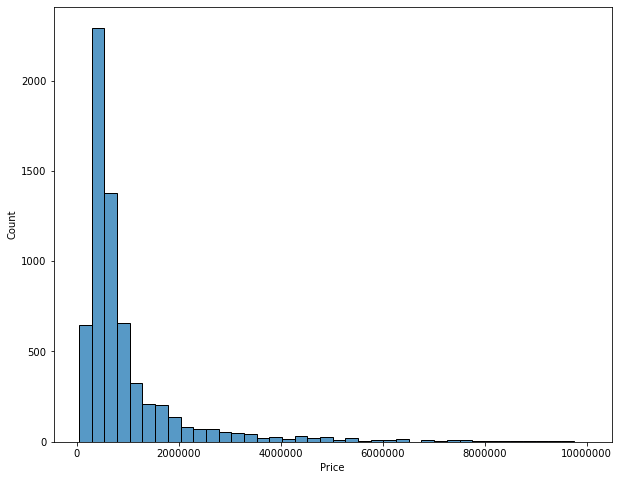

In [963]:
# Checking Target variable

plt.figure(figsize=(10,8))
sns.histplot(df2['Price'],bins=40)
plt.ticklabel_format(style='plain')
plt.show()

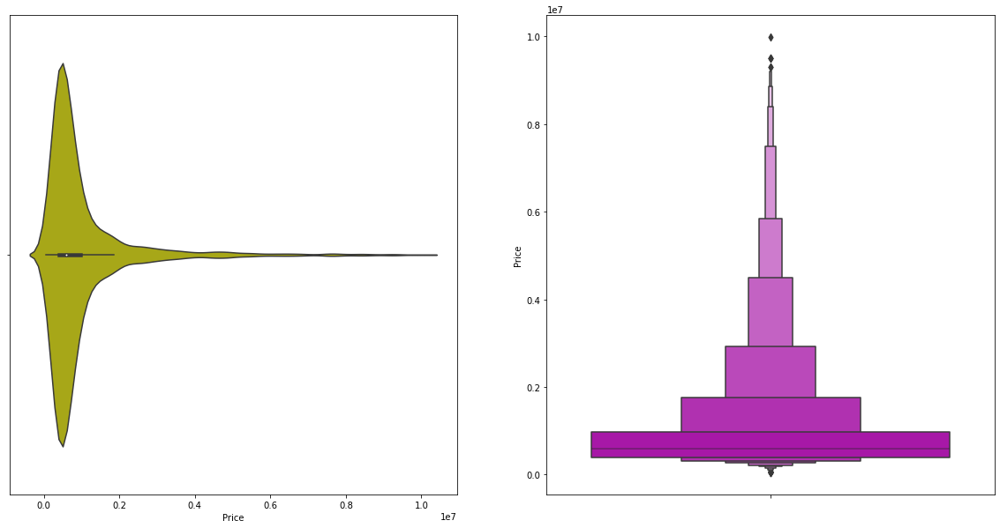

In [965]:
fig, (ax1,ax2)= plt.subplots(1,2,figsize=(20,10))
sns.violinplot(df2.Price,color='y',ax=ax1)
sns.boxenplot(y=df2.Price,color='m',ax=ax2)

plt.show()

We see price majorly lies between 5 to 10 Lakhs. We can say that Indian used car market is generally between this segment. We also see significant number between 10 to 20 lakhs. While getting used car at the range of 30 lakhs or above doesn't show many numbers.

Checking data count

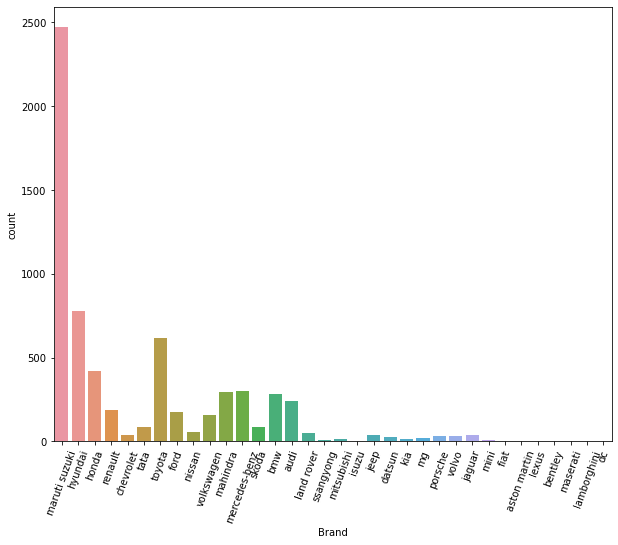

maruti suzuki    37.992005
hyundai          12.007995
toyota            9.471095
honda             6.472940
mercedes-benz     4.658672
mahindra          4.551046
bmw               4.381919
audi              3.705412
renault           2.890529
ford              2.706027
volkswagen        2.429274
tata              1.337638
skoda             1.291513
nissan            0.845633
land rover        0.799508
jeep              0.599631
jaguar            0.584256
chevrolet         0.568881
porsche           0.522755
volvo             0.492005
datsun            0.369004
mg                0.292128
kia               0.230627
mitsubishi        0.184502
ssangyong         0.169127
mini              0.153752
isuzu             0.061501
bentley           0.061501
aston martin      0.046125
fiat              0.030750
maserati          0.030750
lamborghini       0.030750
lexus             0.015375
dc                0.015375
Name: Brand, dtype: float64


In [12]:
plt.figure(figsize=(10,8))
sns.countplot(x='Brand',data=df2)
plt.xticks(rotation=70)
plt.show()
print(df2['Brand'].value_counts(normalize=True)*100)

We see highest numbers for Maruti Suzuki i.e 37.99% followed by hyundai at 12%. No doubt these Brands dominate the mid range market. Also this shows hightrend for resale for these brands. Other fav are toyota and honda.

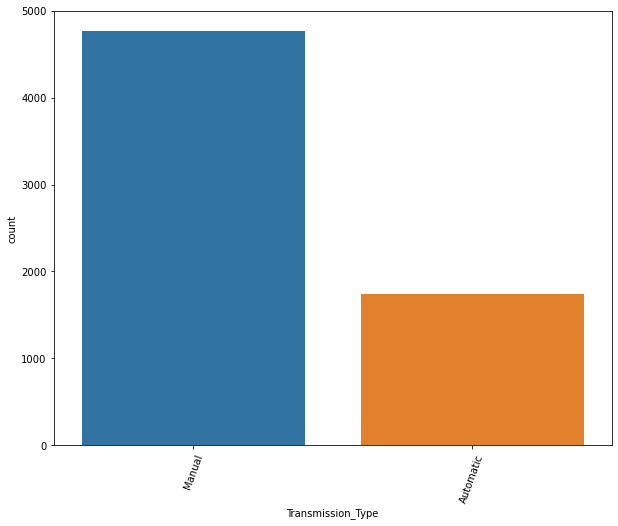

Manual       73.216482
Automatic    26.783518
Name: Transmission_Type, dtype: float64


In [14]:
plt.figure(figsize=(10,8))
sns.countplot(x=df2['Transmission_Type'])
plt.xticks(rotation=70)
plt.show()
print(df2['Transmission_Type'].value_counts(normalize=True)*100)

73.21% vehicles have manual tranmission while 26.78% have automatic.

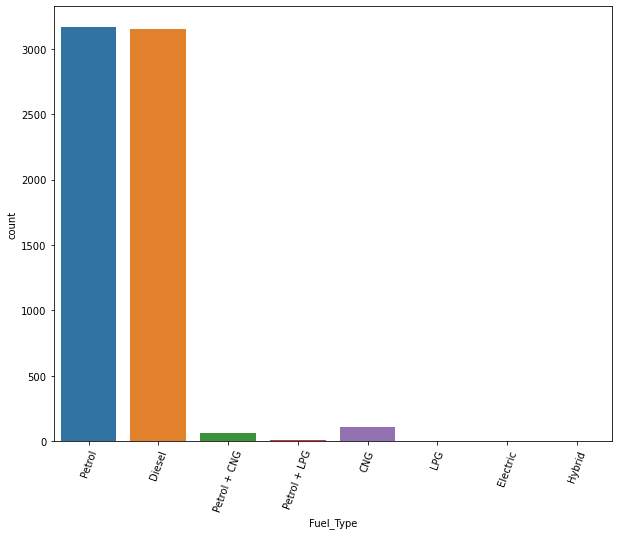

Petrol          48.677737
Diesel          48.477860
CNG              1.706642
Petrol + CNG     0.937884
Petrol + LPG     0.092251
LPG              0.061501
Hybrid           0.030750
Electric         0.015375
Name: Fuel_Type, dtype: float64


In [15]:
plt.figure(figsize=(10,8))
sns.countplot(x=df2['Fuel_Type'])
plt.xticks(rotation=70)
plt.show()
print(df2['Fuel_Type'].value_counts(normalize=True)*100)

Both major fuels have almost equal percentage. only 1.70% cars have CNG. There are some vehicles using duel fuel type and also a Hybrid vehicle.

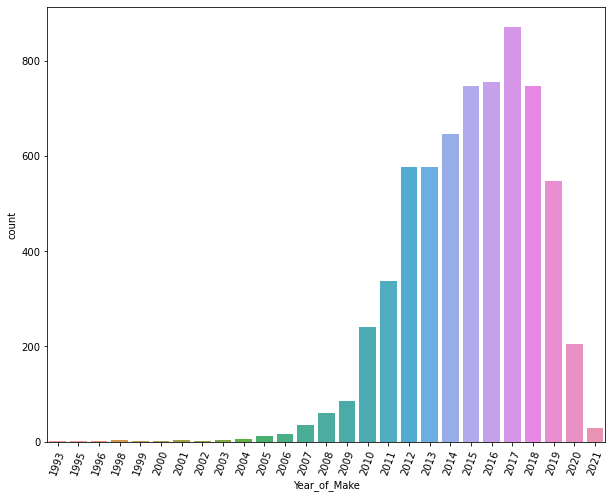

2017    13.376384
2016    11.608241
2015    11.485240
2018    11.469865
2014     9.916974
2013     8.871464
2012     8.856089
2019     8.410209
2011     5.196802
2010     3.690037
2020     3.151907
2009     1.306888
2008     0.907134
2007     0.522755
2021     0.445879
2006     0.246002
2005     0.184502
2004     0.092251
1998     0.061501
2003     0.046125
2001     0.046125
1999     0.030750
2002     0.015375
2000     0.015375
1995     0.015375
1993     0.015375
1996     0.015375
Name: Year_of_Make, dtype: float64


In [17]:
plt.figure(figsize=(10,8))
sns.countplot(x=df2['Year_of_Make'])
plt.xticks(rotation=70)
plt.show()
print(df2['Year_of_Make'].value_counts(normalize=True)*100)

Stats shows that the market is filled with cars that are 3-6 years old. This might mean that people prefer buying this old cars.

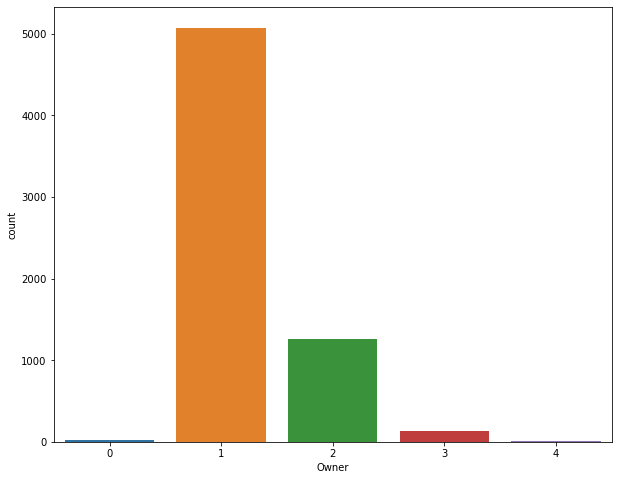

1    78.059656
2    19.449569
3     1.983395
0     0.307503
4     0.199877
Name: Owner, dtype: float64


In [20]:
plt.figure(figsize=(10,8))
sns.countplot(x=df2['Owner'])
plt.show()
print(df2['Owner'].value_counts(normalize=True)*100)

Majority of cars are 1st owner i.e. 78.05%. People usually prefer 1st owned cars. 19.44% are 2nd owner owned cars.

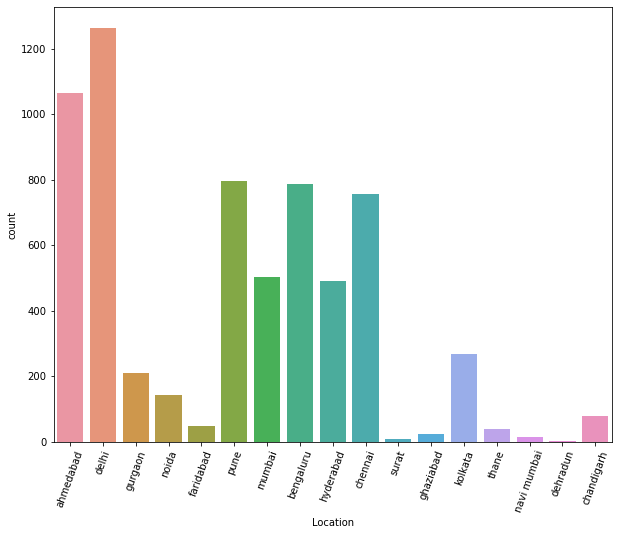

delhi          19.418819
ahmedabad      16.343788
pune           12.238622
bengaluru      12.100246
chennai        11.638991
mumbai          7.718327
hyderabad       7.549200
kolkata         4.135916
gurgaon         3.244157
noida           2.198647
chandigarh      1.245387
faridabad       0.768758
thane           0.630381
ghaziabad       0.369004
navi mumbai     0.215252
surat           0.153752
dehradun        0.030750
Name: Location, dtype: float64


In [21]:
plt.figure(figsize=(10,8))
sns.countplot(x=df2['Location'])
plt.xticks(rotation=70)
plt.show()
print(df2['Location'].value_counts(normalize=True)*100)

19.41% cars are from delhi followed by ahmedabad, pune,bengaluru,chennai with 16.34%, 12.23%, 12.10%, 11.63% stacks.

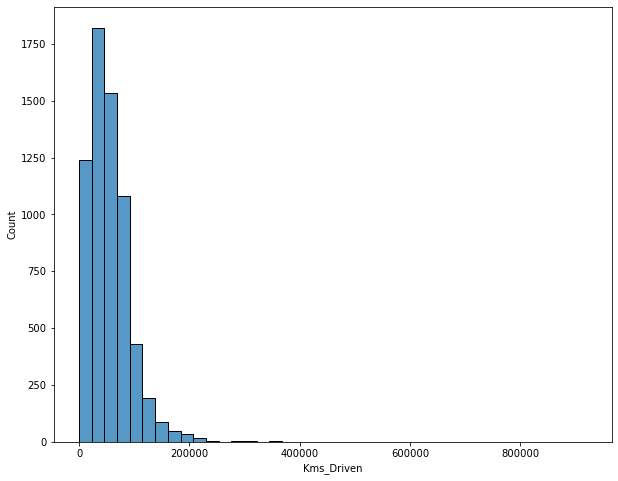

In [23]:
plt.figure(figsize=(10,8))
sns.histplot(x=df2['Kms_Driven'],bins=40)
plt.show()

Majority of vehicles have 20k to 100k on the meter. We see significant numbers between 100k to 200k as well. Some entries show kms higher tha 200k as well.  

# Bivariate Analysis

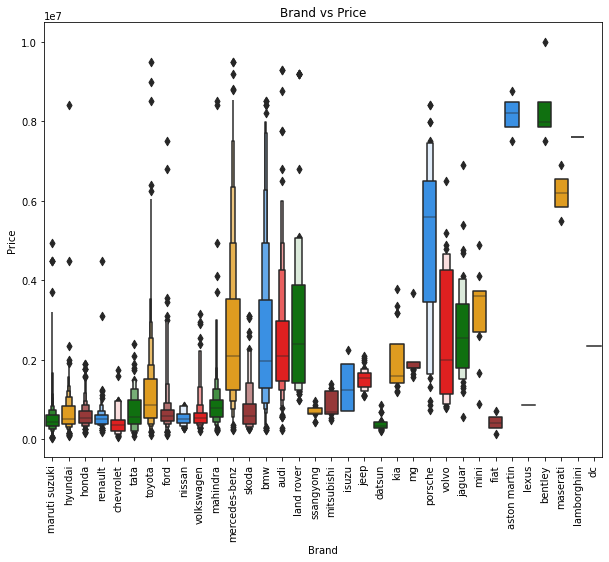

In [41]:
plt.figure(figsize=(10,8))
sns.boxenplot(x=df2['Brand'],y=df2['Price'],palette=['green','orange','brown','dodgerblue','red'])
plt.xticks(rotation=90)
plt.title('Brand vs Price')
plt.show()

Maruti Suzuki brand which has highest share stay on lower price side.Some variants move upto 8000k. We see an extended range in mercedes-benz and bmw having low to high price range. Fiat Datsun marks the lower prices. Porsche though sits on rather expensive section. Bentley Maserati has high prices.

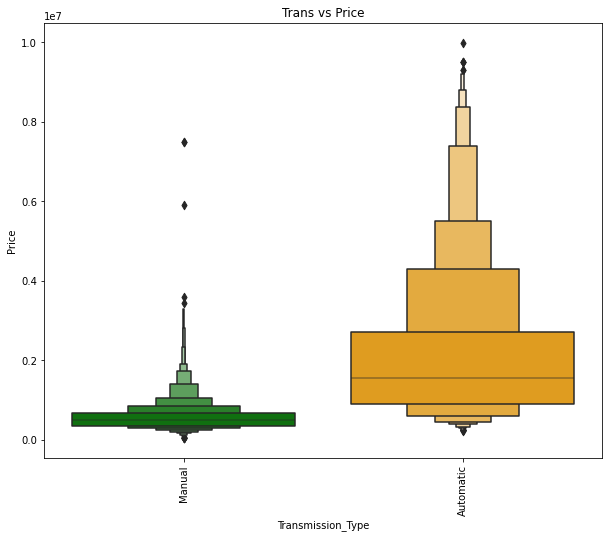

In [40]:
plt.figure(figsize=(10,8))
sns.boxenplot(x=df2['Transmission_Type'],y=df2['Price'],palette=['green','orange','brown','dodgerblue','red'])
plt.xticks(rotation=90)
plt.title('Trans vs Price')
plt.show()

Although we saw higher counts for Manual trans but prices for automatics are on higher side

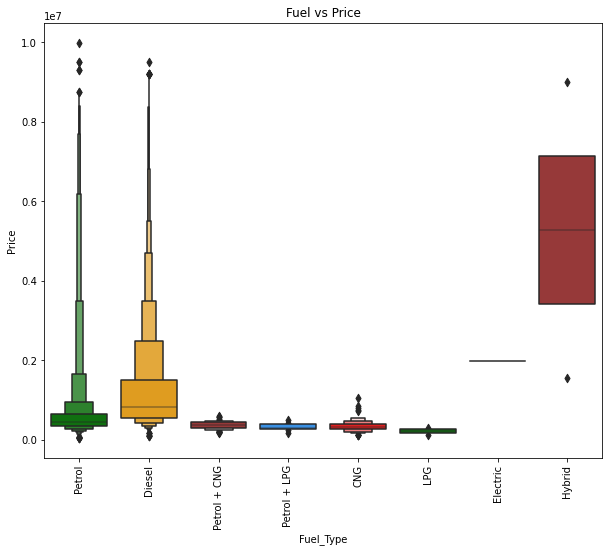

In [39]:
plt.figure(figsize=(10,8))
sns.boxenplot(x=df2['Fuel_Type'],y=df2['Price'],palette=['green','orange','brown','dodgerblue','red'])
plt.xticks(rotation=90)
plt.title('Fuel vs Price')
plt.show()

Both fuels move from low to high range price, however, we see diesel vehicles has extended range in the lower side. Petrol vehicle with low to mid range usually have lower prices.

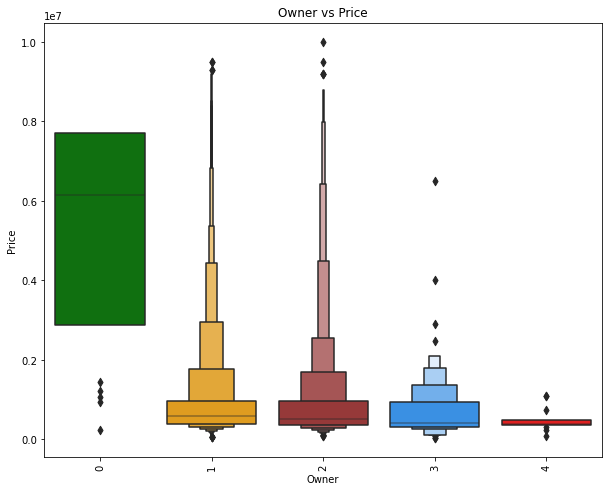

In [38]:
plt.figure(figsize=(10,8))
sns.boxenplot(x=df2['Owner'],y=df2['Price'],palette=['green','orange','brown','dodgerblue','red'])
plt.xticks(rotation=90)
plt.title('Owner vs Price')
plt.show()

Not much difference in price is seen when it comes to Owner count. Although owner count more than 2 has adverse effect on prices

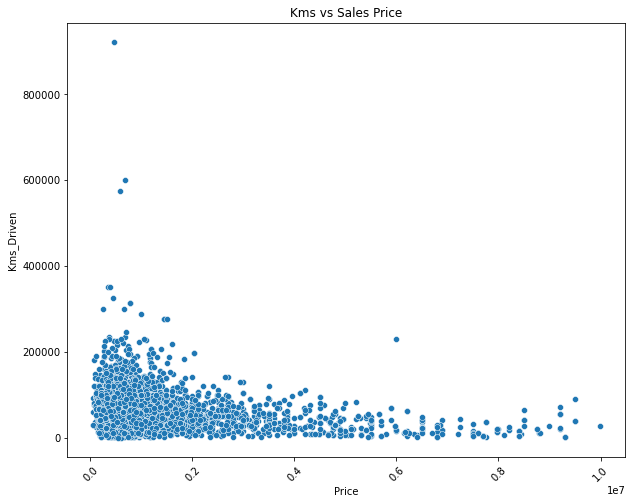

In [34]:
plt.figure(figsize=(10,8))
sns.scatterplot(y=df2['Kms_Driven'],x=df2['Price'],palette=['green','orange','brown','dodgerblue','red'])
plt.xticks(rotation=45)
plt.title('Kms vs Price')
plt.show()

A negative relation is seen. Its obvious cuz the more the car has been driven, more impact it is going to make on its machinery thus, reducing the price.

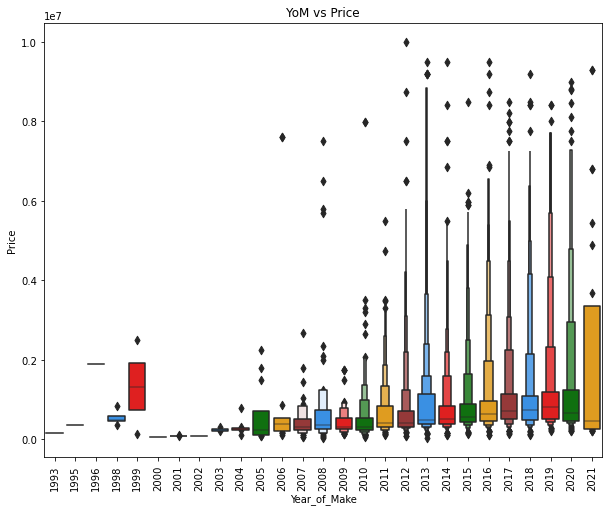

In [42]:
plt.figure(figsize=(10,8))
sns.boxenplot(x=df2['Year_of_Make'],y=df2['Price'],palette=['green','orange','brown','dodgerblue','red'])
plt.xticks(rotation=90)
plt.title('YoM vs Price')
plt.show()

A positive relation with year of make.

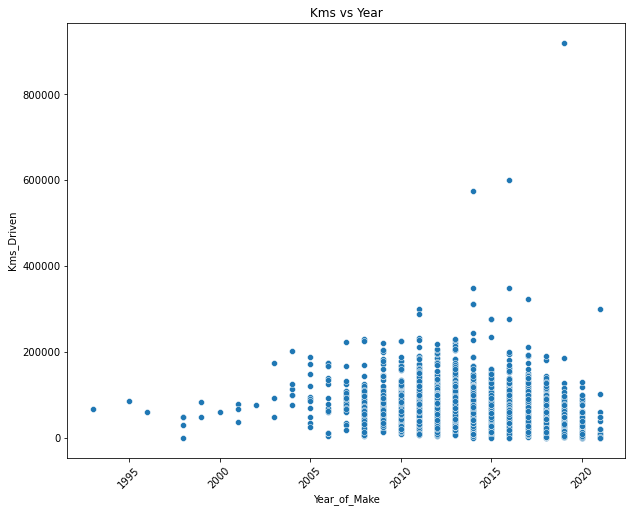

In [45]:
plt.figure(figsize=(10,8))
sns.scatterplot(y=df2['Kms_Driven'],x=df2['Year_of_Make'],palette=['green','orange','brown','dodgerblue','red'])
plt.xticks(rotation=45)
plt.title('Kms vs Year')
plt.show()

# Correlation

In [43]:
df2_cor=df2.corr()

<function matplotlib.pyplot.show(close=None, block=None)>

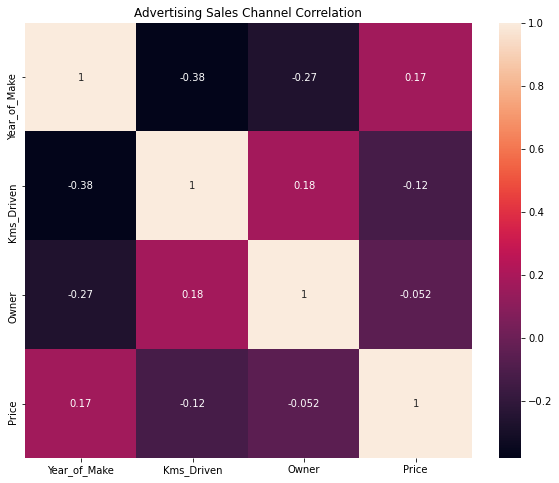

In [44]:
plt.figure(figsize=(10,8))
sns.heatmap(df2_cor,annot=True)
plt.show

# Examining Outliers

In [899]:
df3=df2.copy()

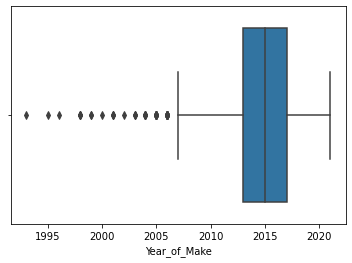

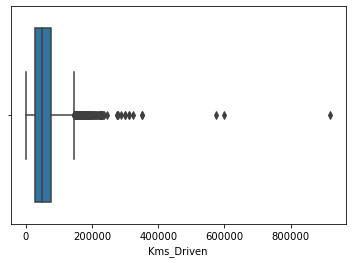

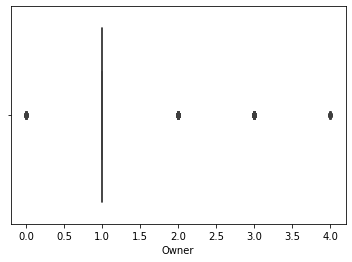

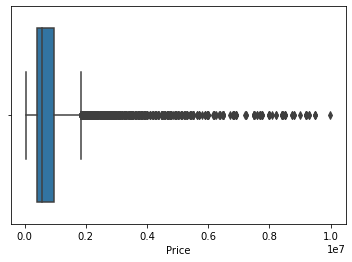

In [901]:
for i in df3.columns:
    if df3[i].dtypes=='int64' or df3[i].dtypes=='int32':
        sns.boxplot(df3[i])
        plt.show()

Lets examine the outlying entrie in the Kms_Driven column

In [902]:
df3[df3['Kms_Driven']>400000]

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location,Price
5487,honda,city,v,Automatic,2016,600000,Petrol,2,delhi,675000
6386,nissan,terrano,xl,Manual,2014,575000,Diesel,2,ahmedabad,575000
6441,maruti suzuki,wagon r,vxi(a),Manual,2019,920000,Petrol,1,chandigarh,459999


Its hardly possible for a car to be driven 920000kms in 2 years. It might be an error entry thus we will drop it

In [903]:
df3=df3[df3['Kms_Driven']<600001]

# Checking Skewness

In [906]:
df3.skew().sort_values(ascending=False)

Price           3.535902
Kms_Driven      2.244174
Owner           1.895080
Year_of_Make   -0.773184
dtype: float64

Correcting skewness in kms driven column

In [907]:
#Importing Power Transform
from sklearn.preprocessing import power_transform

In [908]:
df3['Kms_Driven']=power_transform(df3['Kms_Driven'].values.reshape(-1,1))

In [909]:
df3.skew().sort_values(ascending=False)

Price           3.535902
Owner           1.895080
Kms_Driven      0.021872
Year_of_Make   -0.773184
dtype: float64

# Splitting X nd Y variable

In [911]:
x=df3.drop(['Price'],axis=1)

In [912]:
y=df3['Price']

In [914]:
x.head()

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location
0,maruti suzuki,baleno,delta,Manual,2020,-2.225153,Petrol,1,ahmedabad
1,hyundai,grand i10,magna,Manual,2014,-1.285612,Petrol,1,ahmedabad
2,maruti suzuki,alto 800,vxi,Manual,2014,-1.442261,Petrol,1,ahmedabad
3,maruti suzuki,swift,zxi,Manual,2012,-1.255953,Petrol,1,ahmedabad
4,maruti suzuki,baleno,sigma,Manual,2020,-2.015531,Petrol,1,ahmedabad


In [915]:
y.head()

0    652799
1    372099
2    298899
3    449099
4    568999
Name: Price, dtype: int64

# Encoding

In [917]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()

In [918]:
for i in x.columns:
    if x[i].dtypes=='O':
        x[i]=oe.fit_transform(x[i].values.reshape(-1,1))

# Scaling

In [920]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [921]:
x_new=sc.fit_transform(x)
x=pd.DataFrame(x_new,columns=x.columns)
x.head()

,Brand,Model,Variant,Transmission_Type,Year_of_Make,Kms_Driven,Fuel_Type,Owner,Location
0,0.179936,-1.199793,-0.108383,0.604888,1.619359,-2.225153,0.990482,-0.485324,-1.215429
1,-0.912391,-0.189182,0.432322,0.604888,-0.338625,-1.285612,0.990482,-0.485324,-1.215429
2,0.179936,-1.316966,1.062468,0.604888,-0.338625,-1.442261,0.990482,-0.485324,-1.215429
3,0.179936,1.085067,1.334854,0.604888,-0.991287,-1.255953,0.990482,-0.485324,-1.215429
4,0.179936,-1.199793,0.765690,0.604888,1.619359,-2.015531,0.990482,-0.485324,-1.215429


In [922]:
# Importing Regression Algorithms & Metrics
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso,Ridge,ElasticNet
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

# Finding best random state

In [924]:
maxAccu=0
maxRs=0
for i in range(1,500):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.33,random_state=i)
    dtr=DecisionTreeRegressor()
    dtr.fit(x_train,y_train)
    dtr_pred=dtr.predict(x_test)
    acc=r2_score(y_test,dtr_pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRs=i
print('Best R2 Score is : ', maxAccu, ' when Random state is : ',maxRs)

Best R2 Score is :  0.7294346985893442  when Random state is :  359


In [925]:
# Selecting random state
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.33,random_state=359)

In [926]:
# Defining Model List which support Multi Regression
model_list=[LinearRegression(),SVR(),DecisionTreeRegressor(),KNeighborsRegressor(),RandomForestRegressor(),GradientBoostingRegressor(),AdaBoostRegressor(),Lasso(),Ridge(),ElasticNet(),XGBRegressor(verbosity=0)]

In [927]:
# Creating For loop to print Training and Test R2 score
for m in model_list:
    model=m
    model.fit(x_train,y_train)
    model_pred_train=model.predict(x_train)
    model_pred=model.predict(x_test)
    print('Training Accuracy for the model ',m,' is: ',r2_score(y_train,model_pred_train)*100)
    print('Testing Accuracy for the model ',m,' is: ',r2_score(y_test,model_pred)*100)
    print('\n')

Training Accuracy for the model  LinearRegression()  is:  38.702460021180876
Testing Accuracy for the model  LinearRegression()  is:  40.92322281532298


Training Accuracy for the model  SVR()  is:  -11.31517392885426
Testing Accuracy for the model  SVR()  is:  -11.779494395290913


Training Accuracy for the model  DecisionTreeRegressor()  is:  99.99967835233548
Testing Accuracy for the model  DecisionTreeRegressor()  is:  64.5410033135156


Training Accuracy for the model  KNeighborsRegressor()  is:  73.13932008093606
Testing Accuracy for the model  KNeighborsRegressor()  is:  65.82906931969839


Training Accuracy for the model  RandomForestRegressor()  is:  96.5376056121299
Testing Accuracy for the model  RandomForestRegressor()  is:  83.277838811492


Training Accuracy for the model  GradientBoostingRegressor()  is:  76.73881120907647
Testing Accuracy for the model  GradientBoostingRegressor()  is:  74.3953174999825


Training Accuracy for the model  AdaBoostRegressor()  is:  41.292

# Cross validation

In [928]:
from sklearn.model_selection import cross_val_score

In [929]:
# Linear Regression
lr=LinearRegression()
lr.fit(x_train,y_train)
lr_pred=lr.predict(x_test)
testing_accu=r2_score(y_test,lr_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(lr,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score is 22.431666400034306 and the accuracy for testing is 40.92322281532298 


At crossfold 3 the CV score is -17.232545331227247 and the accuracy for testing is 40.92322281532298 


At crossfold 4 the CV score is 6.6949615932318185 and the accuracy for testing is 40.92322281532298 


At crossfold 5 the CV score is -4.584059221405692 and the accuracy for testing is 40.92322281532298 


At crossfold 6 the CV score is -9.395589570144697 and the accuracy for testing is 40.92322281532298 


At crossfold 7 the CV score is 0.4638796756974539 and the accuracy for testing is 40.92322281532298 


At crossfold 8 the CV score is -20.499131640613825 and the accuracy for testing is 40.92322281532298 


At crossfold 9 the CV score is -7.186345363163535 and the accuracy for testing is 40.92322281532298 




In [930]:
# DecisionTreeClassifier
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
dtr_pred=dtr.predict(x_test)
testing_accu=r2_score(y_test,dtr_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(dtr,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score is 27.8783056553788 and the accuracy for testing is 69.11563268537093 


At crossfold 3 the CV score is 14.829062982835998 and the accuracy for testing is 69.11563268537093 


At crossfold 4 the CV score is 2.1585437965728427 and the accuracy for testing is 69.11563268537093 


At crossfold 5 the CV score is 18.616737506282323 and the accuracy for testing is 69.11563268537093 


At crossfold 6 the CV score is 22.066212685477836 and the accuracy for testing is 69.11563268537093 


At crossfold 7 the CV score is 10.558577907085935 and the accuracy for testing is 69.11563268537093 


At crossfold 8 the CV score is -35.0619309963071 and the accuracy for testing is 69.11563268537093 


At crossfold 9 the CV score is 41.07406797223738 and the accuracy for testing is 69.11563268537093 




In [931]:
# KNeighbor Regressor
knn=KNeighborsRegressor()
knn.fit(x_train,y_train)
knn_pred=knn.predict(x_test)
testing_accu=r2_score(y_test,knn_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(knn,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score is 30.464496185895385 and the accuracy for testing is 65.82906931969839 


At crossfold 3 the CV score is 3.8072844553422933 and the accuracy for testing is 65.82906931969839 


At crossfold 4 the CV score is 26.1330571881212 and the accuracy for testing is 65.82906931969839 


At crossfold 5 the CV score is 26.48647309689312 and the accuracy for testing is 65.82906931969839 


At crossfold 6 the CV score is 21.15780187603882 and the accuracy for testing is 65.82906931969839 


At crossfold 7 the CV score is 24.79509056312244 and the accuracy for testing is 65.82906931969839 


At crossfold 8 the CV score is 21.656414287784138 and the accuracy for testing is 65.82906931969839 


At crossfold 9 the CV score is 34.93305836911589 and the accuracy for testing is 65.82906931969839 




# Ensemble methods

In [932]:
# RandomForestRegressor
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)
rfr_pred=rfr.predict(x_test)
testing_accu=r2_score(y_test,rfr_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(rfr,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score is 50.271079111530305 and the accuracy for testing is 83.86798830172366 


At crossfold 3 the CV score is 49.602643205975426 and the accuracy for testing is 83.86798830172366 


At crossfold 4 the CV score is 60.660902445590615 and the accuracy for testing is 83.86798830172366 


At crossfold 5 the CV score is 62.28660835795182 and the accuracy for testing is 83.86798830172366 


At crossfold 6 the CV score is 57.59761203429138 and the accuracy for testing is 83.86798830172366 


At crossfold 7 the CV score is 59.47892355578504 and the accuracy for testing is 83.86798830172366 


At crossfold 8 the CV score is 60.88672829063617 and the accuracy for testing is 83.86798830172366 


At crossfold 9 the CV score is 70.7781355921376 and the accuracy for testing is 83.86798830172366 




In [933]:
# Cross validating GradientBoostingRegressor

gbr = GradientBoostingRegressor()
gbr.fit(x_train, y_train)
gbr_pred=gbr.predict(x_test)
testing_accu=r2_score(y_test,gbr_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(gbr,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score is 53.98965639739538 and the accuracy for testing is 74.41227759087663 


At crossfold 3 the CV score is 47.52980382935619 and the accuracy for testing is 74.41227759087663 


At crossfold 4 the CV score is 55.70648790428257 and the accuracy for testing is 74.41227759087663 


At crossfold 5 the CV score is 53.0353365337675 and the accuracy for testing is 74.41227759087663 


At crossfold 6 the CV score is 51.490415942381915 and the accuracy for testing is 74.41227759087663 


At crossfold 7 the CV score is 55.509289859008994 and the accuracy for testing is 74.41227759087663 


At crossfold 8 the CV score is 52.21515514720117 and the accuracy for testing is 74.41227759087663 


At crossfold 9 the CV score is 56.99307265365883 and the accuracy for testing is 74.41227759087663 




In [934]:
# Cross validating Ada Boost Regressor

adb = AdaBoostRegressor()
adb.fit(x_train, y_train)
adb_pred=adb.predict(x_test)
testing_accu=r2_score(y_test,adb_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(adb,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score is 17.05948716290052 and the accuracy for testing is 40.74985146847815 


At crossfold 3 the CV score is -69.06262058635924 and the accuracy for testing is 40.74985146847815 


At crossfold 4 the CV score is -26.167879755041916 and the accuracy for testing is 40.74985146847815 


At crossfold 5 the CV score is -53.5333874305041 and the accuracy for testing is 40.74985146847815 


At crossfold 6 the CV score is -62.79131776542545 and the accuracy for testing is 40.74985146847815 


At crossfold 7 the CV score is -19.708051089642872 and the accuracy for testing is 40.74985146847815 


At crossfold 8 the CV score is -69.5465895047706 and the accuracy for testing is 40.74985146847815 


At crossfold 9 the CV score is -52.22245287543763 and the accuracy for testing is 40.74985146847815 




# Extreme Gradient boosting

In [935]:
xgb = XGBRegressor(verbosity=0)
xgb.fit(x_train, y_train)
xgb_pred=xgb.predict(x_test)
testing_accu=r2_score(y_test,xgb_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(xgb,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score is 57.8540483643537 and the accuracy for testing is 84.24116877849315 


At crossfold 3 the CV score is 53.94856819878431 and the accuracy for testing is 84.24116877849315 


At crossfold 4 the CV score is 64.58708885136011 and the accuracy for testing is 84.24116877849315 


At crossfold 5 the CV score is 65.79083999258665 and the accuracy for testing is 84.24116877849315 


At crossfold 6 the CV score is 61.11594005952541 and the accuracy for testing is 84.24116877849315 


At crossfold 7 the CV score is 64.91761458609027 and the accuracy for testing is 84.24116877849315 


At crossfold 8 the CV score is 63.936612779381896 and the accuracy for testing is 84.24116877849315 


At crossfold 9 the CV score is 74.55769334455022 and the accuracy for testing is 84.24116877849315 




As we see ensemble techniques seems to work better here. We will check some other metrics to examine the the top three performer.

In [952]:
print('Random Forest Regression')
print('Mean Squared Error of the model is ',mean_squared_error(y_test,rfr_pred))
print('Mean Absolute Error of the model is ',mean_absolute_error(y_test,rfr_pred))
print('Root Mean Squared Error of the model is ',np.sqrt(mean_squared_error(y_test,rfr_pred)))
print('-----------------------------------')
print('Gradient Boosting Regression')
print('Mean Squared Error of the model is ',mean_squared_error(y_test,gbr_pred))
print('Mean Absolute Error of the model is ',mean_absolute_error(y_test,gbr_pred))
print('Root Mean Squared Error of the model is ',np.sqrt(mean_squared_error(y_test,gbr_pred)))
print('-----------------------------------')
print('XGB Regression')
print('Mean Squared Error of the model is ',mean_squared_error(y_test,xgb_pred))
print('Mean Absolute Error of the model is ',mean_absolute_error(y_test,xgb_pred))
print('Root Mean Squared Error of the model is ',np.sqrt(mean_squared_error(y_test,xgb_pred)))
print('-----------------------------------')

Random Forest Regression
Mean Squared Error of the model is  251667454321.6702
Mean Absolute Error of the model is  209721.91293880087
Root Mean Squared Error of the model is  501664.68315167475
-----------------------------------
Gradient Boosting Regression
Mean Squared Error of the model is  399181272679.1964
Mean Absolute Error of the model is  313069.54416096443
Root Mean Squared Error of the model is  631807.9397088932
-----------------------------------
XGB Regression
Mean Squared Error of the model is  245845652159.13156
Mean Absolute Error of the model is  210884.81589999382
Root Mean Squared Error of the model is  495828.2486498037
-----------------------------------


As we see, R2 score is highest for XGB. At cross validation as well minimum difference was observed in the same. Also, MAE and RMSE is also minimum as compare to other two. We move ahead to hypertune the model to check for enhancement

# Hypertuning

In [954]:
# Importing Random Search CV

from sklearn.model_selection import RandomizedSearchCV

In [955]:
gbr_param={'loss':['ls','lad','huber','quantile'],'learning_rate' :[0.001,0.01,0.1,0.2,0.3],'n_estimators':list(range(50,400,50)),'max_depth' : np.arange(2,15),'criterion':['friedman_mse','mse','mae'],'max_features':['auto', 'sqrt', 'log2']}
rcv_gbr=RandomizedSearchCV(estimator=gbr,param_distributions=gbr_param,scoring='r2',cv=5)

In [956]:
rcv_gbr.fit(x_train,y_train)
rcv_gbr.best_params_

{'n_estimators': 150,
 'max_features': 'sqrt',
 'max_depth': 8,
 'loss': 'ls',
 'learning_rate': 0.2,
 'criterion': 'friedman_mse'}

In [957]:
# Cross validating GradientBoostingRegressor

gbr1 = GradientBoostingRegressor(n_estimators=150,max_features='sqrt',max_depth=8,loss='ls',learning_rate=0.2,criterion='friedman_mse')
gbr1.fit(x_train, y_train)
gbr1_pred=gbr1.predict(x_test)
testing_accu=r2_score(y_test,gbr1_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(gbr1,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

print('Mean Squared Error of the model is ',mean_squared_error(y_test,gbr1_pred))
print('Mean Absolute Error of the model is ',mean_absolute_error(y_test,gbr1_pred))
print('Root Mean Squared Error of the model is ',np.sqrt(mean_squared_error(y_test,gbr1_pred)))

At crossfold 2 the CV score is 55.7757436774573 and the accuracy for testing is 84.7605692094152 


At crossfold 3 the CV score is 52.45664275175491 and the accuracy for testing is 84.7605692094152 


At crossfold 4 the CV score is 62.79495693173942 and the accuracy for testing is 84.7605692094152 


At crossfold 5 the CV score is 68.08027297282152 and the accuracy for testing is 84.7605692094152 


At crossfold 6 the CV score is 63.867203772806555 and the accuracy for testing is 84.7605692094152 


At crossfold 7 the CV score is 62.9115719728544 and the accuracy for testing is 84.7605692094152 


At crossfold 8 the CV score is 63.958114933813626 and the accuracy for testing is 84.7605692094152 


At crossfold 9 the CV score is 71.57060165162248 and the accuracy for testing is 84.7605692094152 


Mean Squared Error of the model is  237742745549.05917
Mean Absolute Error of the model is  192681.5187157498
Root Mean Squared Error of the model is  487588.70531325805


After hypertuning we see and increase in CV score at cv=5. Also, we see a reduction in MAE and RMSE. Thus, we move ahead with hypertuned XGB model as our final

# Plotting the Graph to Visualize Prediction

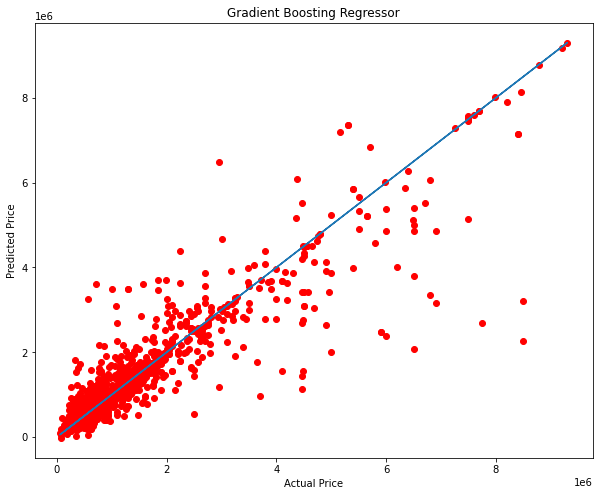

In [958]:
plt.figure(figsize=(10,8))
plt.scatter(x=y_test,y=gbr1_pred,color='r')
plt.plot(y_test,y_test)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title("Gradient Boosting Regressor")
plt.show()

# Saving the model

In [959]:
import pickle
filename='used_car_price.pkl'
pickle.dump(gbr1,open(filename,'wb'))